# Modelos

## Modelo Bootstrapping

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.ar_model import AutoReg
from scipy.stats import wasserstein_distance

class BootstrappingModel:
    """Modelo para generar distribuciones predictivas usando bootstrapping"""
    
    def __init__(self, random_state=42):
        self.n_lags = None
        self.random_state = random_state
        self.model = None
        self.mean_val = None
        self.std_val = None

    def prepare_data(self, df):
        """Prepara los datos normalizando"""
        values = df['valor'].values
        self.mean_val = np.mean(values)
        self.std_val = np.std(values)
        
        print("🛠️ Normalizando datos...")
        print(f"   Media calculada: {self.mean_val:.2f}")
        print(f"   Desviación estándar calculada: {self.std_val:.2f}")
        
        return (values - self.mean_val) / self.std_val

    def denormalize(self, values):
        """Desnormaliza los valores para volver a la escala original"""
        return values * self.std_val + self.mean_val

    def fit_predict(self, df, n_boot=1000):
        """Ajusta el modelo y genera predicciones bootstrap"""
        normalized_values = self.prepare_data(df)
        
        print("\n🔧 Ajustando modelo AutoReg...")
        self.model = AutoReg(normalized_values, lags=self.n_lags, old_names=False)
        fitted_model = self.model.fit()
        
        # Mostrar parámetros del modelo
        print(f"✅ Modelo ajustado con {self.n_lags} lags")
        print(f"   Coeficientes: {fitted_model.params.round(2)}")
        
        # Generar predicciones
        predictions = fitted_model.forecast(steps=1)
        residuals = fitted_model.resid
        
        # Visualizar residuos
        plt.figure(figsize=(10, 4))
        plt.hist(residuals, bins=30, edgecolor='k', alpha=0.7)
        plt.title(f"Distribución de Residuos (Lags={self.n_lags})")
        plt.xlabel("Valor del Residuo")
        plt.ylabel("Frecuencia")
        plt.show()

        # Bootstrapping
        rng = np.random.default_rng(seed=self.random_state)
        boot_predictions = predictions + rng.choice(residuals, size=n_boot, replace=True)
        
        # Visualizar predicciones bootstrap
        plt.figure(figsize=(10, 4))
        plt.hist(boot_predictions, bins=30, edgecolor='k', alpha=0.7, color='green')
        plt.title(f"Predicciones Bootstrap Normalizadas (Lags={self.n_lags})")
        plt.xlabel("Valor Predicho Normalizado")
        plt.ylabel("Frecuencia")
        plt.show()

        # Desnormalizar
        boot_predictions = self.denormalize(boot_predictions)
        
        return boot_predictions

    def calculate_wasserstein(self, distribution, real_noise):
        """Calcula la distancia de Wasserstein entre dos distribuciones"""
        distance = wasserstein_distance(distribution, real_noise)
        
        print(f"📏 Distancia de Wasserstein: {distance:.4f}")
        return distance

    def grid_search(self, df, real_noise, lags_range=range(1, 13), n_boot=500):
        """Búsqueda en malla para encontrar el mejor n_lags usando Wasserstein"""
        best_distance = float('inf')
        best_lag = None
        distances = []

        plt.figure(figsize=(10, 6))
        
        for n_lags in lags_range:
            print(f"\n🔍 Probando lag={n_lags}")
            self.n_lags = n_lags
            try:
                distribution = self.fit_predict(df, n_boot=n_boot)
                current_distance = self.calculate_wasserstein(distribution, real_noise)
                distances.append(current_distance)
                
                if current_distance < best_distance:
                    best_distance = current_distance
                    best_lag = n_lags
                    
            except Exception as e:
                print(f"❌ Error con lag={n_lags}: {str(e)}")
                distances.append(np.nan)
                continue

        # Visualizar resultados de la búsqueda
        plt.plot(lags_range, distances, marker='o', linestyle='--')
        plt.scatter(best_lag, best_distance, color='red', s=200, label='Mejor Lag')
        plt.title("Evolución de la Distancia de Wasserstein")
        plt.xlabel("Número de Lags")
        plt.ylabel("Distancia de Wasserstein")
        plt.legend()
        plt.grid(True)
        plt.show()

        self.n_lags = best_lag
        print(f"\n🎉 Mejor n_lags encontrado: {self.n_lags} (Wasserstein = {best_distance:.4f})")
        return best_lag

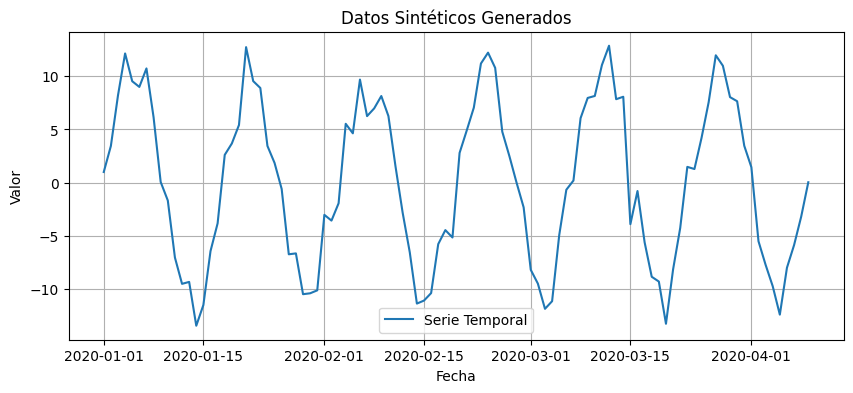


🔍 Probando lag=1
🛠️ Normalizando datos...
   Media calculada: 0.04
   Desviación estándar calculada: 7.60

🔧 Ajustando modelo AutoReg...
✅ Modelo ajustado con 1 lags
   Coeficientes: [-0.    0.88]


<Figure size 1000x600 with 0 Axes>

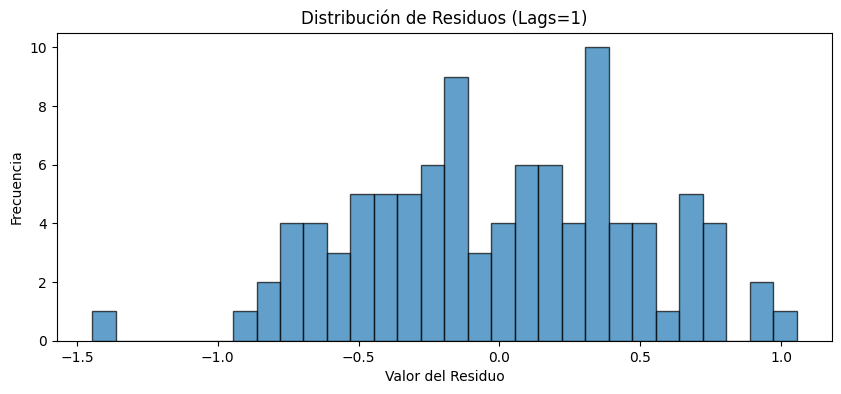

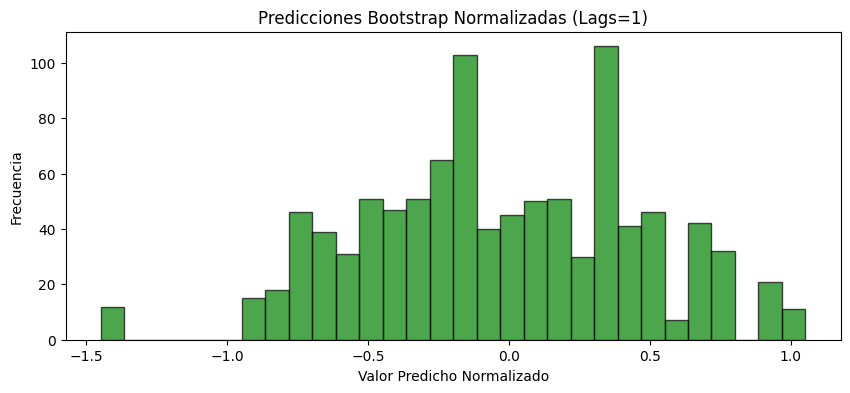

📏 Distancia de Wasserstein: 1.1243

🔍 Probando lag=2
🛠️ Normalizando datos...
   Media calculada: 0.04
   Desviación estándar calculada: 7.60

🔧 Ajustando modelo AutoReg...
✅ Modelo ajustado con 2 lags
   Coeficientes: [-0.    1.18 -0.35]


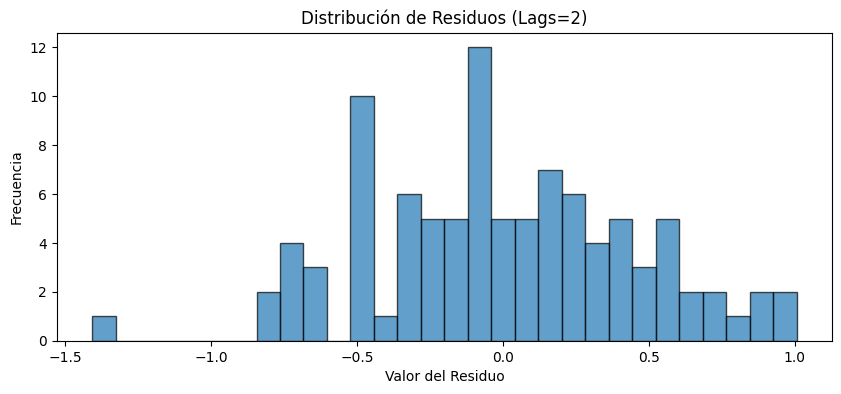

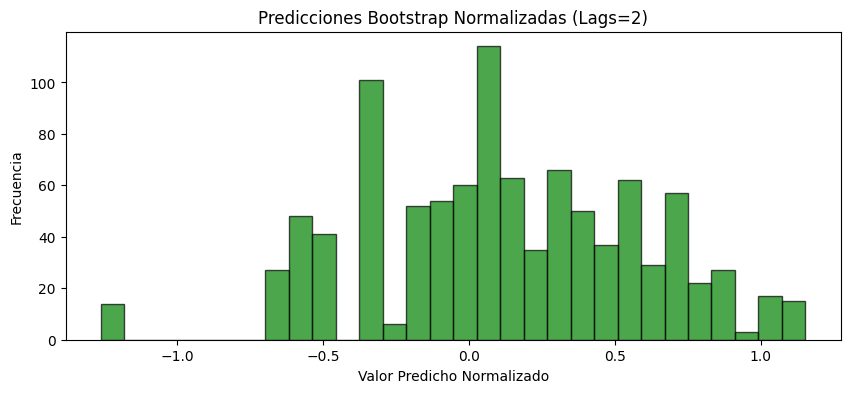

📏 Distancia de Wasserstein: 1.1607

🔍 Probando lag=3
🛠️ Normalizando datos...
   Media calculada: 0.04
   Desviación estándar calculada: 7.60

🔧 Ajustando modelo AutoReg...
✅ Modelo ajustado con 3 lags
   Coeficientes: [-0.01  1.    0.24 -0.5 ]


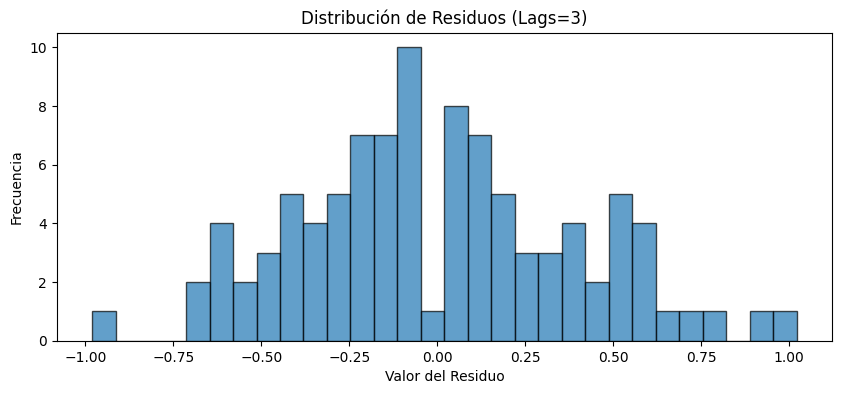

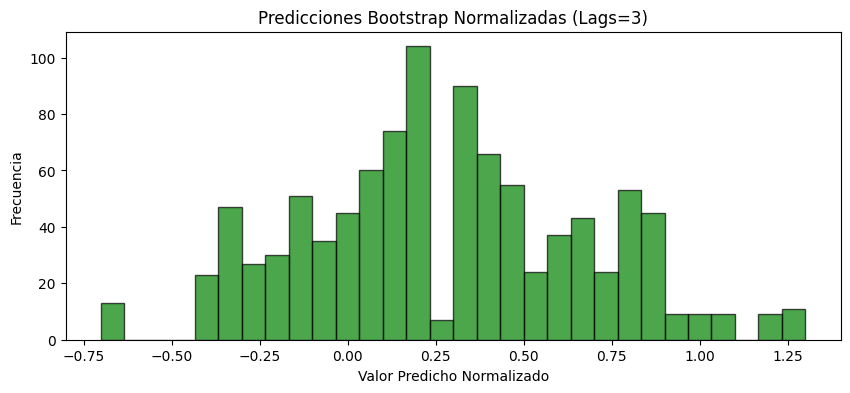

📏 Distancia de Wasserstein: 2.0347

🔍 Probando lag=4
🛠️ Normalizando datos...
   Media calculada: 0.04
   Desviación estándar calculada: 7.60

🔧 Ajustando modelo AutoReg...
✅ Modelo ajustado con 4 lags
   Coeficientes: [-0.01  0.75  0.36 -0.02 -0.47]


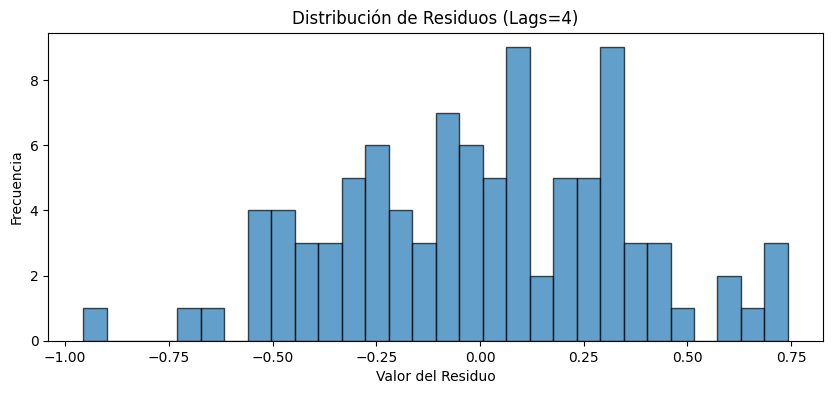

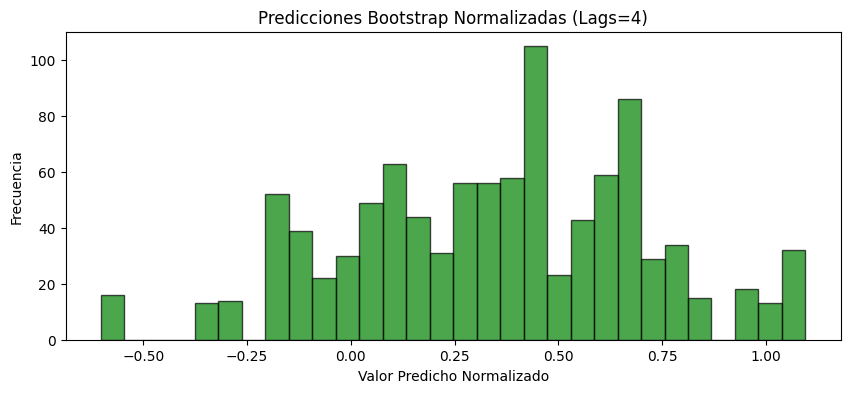

📏 Distancia de Wasserstein: 2.5776

🔍 Probando lag=5
🛠️ Normalizando datos...
   Media calculada: 0.04
   Desviación estándar calculada: 7.60

🔧 Ajustando modelo AutoReg...
✅ Modelo ajustado con 5 lags
   Coeficientes: [-0.    0.62  0.36  0.07 -0.25 -0.28]


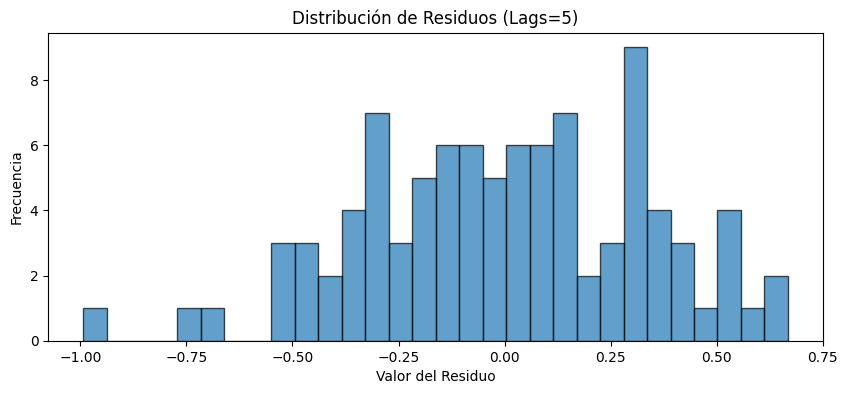

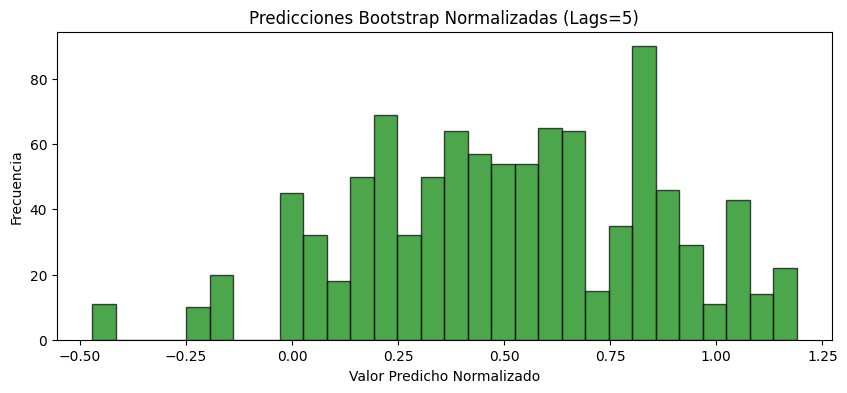

📏 Distancia de Wasserstein: 3.7919

🔍 Probando lag=6
🛠️ Normalizando datos...
   Media calculada: 0.04
   Desviación estándar calculada: 7.60

🔧 Ajustando modelo AutoReg...
✅ Modelo ajustado con 6 lags
   Coeficientes: [-0.    0.49  0.24  0.11 -0.09  0.01 -0.47]


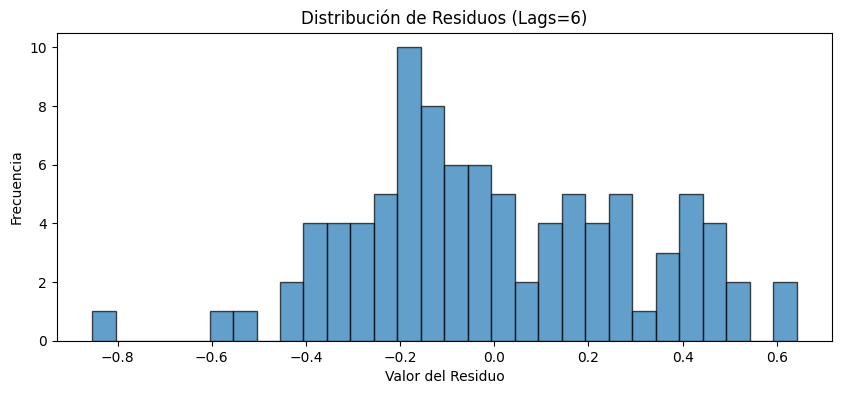

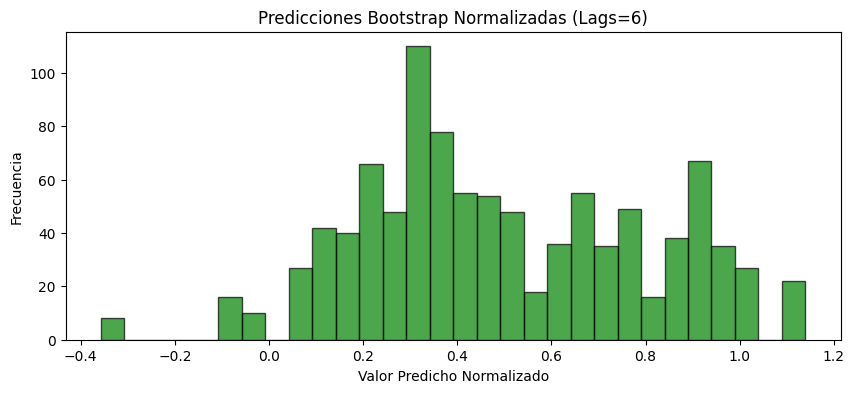

📏 Distancia de Wasserstein: 3.6966

🔍 Probando lag=7
🛠️ Normalizando datos...
   Media calculada: 0.04
   Desviación estándar calculada: 7.60

🔧 Ajustando modelo AutoReg...
✅ Modelo ajustado con 7 lags
   Coeficientes: [-0.01  0.34  0.25  0.05 -0.06  0.1  -0.31 -0.32]


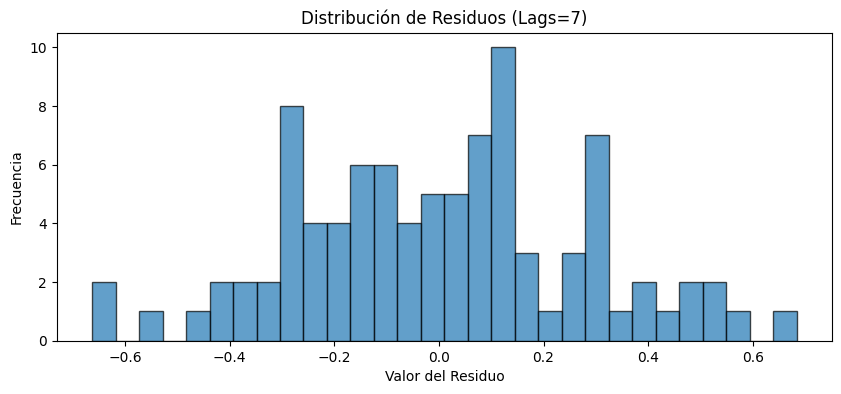

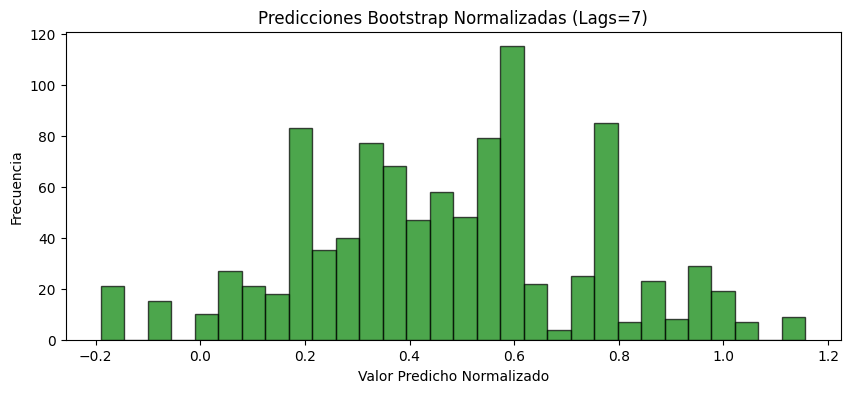

📏 Distancia de Wasserstein: 3.4776

🔍 Probando lag=8
🛠️ Normalizando datos...
   Media calculada: 0.04
   Desviación estándar calculada: 7.60

🔧 Ajustando modelo AutoReg...
✅ Modelo ajustado con 8 lags
   Coeficientes: [-0.01  0.22  0.15  0.09 -0.09  0.12 -0.22 -0.21 -0.34]


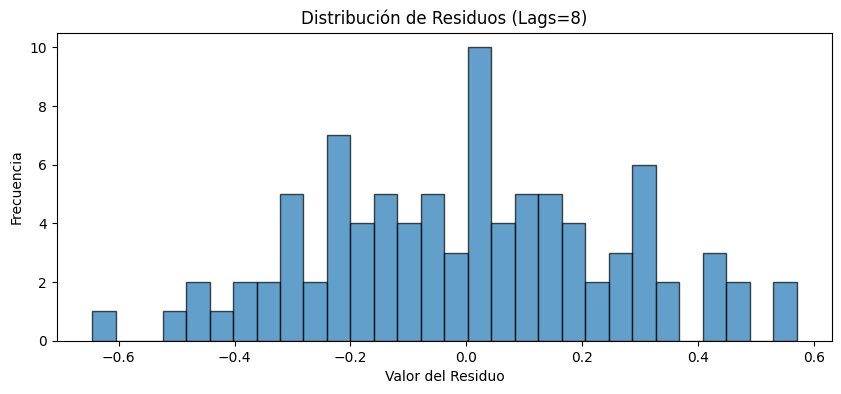

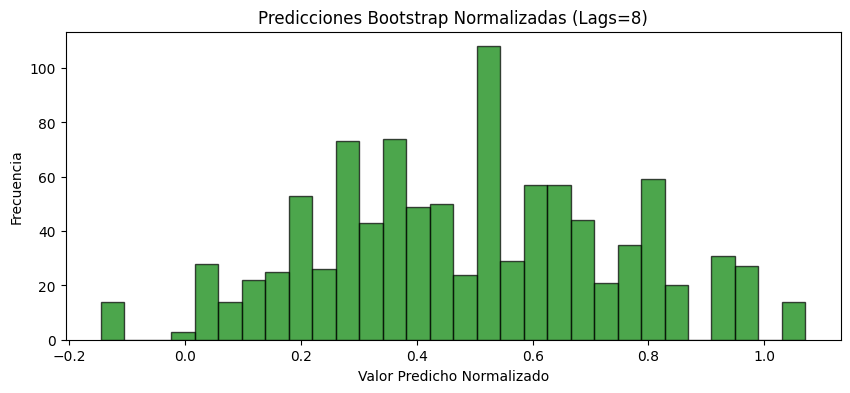

📏 Distancia de Wasserstein: 3.6445

🔍 Probando lag=9
🛠️ Normalizando datos...
   Media calculada: 0.04
   Desviación estándar calculada: 7.60

🔧 Ajustando modelo AutoReg...
✅ Modelo ajustado con 9 lags
   Coeficientes: [-0.01  0.19  0.14  0.05 -0.09  0.13 -0.21 -0.2  -0.31 -0.11]


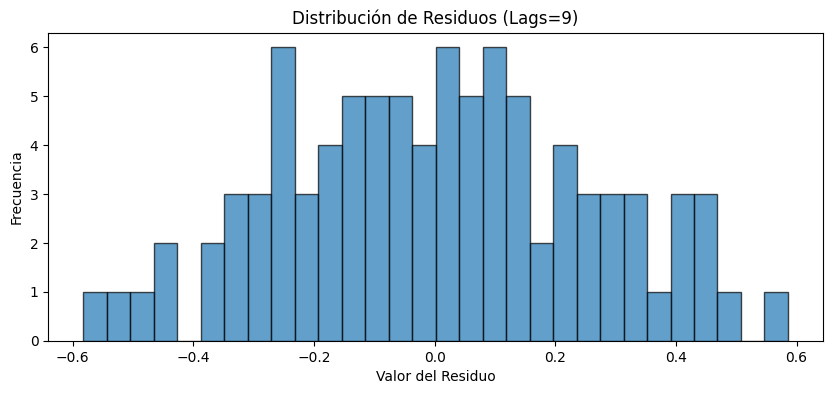

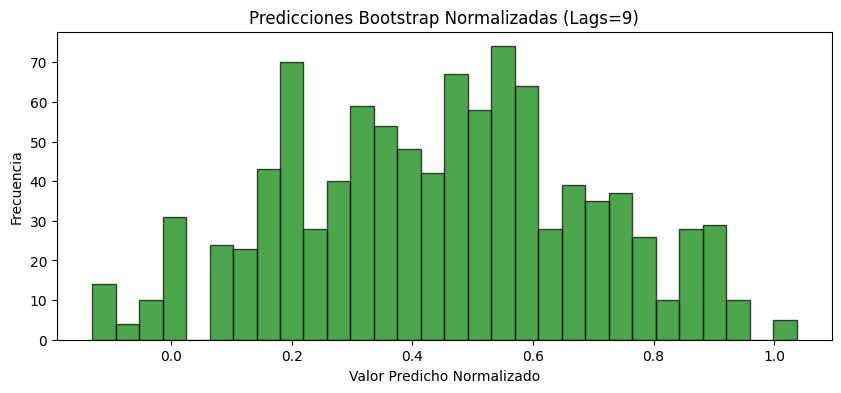

📏 Distancia de Wasserstein: 3.3063

🔍 Probando lag=10
🛠️ Normalizando datos...
   Media calculada: 0.04
   Desviación estándar calculada: 7.60

🔧 Ajustando modelo AutoReg...
✅ Modelo ajustado con 10 lags
   Coeficientes: [-0.01  0.17  0.07 -0.01 -0.12  0.16 -0.23 -0.18 -0.28 -0.08 -0.21]


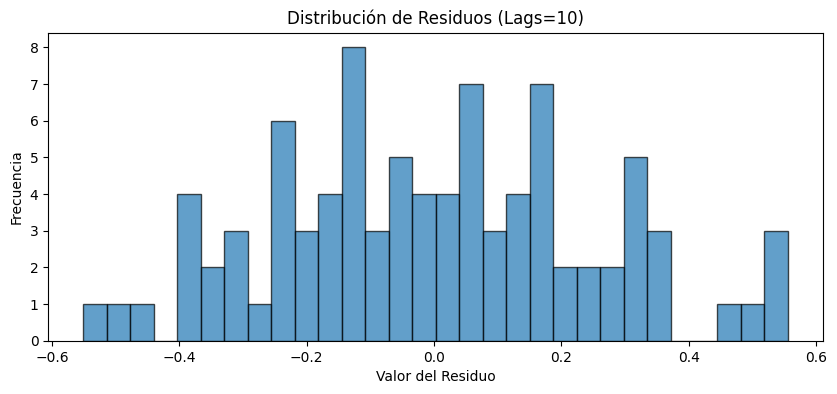

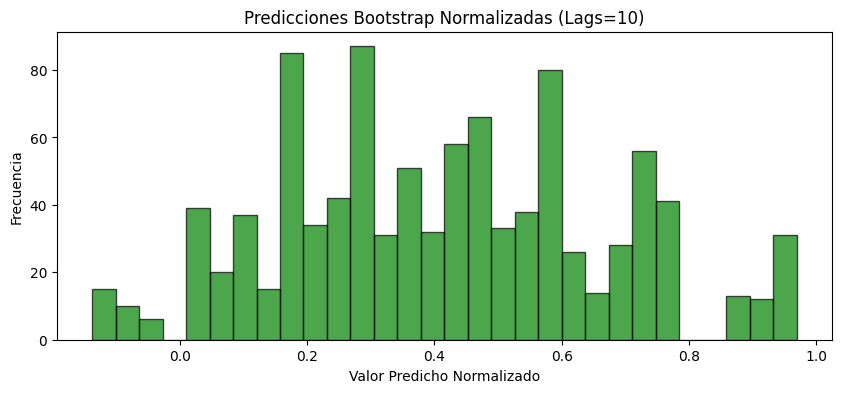

📏 Distancia de Wasserstein: 3.0772

🔍 Probando lag=11
🛠️ Normalizando datos...
   Media calculada: 0.04
   Desviación estándar calculada: 7.60

🔧 Ajustando modelo AutoReg...
✅ Modelo ajustado con 11 lags
   Coeficientes: [-0.01  0.21  0.08  0.05 -0.09  0.2  -0.25 -0.17 -0.29 -0.09 -0.24  0.19]


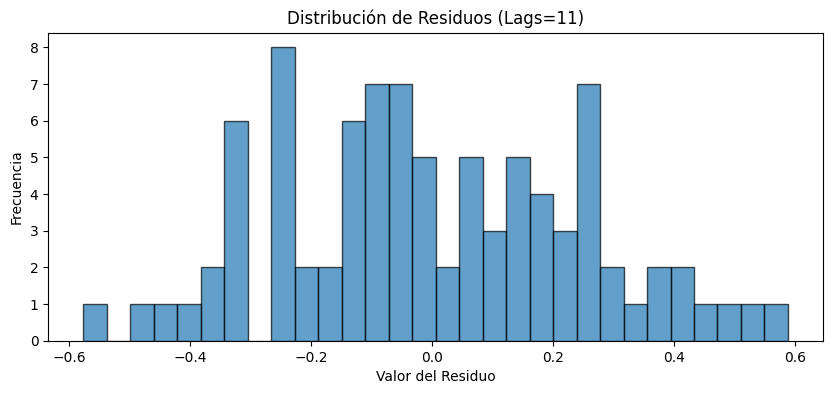

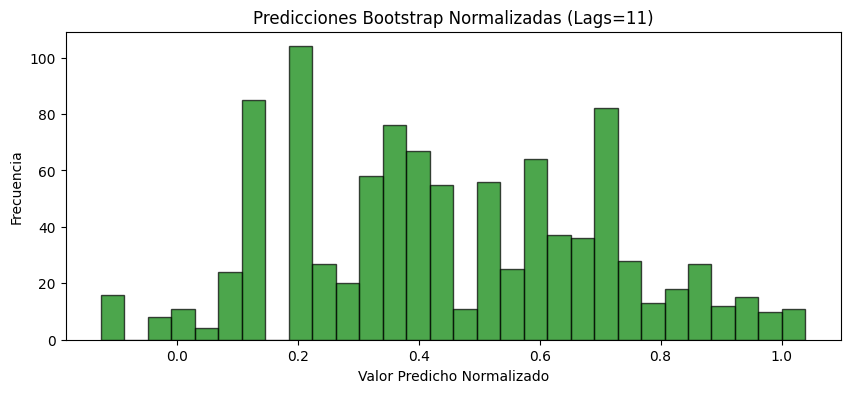

📏 Distancia de Wasserstein: 3.3343

🔍 Probando lag=12
🛠️ Normalizando datos...
   Media calculada: 0.04
   Desviación estándar calculada: 7.60

🔧 Ajustando modelo AutoReg...
✅ Modelo ajustado con 12 lags
   Coeficientes: [-0.01  0.21  0.08  0.04 -0.09  0.2  -0.26 -0.17 -0.28 -0.09 -0.24  0.19
 -0.02]


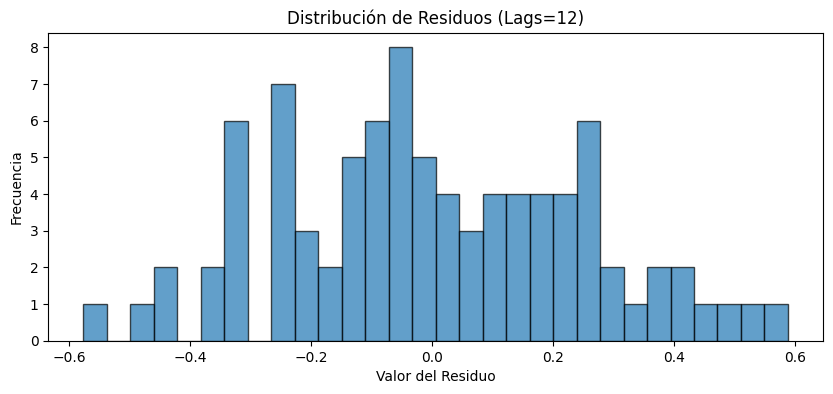

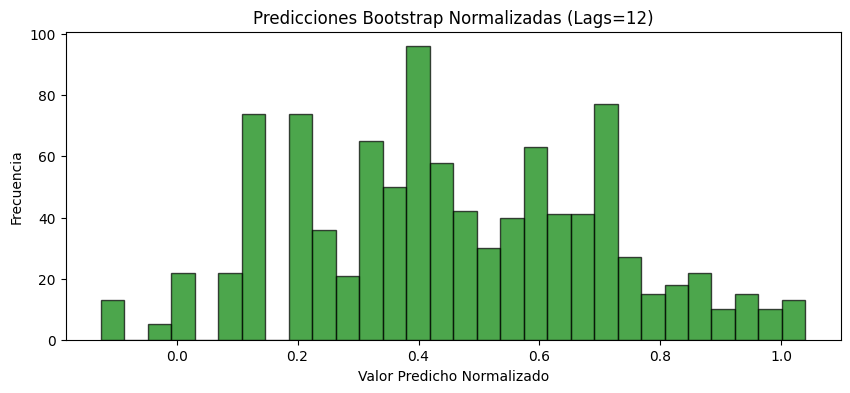

📏 Distancia de Wasserstein: 3.4061


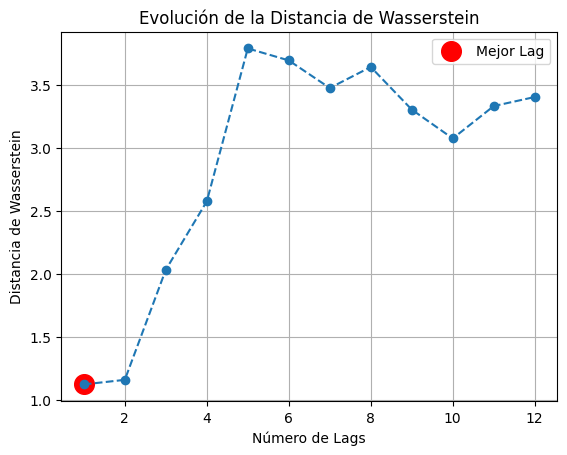


🎉 Mejor n_lags encontrado: 1 (Wasserstein = 1.1243)
🛠️ Normalizando datos...
   Media calculada: 0.04
   Desviación estándar calculada: 7.60

🔧 Ajustando modelo AutoReg...
✅ Modelo ajustado con 1 lags
   Coeficientes: [-0.    0.88]


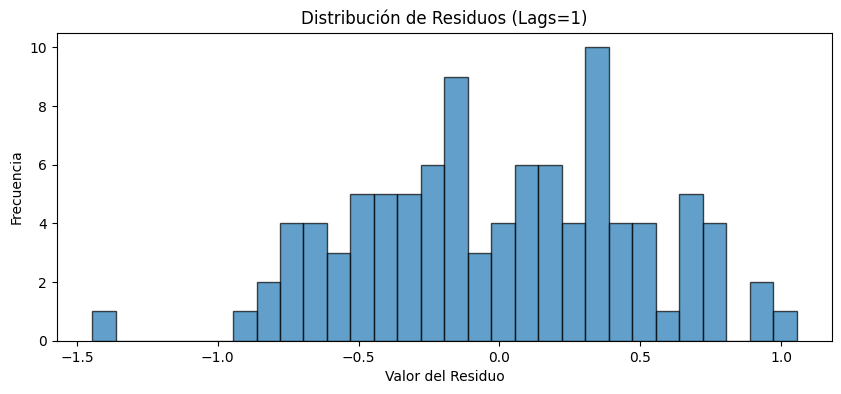

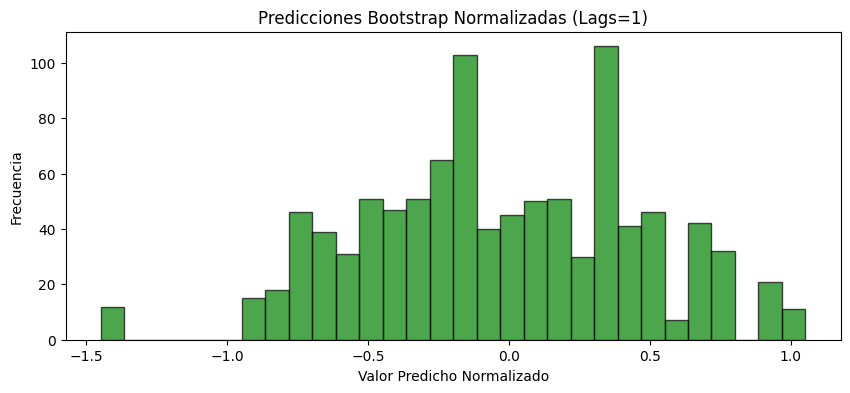

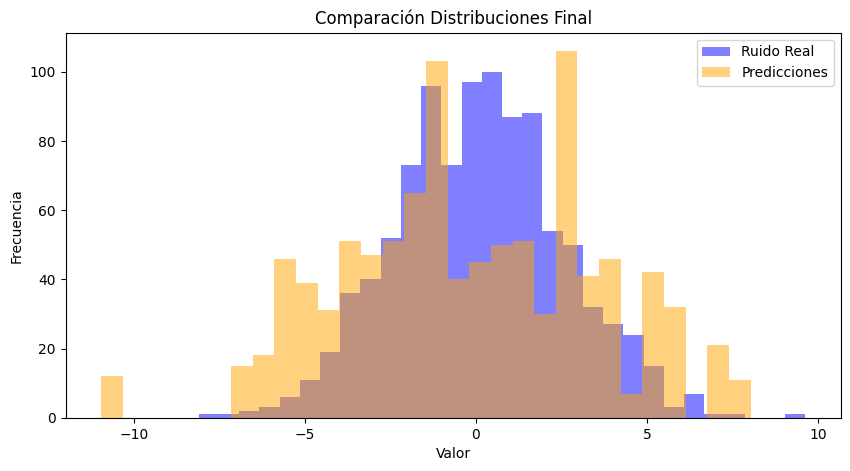


🔚 Proceso completado!


In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

# Generar datos sintéticos
def generate_sample_data(cycles=3, noise_level=0.2, trend=0.05, n_points=100):
    """Genera serie temporal con estacionalidad, ruido y tendencia"""
    x = np.linspace(0, 4 * np.pi * cycles, n_points)
    base = np.sin(x) * 10
    noise = np.random.normal(0, noise_level * 10, n_points)
    trend_component = np.linspace(0, trend * 10, n_points)
    return pd.DataFrame({
        'fecha': pd.date_range(start='2020-01-01', periods=n_points, freq='D'),
        'valor': base + noise + trend_component
    })

# Generar datos de ejemplo y ruido real (simulado)
np.random.seed(42)
df = generate_sample_data()
real_noise = np.random.normal(0, 2.5, 1000)  # Ruido real diferente al del modelo

# Visualizar datos generados
plt.figure(figsize=(10, 4))
plt.plot(df['fecha'], df['valor'], label='Serie Temporal')
plt.title('Datos Sintéticos Generados')
plt.xlabel('Fecha')
plt.ylabel('Valor')
plt.grid(True)
plt.legend()
plt.show()

# Instanciar y ejecutar el modelo
model = BootstrappingModel(random_state=42)

# Ejecutar búsqueda de mejores parámetros
best_lag = model.grid_search(df, real_noise, lags_range=range(1, 13), n_boot=1000)

# Generar predicciones finales con el mejor modelo
final_predictions = model.fit_predict(df, n_boot=1000)

# Visualización comparativa final
plt.figure(figsize=(10, 5))
plt.hist(real_noise, bins=30, alpha=0.5, label='Ruido Real', color='blue')
plt.hist(final_predictions, bins=30, alpha=0.5, label='Predicciones', color='orange')
plt.title('Comparación Distribuciones Final')
plt.xlabel('Valor')
plt.ylabel('Frecuencia')
plt.legend()
plt.show()

print("\n🔚 Proceso completado!")

## Modelo CPNewModel

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.linear_model import Ridge
from bayes_opt import BayesianOptimization
from scipy.stats import wasserstein_distance

class CPnewModel:
    """Modelo avanzado para series temporales con optimización bayesiana y visualización"""
    
    def __init__(self, n_lags=5, rho=0.95, max_points=10000, alpha=0.1, poly_degree=2, 
                 seasonal_periods=[12], random_state=42):
        self.n_lags = n_lags
        self.rho = rho
        self.max_points = max_points
        self.alpha = alpha
        self.poly_degree = poly_degree
        self.seasonal_periods = seasonal_periods
        self.mean_val = None
        self.std_val = None
        self.trends = []
        self.seasonalities = []
        self.random_state = random_state
        np.random.seed(self.random_state)
        
        print("🛠️ Inicializando modelo CPnewModel con parámetros:")
        print(f"   - Lags iniciales: {n_lags}")
        print(f"   - Rho: {rho}")
        print(f"   - Grado polinomial: {poly_degree}")
        print(f"   - Periodos estacionales: {seasonal_periods}")

    def optimize_hyperparameters(self, df, real_noise):
        """Optimiza hiperparámetros con seguimiento visual"""
        print("\n🚀 Iniciando optimización bayesiana...")
        
        def objective(n_lags, rho, poly_degree):
            try:
                n_lags_int = max(1, int(round(n_lags)))
                rho_bounded = min(0.999, max(0.5, float(rho)))
                poly_degree_int = max(1, int(round(poly_degree)))
                
                if len(df) <= n_lags_int * 2:
                    return -float('inf')
                
                self.n_lags = n_lags_int
                self.rho = rho_bounded
                self.poly_degree = poly_degree_int
                
                predictions = self.fit_predict(df.copy())
                
                if np.any(np.isnan(predictions)) or np.any(np.isinf(predictions)):
                    return -float('inf')
                
                w_dist = wasserstein_distance(predictions, real_noise)
                penalty = 0
                if n_lags_int > 8:
                    penalty += 0.1 * (n_lags_int - 8)
                if rho_bounded > 0.98:
                    penalty += 0.1 * (rho_bounded - 0.98) / 0.019
                
                return -(w_dist + penalty)
                    
            except Exception as e:
                print(f"❌ Error en iteración: {str(e)}")
                return -float('inf')

        optimizer = BayesianOptimization(
            f=objective,
            pbounds={
                'n_lags': (1, 8),
                'rho': (0.7, 0.99),
                'poly_degree': (1, 3)
            },
            random_state=self.random_state,
            verbose=2
        )
        
        # Fase 1: Exploración amplia
        print("🔍 Fase 1: Exploración amplia (10 iteraciones)")
        optimizer.maximize(init_points=10, n_iter=15)
        
        # Fase 2: Búsqueda local
        if optimizer.max:
            print("\n🔍 Fase 2: Búsqueda local (5 iteraciones)")
            best_params = optimizer.max['params']
            optimizer.set_bounds({
                'n_lags': (max(1, best_params['n_lags']-1), min(8, best_params['n_lags']+1)),
                'rho': (max(0.7, best_params['rho']-0.05), min(0.99, best_params['rho']+0.05)),
                'poly_degree': (max(1, best_params['poly_degree']-1), min(3, best_params['poly_degree']+1))
            })
            optimizer.maximize(init_points=5, n_iter=10)

        # Recolectar histórico de resultados
        history = [res['target'] for res in optimizer.res]
        
        # Visualizar progreso
        plt.figure(figsize=(12, 6))
        plt.plot(history, 'o-', label='Mejor Score')
        plt.title("Progreso de la Optimización Bayesiana")
        plt.xlabel("Iteración")
        plt.ylabel("Score (Wasserstein Negativo)")
        plt.legend()
        plt.grid(True)
        plt.show()

        if optimizer.max and optimizer.max['target'] > -float('inf'):
            final_params = optimizer.max['params']
            best_wasserstein = -optimizer.max['target'] - final_params.get('penalty', 0)
            
            self.n_lags = max(1, int(round(final_params['n_lags'])))
            self.rho = min(0.999, max(0.5, final_params['rho']))
            self.poly_degree = max(1, int(round(final_params['poly_degree'])))
            
            print("\n✅ Optimización exitosa:")
            print(f"   • Lags: {self.n_lags}")
            print(f"   • Rho: {self.rho:.3f}")
            print(f"   • Grado polinomial: {self.poly_degree}")
            print(f"   • Distancia de Wasserstein: {best_wasserstein:.4f}")
        else:
            self.n_lags = 3
            self.rho = 0.85
            self.poly_degree = 2
            print("\n⚠️ Optimización fallida. Usando valores por defecto:")
            print(f"   • Lags: {self.n_lags}")
            print(f"   • Rho: {self.rho:.3f}")
            print(f"   • Grado polinomial: {self.poly_degree}")
        
        return self.n_lags, self.rho, self.poly_degree

    def decompose_series(self, df):
        """Descomposición estacional con visualización"""
        print("\n🔧 Descomponiendo serie temporal...")
        values = df['valor'].values if isinstance(df, pd.DataFrame) else df
        residual = values.copy().astype(np.float64)
        self.trends = []
        self.seasonalities = []

        plt.figure(figsize=(12, 8))
        plt.subplot(3, 1, 1)
        plt.plot(values, label='Original')
        plt.title("Serie Original")
        plt.grid(True)

        for period in self.seasonal_periods:
            if len(residual) >= 2 * period:
                result = seasonal_decompose(residual, period=period, model='additive', extrapolate_trend='freq')
                self.trends.append(result.trend.astype(np.float64))
                self.seasonalities.append(result.seasonal.astype(np.float64))
                residual -= np.nan_to_num(result.trend) + np.nan_to_num(result.seasonal)

        plt.subplot(3, 1, 2)
        for i, trend in enumerate(self.trends):
            plt.plot(trend, label=f'Tendencia {self.seasonal_periods[i]}')
        plt.title("Componentes de Tendencia")
        plt.legend()
        plt.grid(True)
        
        plt.subplot(3, 1, 3)
        for i, seasonal in enumerate(self.seasonalities):
            plt.plot(seasonal[:self.seasonal_periods[i]], label=f'Estacionalidad {self.seasonal_periods[i]}')
        plt.title("Componentes Estacionales")
        plt.legend()
        plt.grid(True)
        
        plt.tight_layout()
        plt.show()
        
        return np.nan_to_num(residual)

    def prepare_data(self, df):
        """Preprocesamiento con normalización"""
        print("\n🧹 Preparando datos...")
        detrended_values = self.decompose_series(df)
        self.mean_val = np.mean(detrended_values)
        self.std_val = np.std(detrended_values)
        normalized = (detrended_values - self.mean_val) / (self.std_val + 1e-8)
        
        plt.figure(figsize=(10, 4))
        plt.plot(normalized, label='Datos Normalizados')
        plt.title("Datos después de Normalización")
        plt.xlabel("Tiempo")
        plt.ylabel("Valor Normalizado")
        plt.grid(True)
        plt.legend()
        plt.show()
        
        return normalized

    def _create_lag_matrix(self, values, n_lags, degree=2):
        """Crea matriz de rezagos con términos polinomiales"""
        print(f"\n📦 Creando matriz de rezagos (lags={n_lags}, grado={degree})")
        n = len(values) - n_lags
        X = np.ones((n, 1), dtype=np.float64)
        for lag in range(n_lags):
            lagged = values[lag:lag + n].reshape(-1, 1).astype(np.float64)
            X = np.hstack((X, lagged))
            if degree > 1:
                for d in range(2, degree + 1):
                    X = np.hstack((X, np.power(lagged, d)))
        print(f"   Forma final de la matriz: {X.shape}")
        return X

    def calculate_C_values(self, X, y):
        """Calcula valores C con visualización de residuos"""
        print("\n🧮 Calculando valores C...")
        alpha = self.adaptive_regularization(X)
        print(f"   Regularización adaptativa: {alpha:.6f}")
        model = Ridge(alpha=alpha, fit_intercept=False)
        model.fit(X.astype(np.float64), y.astype(np.float64))
        y_pred = model.predict(X)
        residuals = y - y_pred
        
        plt.figure(figsize=(10, 4))
        plt.hist(residuals, bins=30, edgecolor='k', alpha=0.7)
        plt.title("Distribución de Residuos del Modelo Ridge")
        plt.xlabel("Residuo")
        plt.ylabel("Frecuencia")
        plt.show()
        
        XtX_inv = np.linalg.pinv(X.T @ X + alpha * np.eye(X.shape[1]))
        return y_pred + (X @ XtX_inv @ X.T @ residuals)

    def apply_weights(self, C):
        """Aplica pesos exponenciales con visualización"""
        print("\n⚖️ Aplicando pesos exponenciales...")
        weights = self.rho ** np.arange(len(C)-1, -1, -1, dtype=np.float64)
        weights /= np.sum(weights)
        scale_factor = min(self.max_points / np.sum(weights), 100)
        repeats = np.maximum(np.round(weights * scale_factor), 1).astype(int)
        weighted = np.repeat(C.astype(np.float64), repeats)
        
        plt.figure(figsize=(12, 4))
        plt.subplot(1, 2, 1)
        plt.plot(weights, 'o-')
        plt.title("Distribución de Pesos")
        plt.xlabel("Índice")
        plt.ylabel("Peso")
        
        plt.subplot(1, 2, 2)
        plt.hist(weighted, bins=30, edgecolor='k', alpha=0.7)
        plt.title("Muestras Ponderadas")
        plt.xlabel("Valor")
        plt.ylabel("Frecuencia")
        
        plt.tight_layout()
        plt.show()
        
        return weighted

    def fit_predict(self, df):
        """Genera predicciones con verificación paso a paso"""
        print("\n🔮 Generando predic ciones...")
        normalized_data = self.prepare_data(df)
        X = self._create_lag_matrix(normalized_data, self.n_lags, self.poly_degree)
        y = normalized_data[self.n_lags:]
        
        C = self.calculate_C_values(X, y)
        weighted_predictions = self.apply_weights(C)
        
        # Ajustar la longitud de las predicciones a la serie original
        predictions = np.zeros(len(df))
        predictions[self.n_lags:] = weighted_predictions[:len(predictions) - self.n_lags]
        
        plt.figure(figsize=(10, 5))
        plt.plot(df['fecha'], df['valor'], label='Datos Originales')
        plt.plot(df['fecha'], predictions, label='Predicciones', color='orange')
        plt.title("Predicciones vs Datos Originales")
        plt.xlabel("Fecha")
        plt.ylabel("Valor")
        plt.legend()
        plt.grid(True)
        plt.show()
        
        return predictions

    def adaptive_regularization(self, X):
        """Calcula un valor de regularización adaptativo"""
        print("\n🔍 Calculando regularización adaptativa...")
        return 1.0 / (np.sqrt(X.shape[0]) * np.std(X, axis=0).mean() + 1e-8)



🛠️ Inicializando modelo CPnewModel con parámetros:
   - Lags iniciales: 5
   - Rho: 0.95
   - Grado polinomial: 2
   - Periodos estacionales: [12]

🚀 Iniciando optimización bayesiana...
🔍 Fase 1: Exploración amplia (10 iteraciones)
|   iter    |  target   |  n_lags   | poly_d... |    rho    |
-------------------------------------------------------------

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


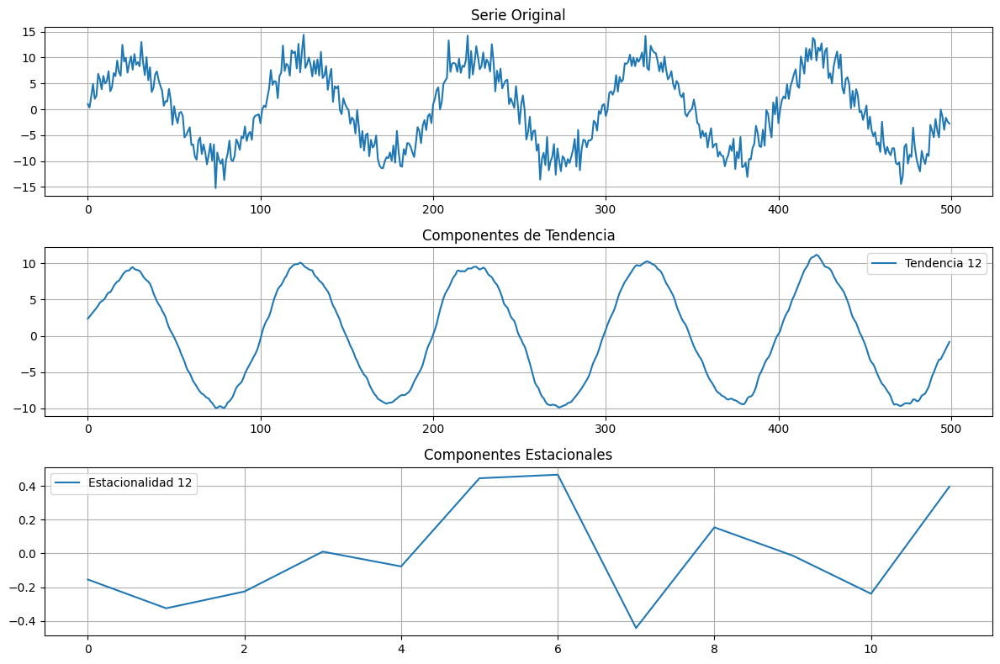

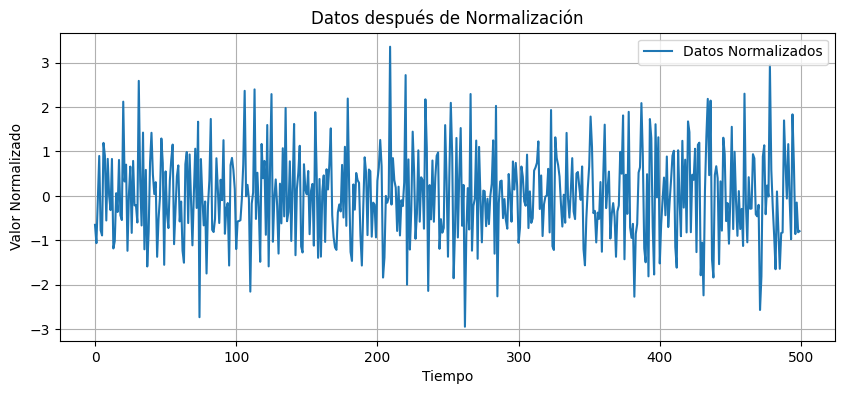


📦 Creando matriz de rezagos (lags=4, grado=3)
   Forma final de la matriz: (496, 13)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.022885


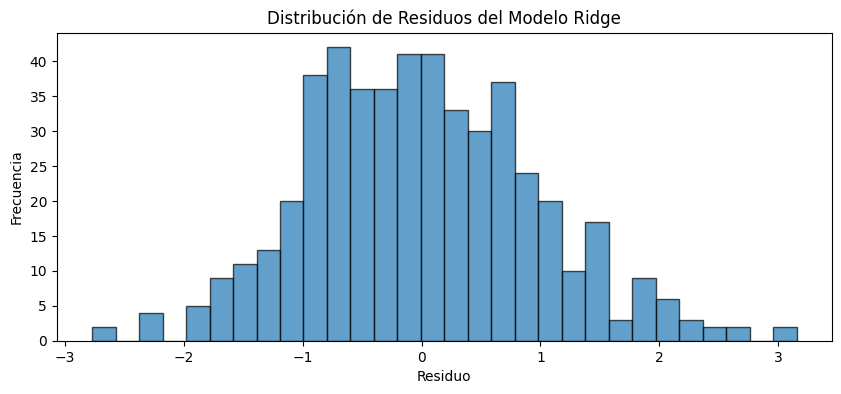


⚖️ Aplicando pesos exponenciales...


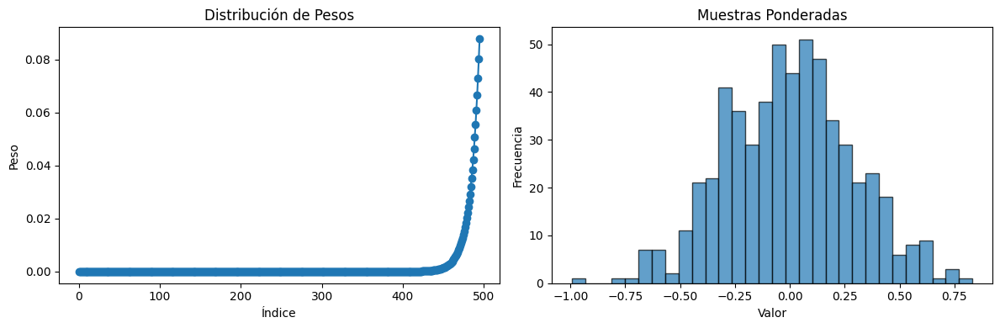

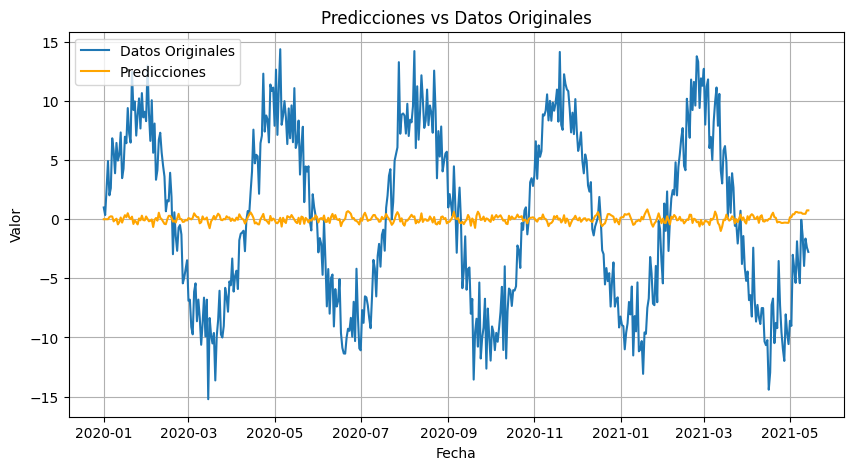

| 1         | -1.758    | 3.622     | 2.901     | 0.9123    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


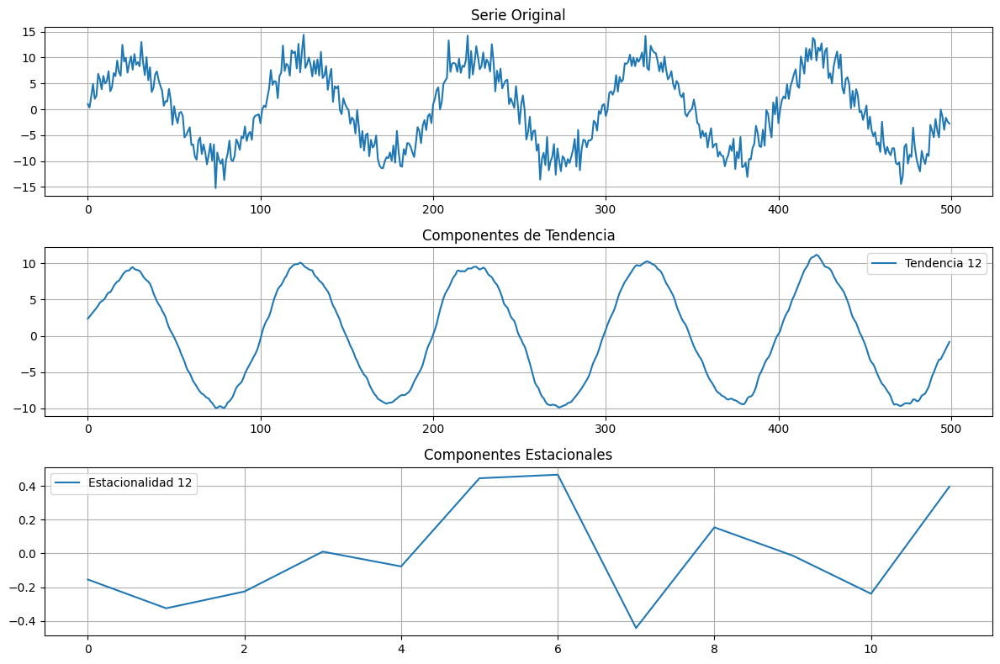

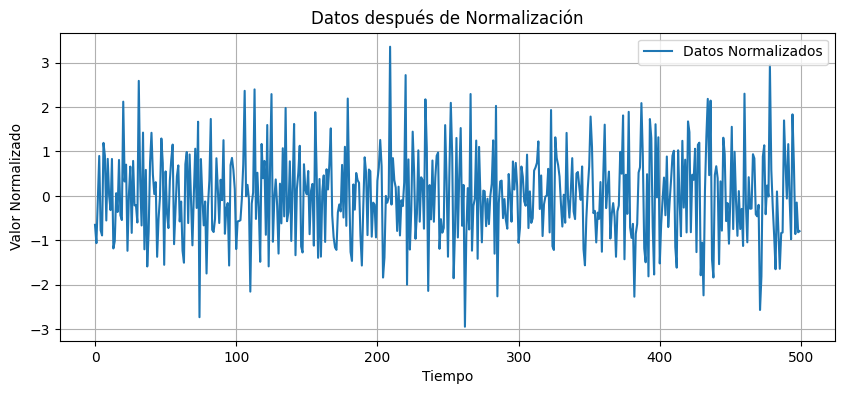


📦 Creando matriz de rezagos (lags=5, grado=1)
   Forma final de la matriz: (495, 6)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.053815


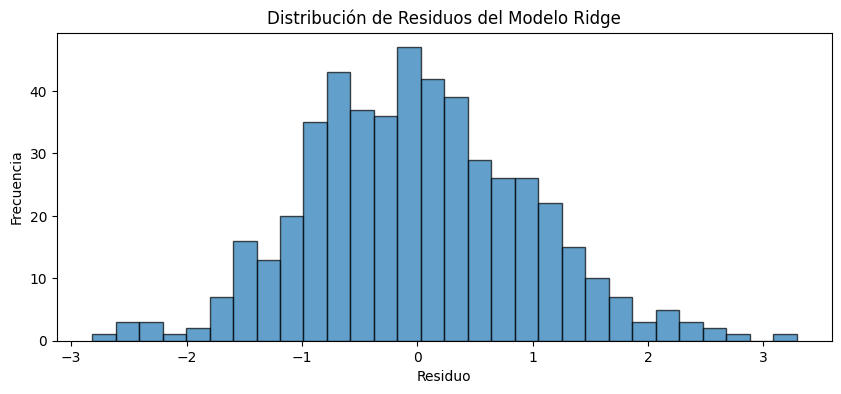


⚖️ Aplicando pesos exponenciales...


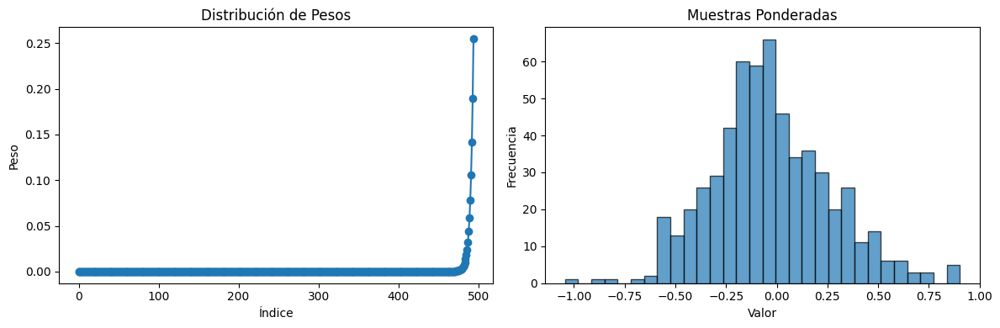

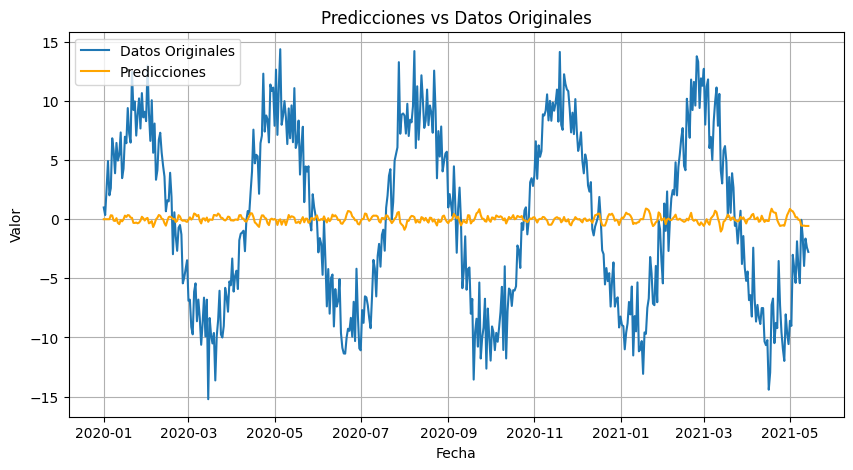

| 2         | -1.755    | 5.191     | 1.312     | 0.7452    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


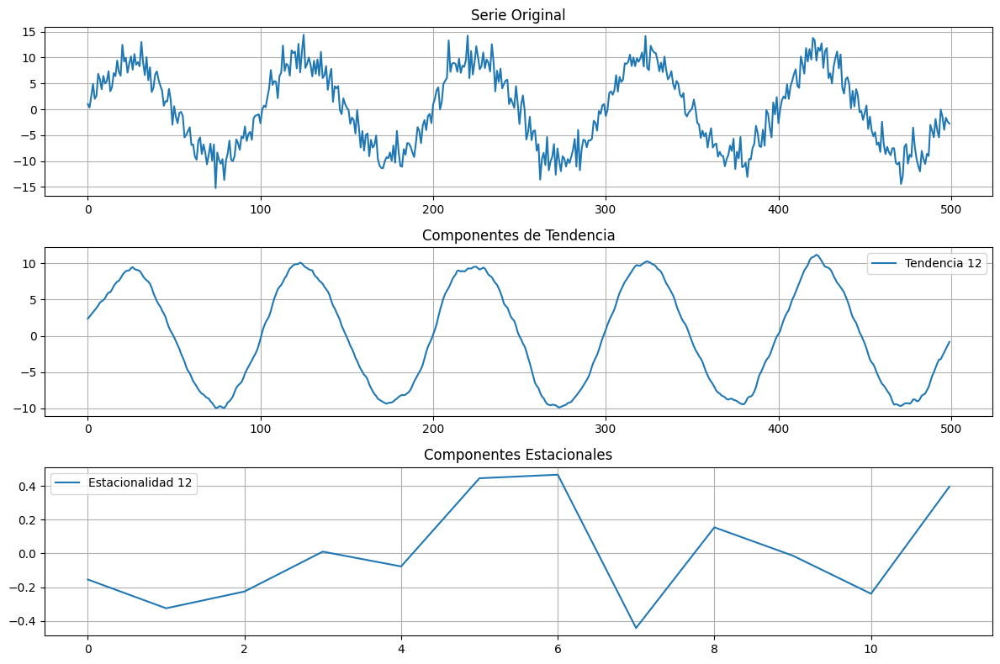

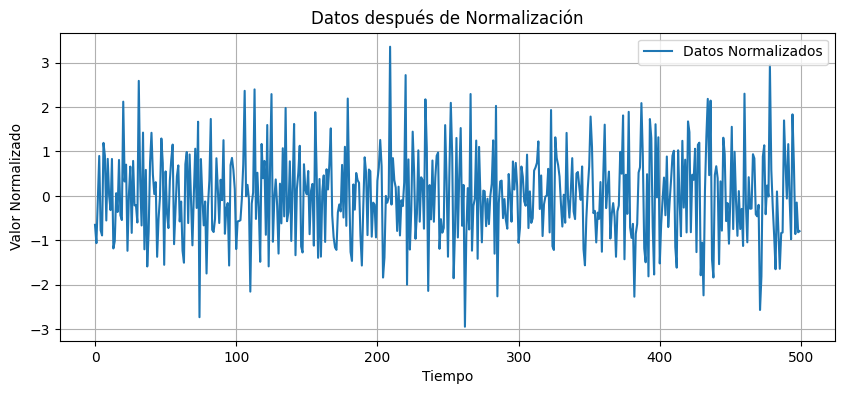


📦 Creando matriz de rezagos (lags=1, grado=3)
   Forma final de la matriz: (499, 4)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.028154


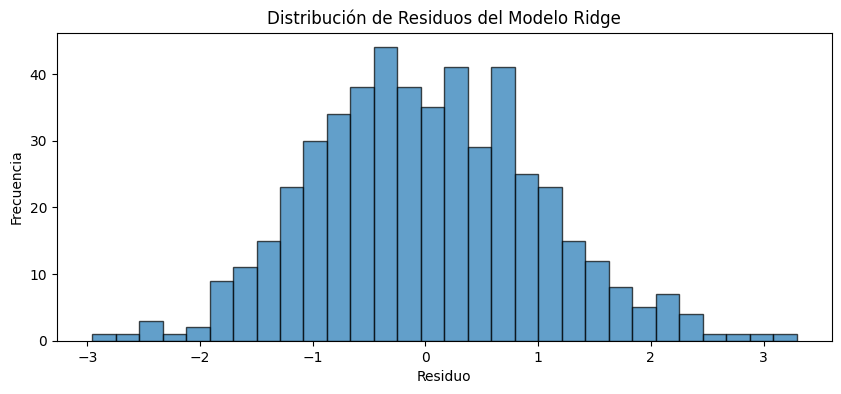


⚖️ Aplicando pesos exponenciales...


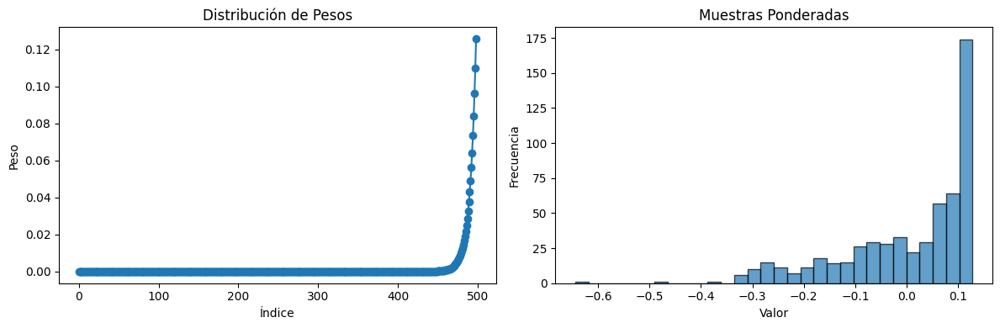

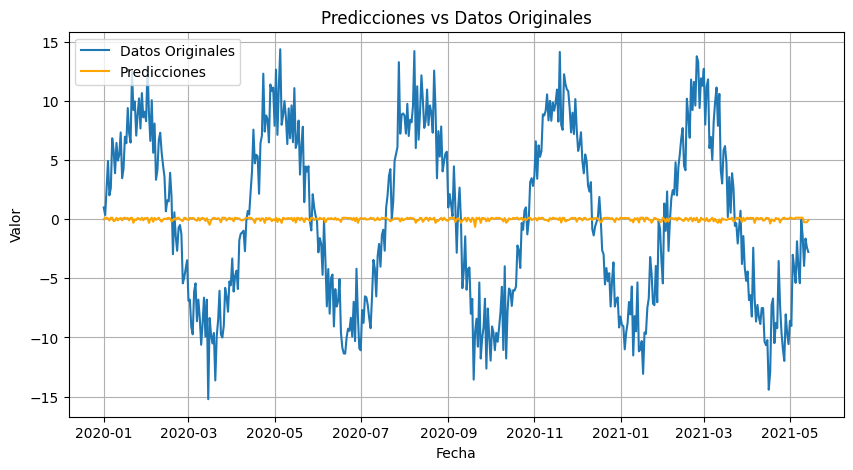

| 3         | -1.884    | 1.407     | 2.732     | 0.8743    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


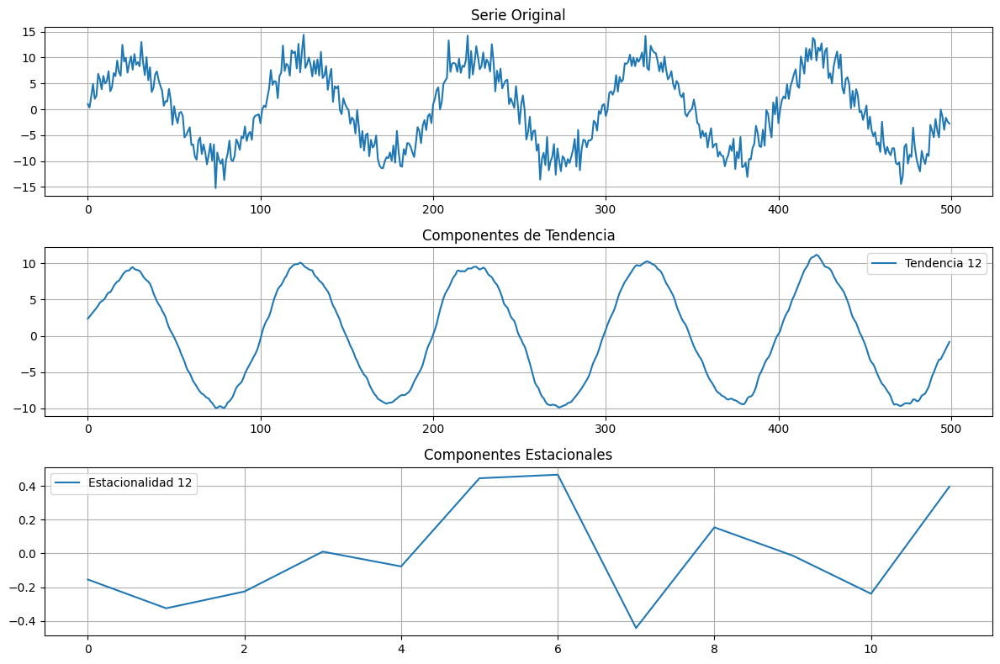

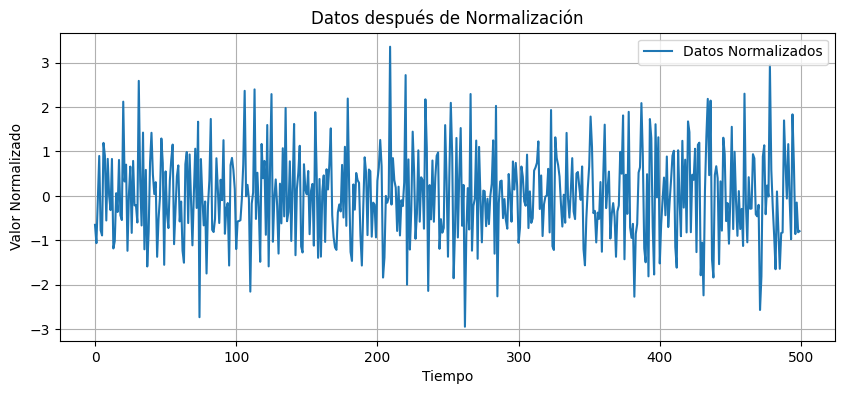


📦 Creando matriz de rezagos (lags=6, grado=1)
   Forma final de la matriz: (494, 7)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.052374


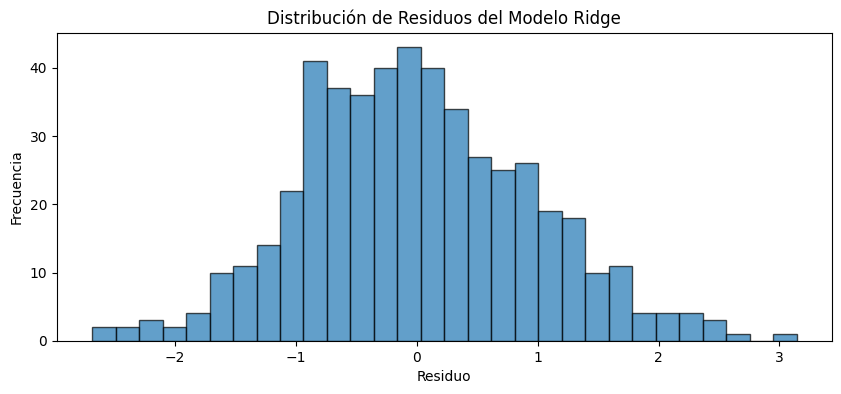


⚖️ Aplicando pesos exponenciales...


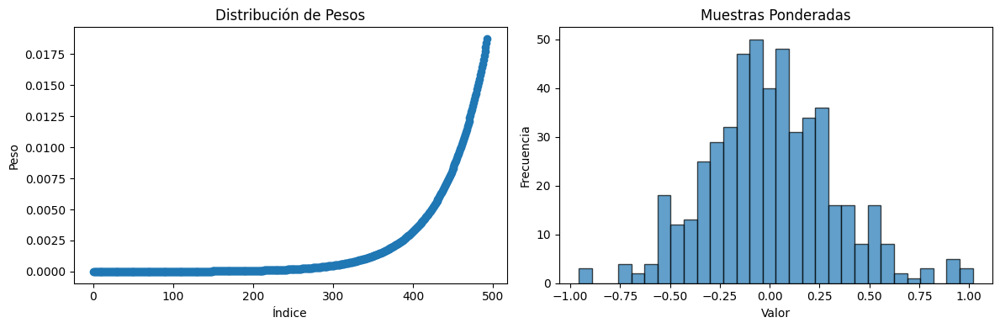

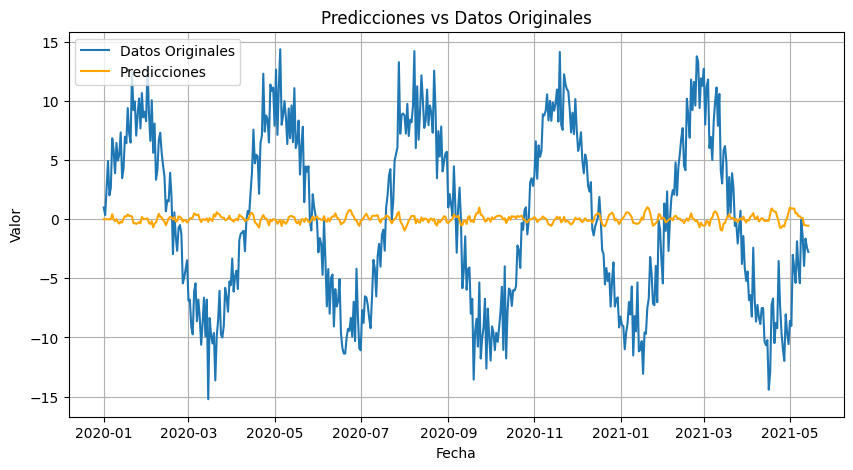

| 4         | -1.749    | 5.957     | 1.041     | 0.9813    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


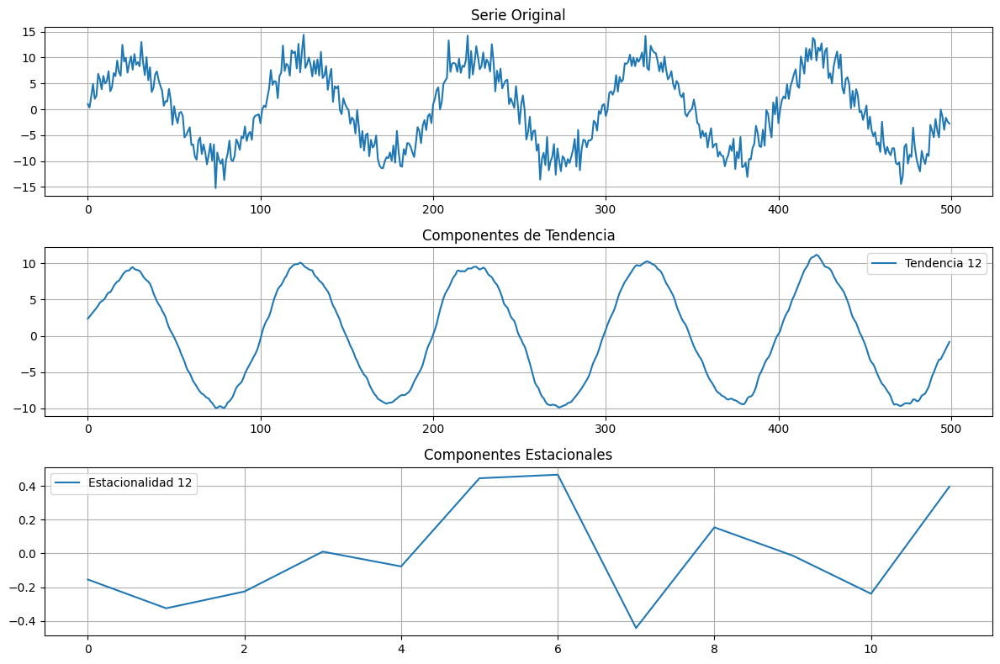

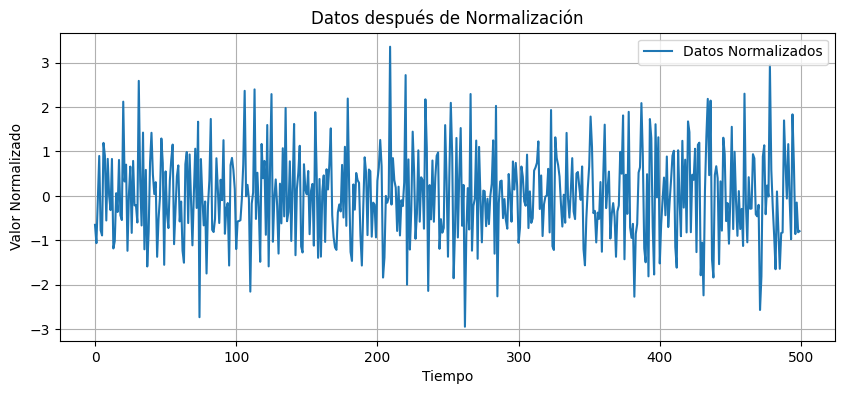


📦 Creando matriz de rezagos (lags=7, grado=1)
   Forma final de la matriz: (493, 8)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.051356


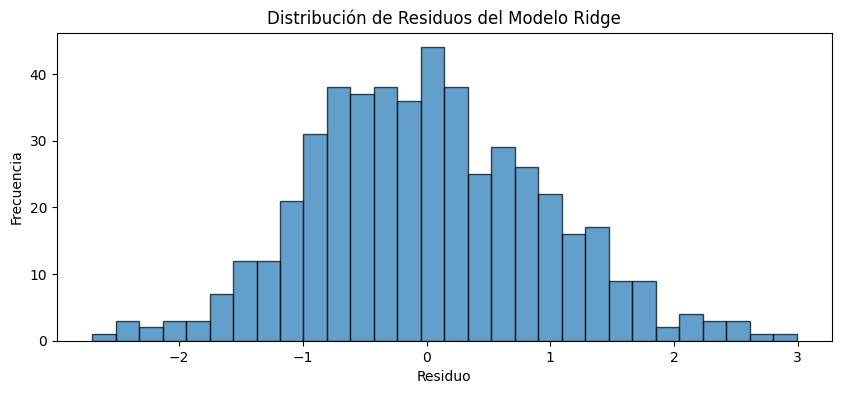


⚖️ Aplicando pesos exponenciales...


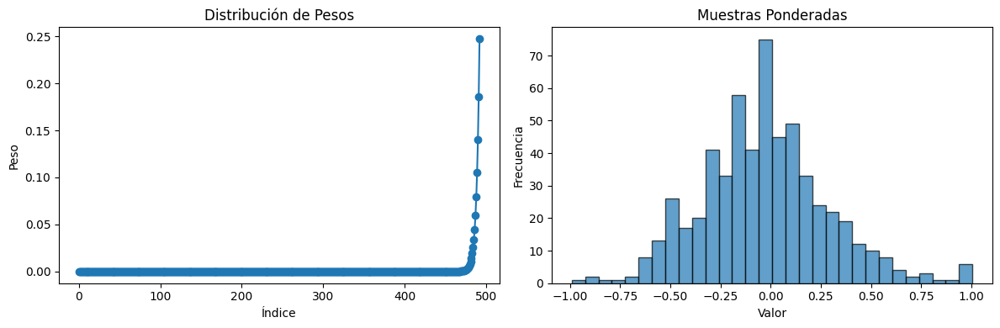

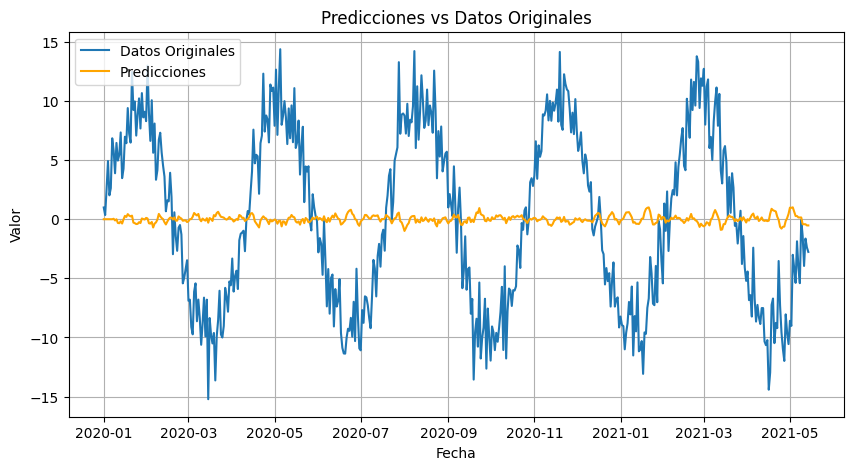

| 5         | -1.746    | 6.827     | 1.425     | 0.7527    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


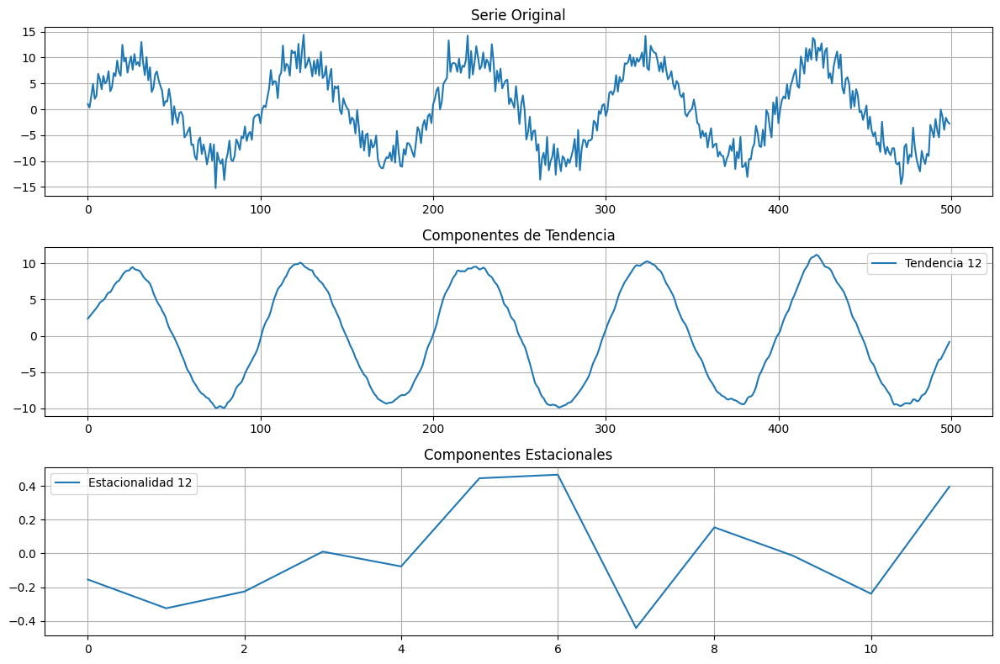

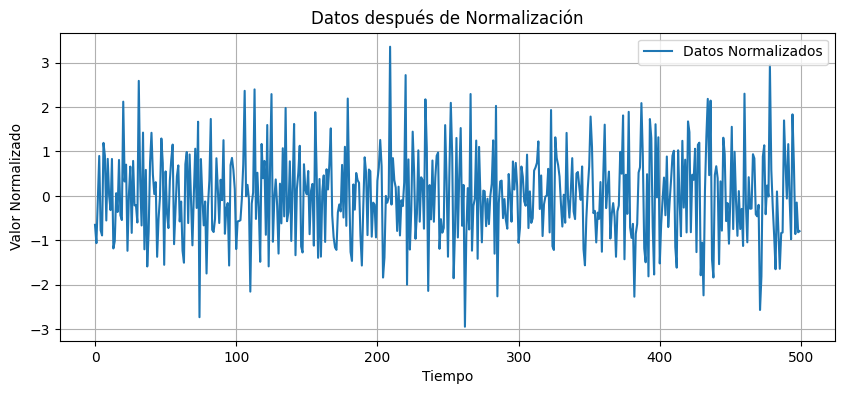


📦 Creando matriz de rezagos (lags=2, grado=2)
   Forma final de la matriz: (498, 5)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.046032


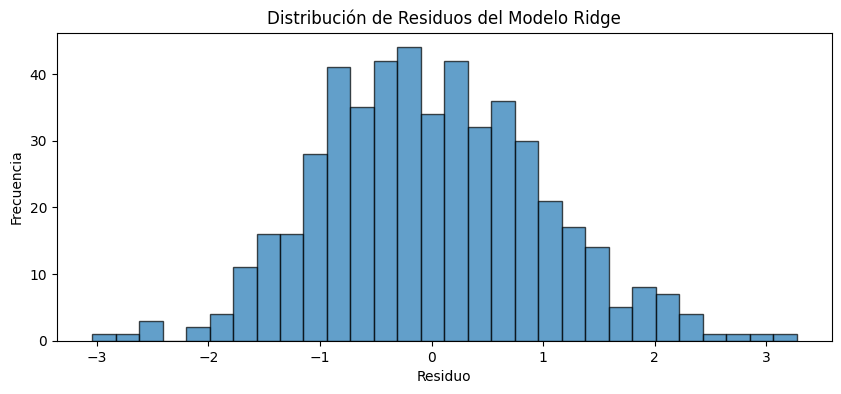


⚖️ Aplicando pesos exponenciales...


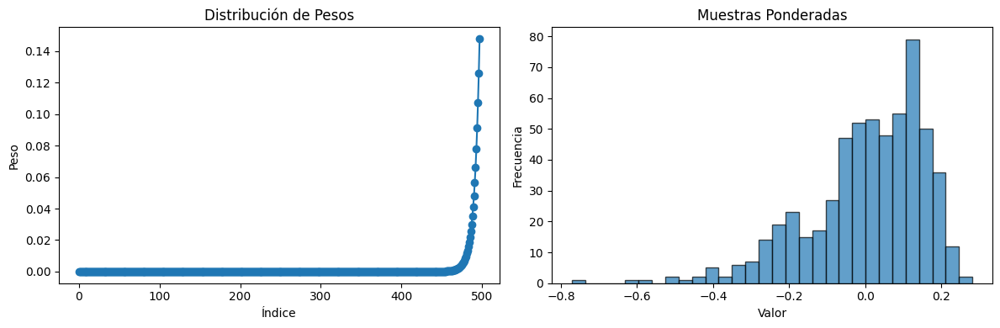

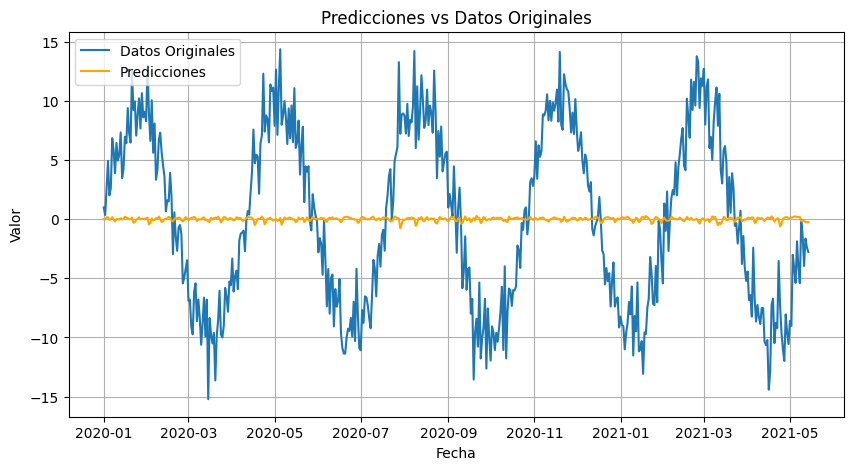

| 6         | -1.868    | 2.284     | 1.608     | 0.8522    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


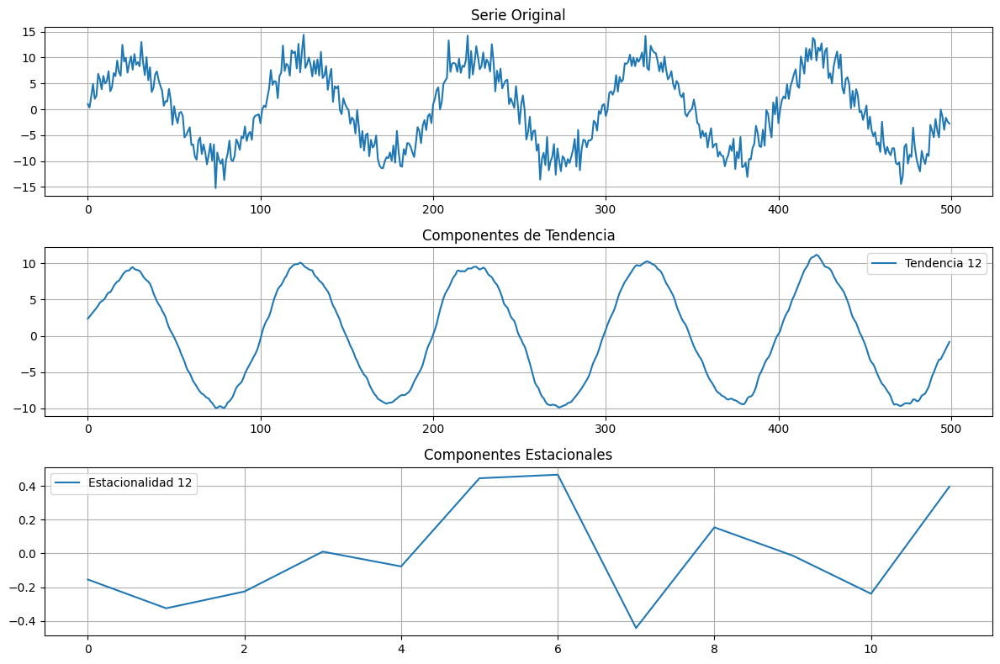

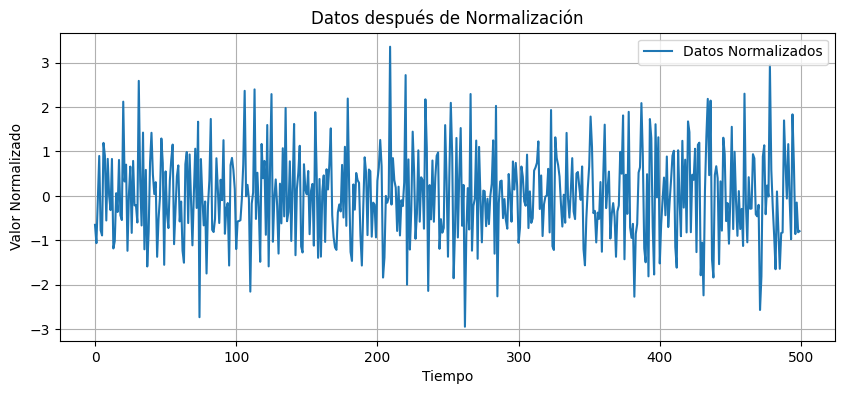


📦 Creando matriz de rezagos (lags=4, grado=2)
   Forma final de la matriz: (496, 9)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.041457


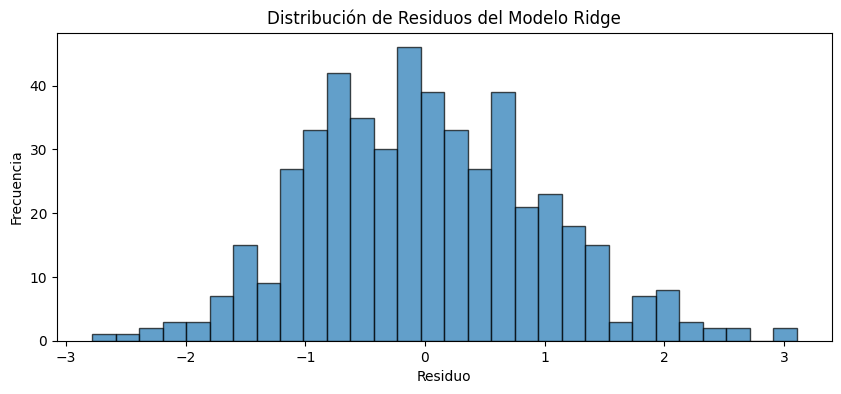


⚖️ Aplicando pesos exponenciales...


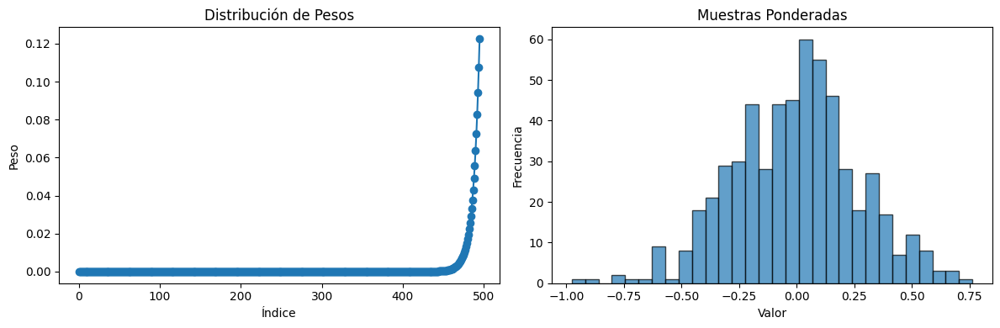

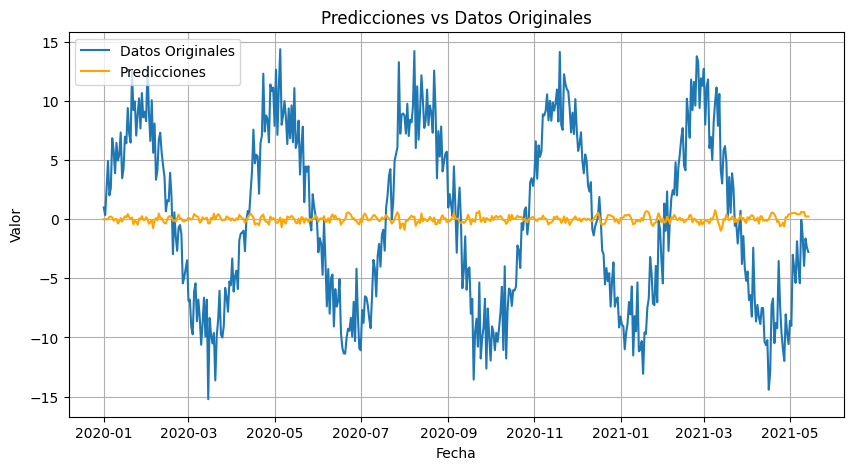

| 7         | -1.772    | 4.024     | 1.582     | 0.8774    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


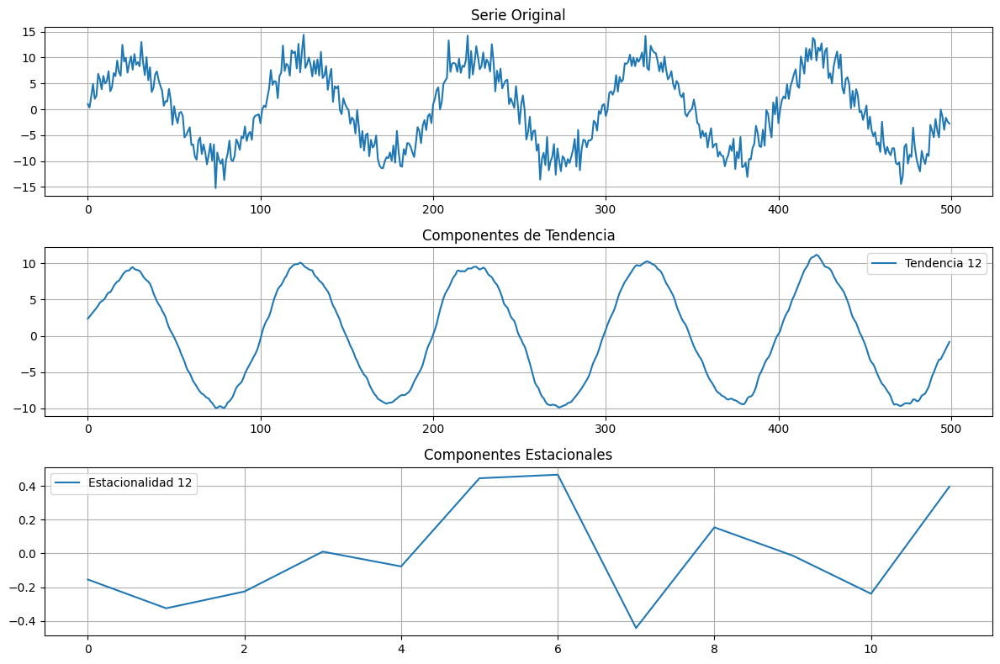

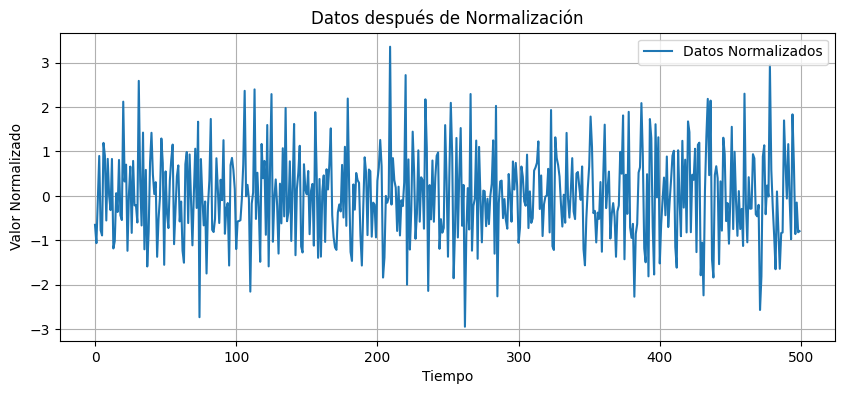


📦 Creando matriz de rezagos (lags=2, grado=2)
   Forma final de la matriz: (498, 5)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.046032


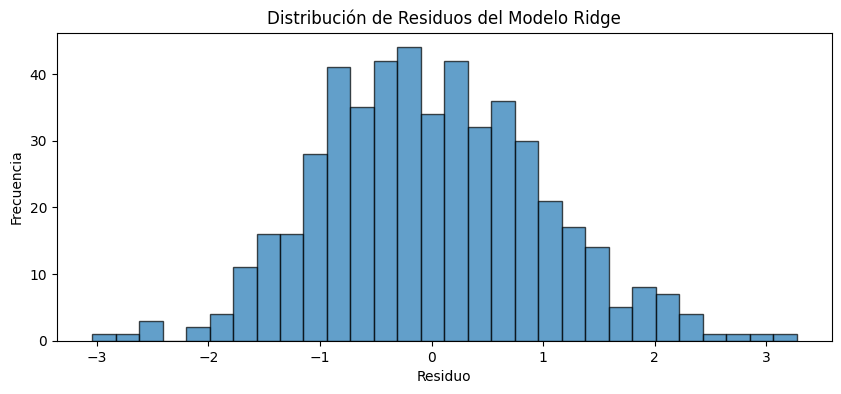


⚖️ Aplicando pesos exponenciales...


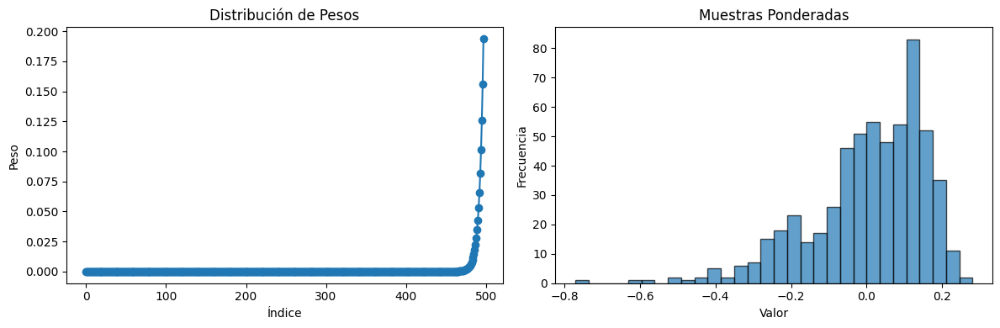

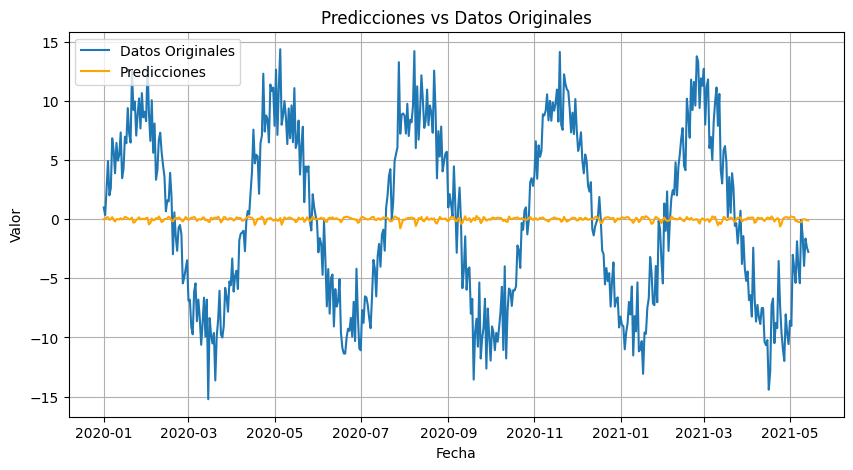

| 8         | -1.868    | 1.976     | 1.584     | 0.8062    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


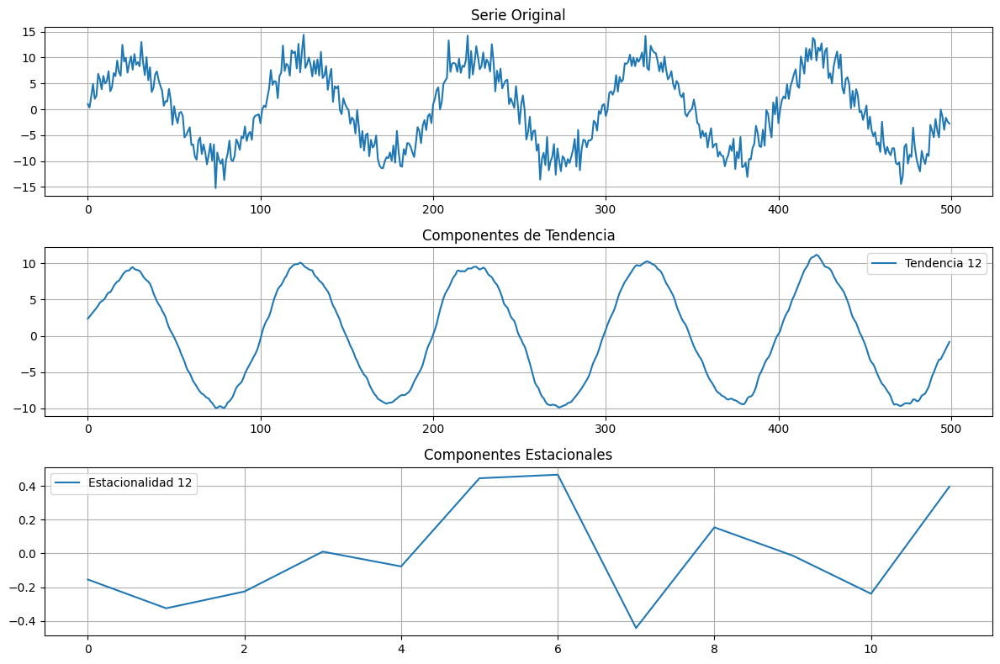

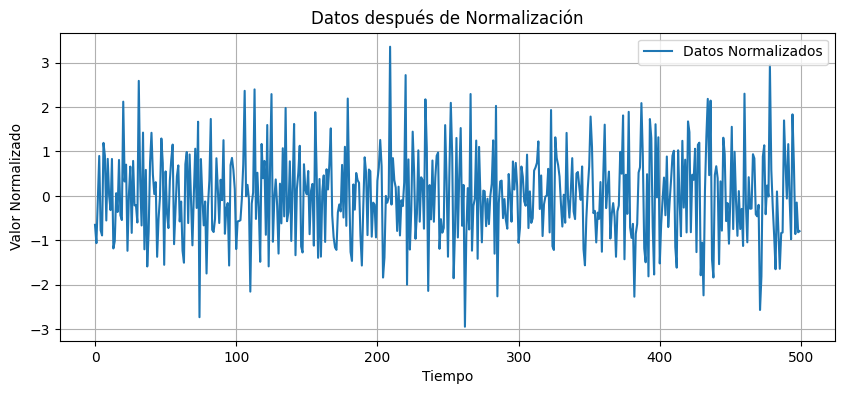


📦 Creando matriz de rezagos (lags=4, grado=3)
   Forma final de la matriz: (496, 13)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.022885


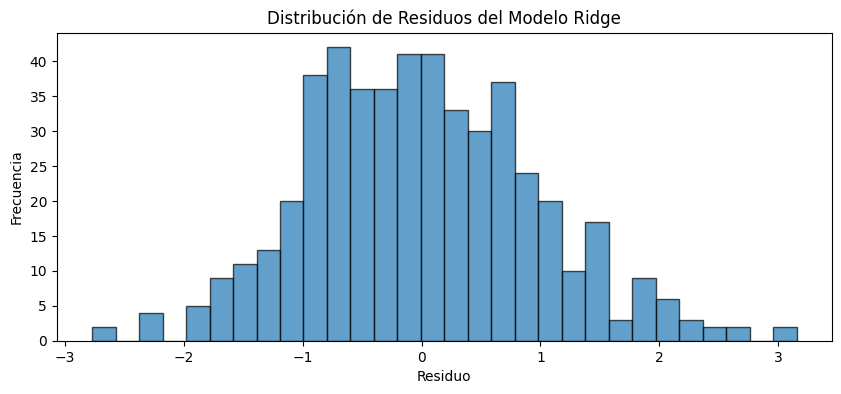


⚖️ Aplicando pesos exponenciales...


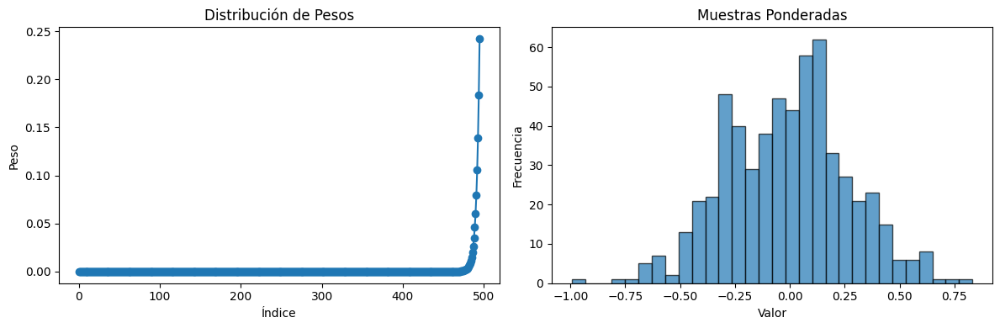

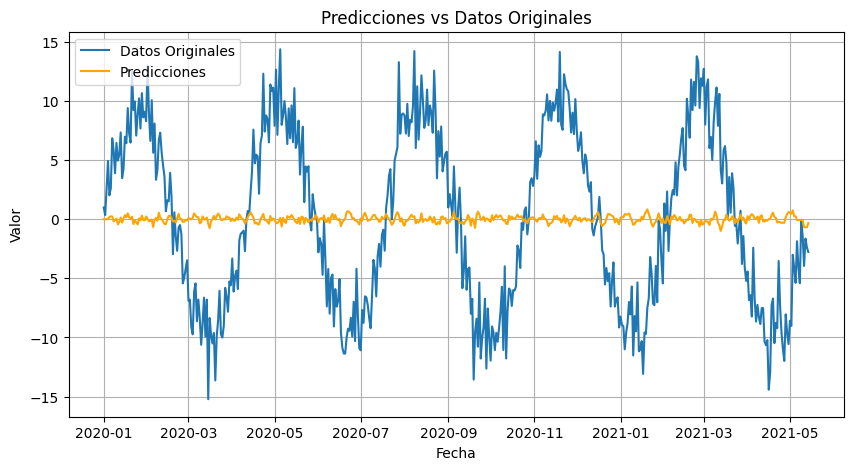

| 9         | -1.761    | 4.192     | 2.57      | 0.7579    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


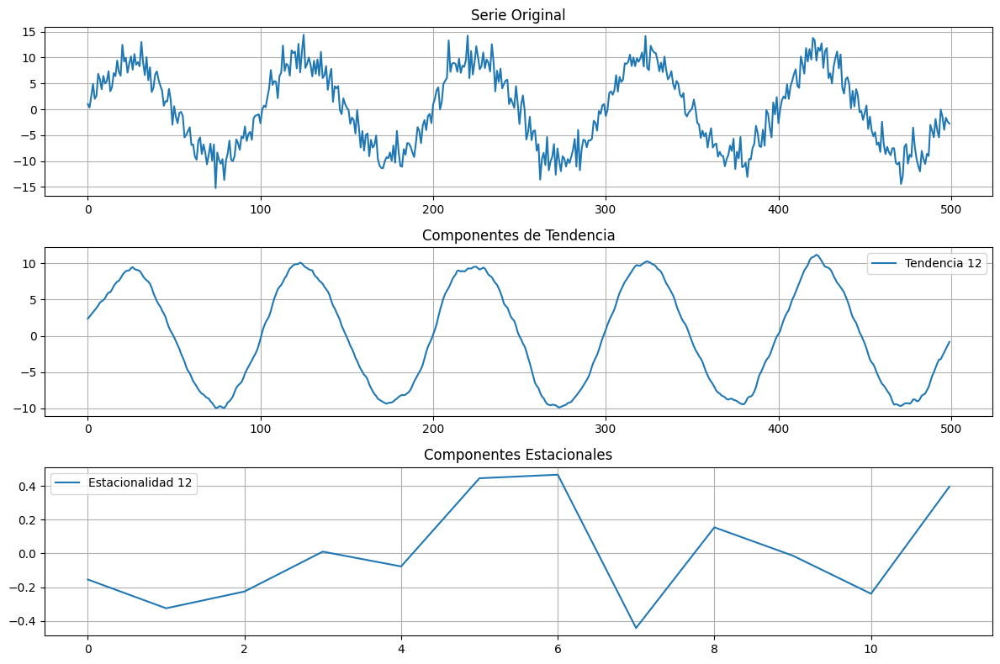

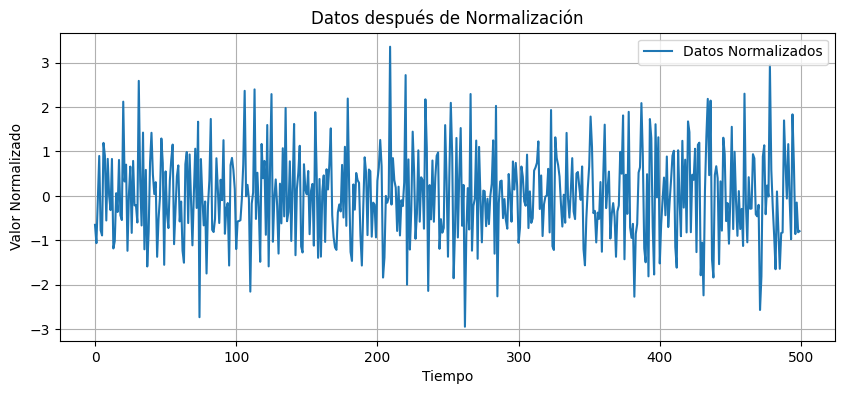


📦 Creando matriz de rezagos (lags=5, grado=2)
   Forma final de la matriz: (495, 11)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.040549


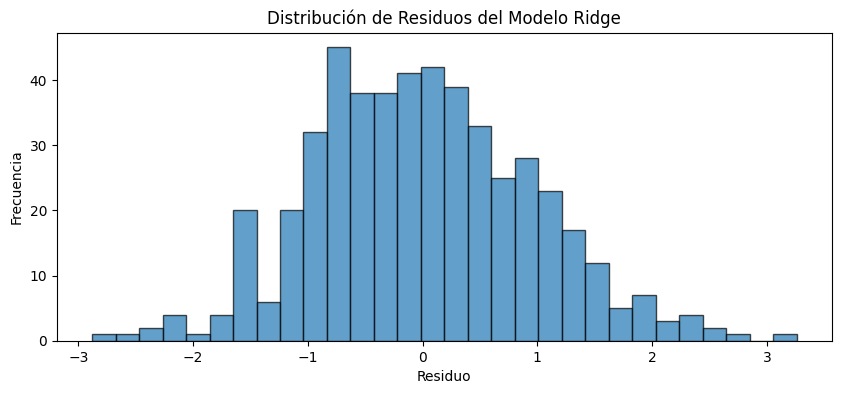


⚖️ Aplicando pesos exponenciales...


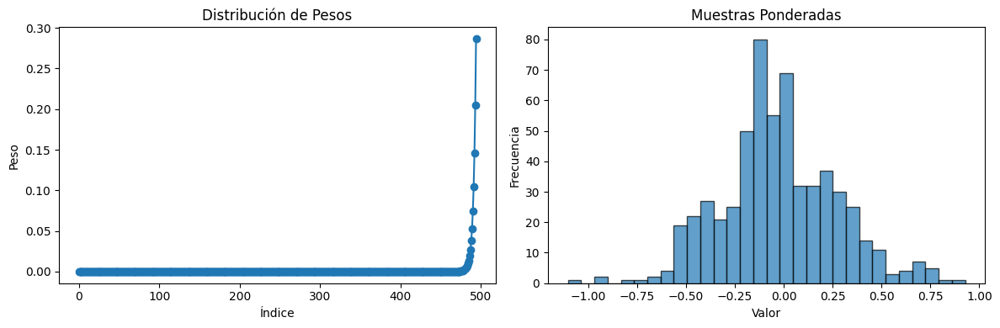

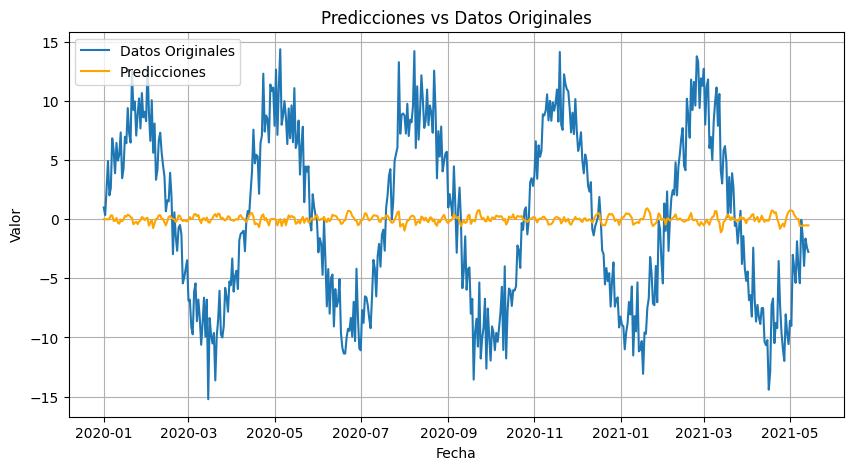

| 10        | -1.75     | 4.6       | 2.185     | 0.7135    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


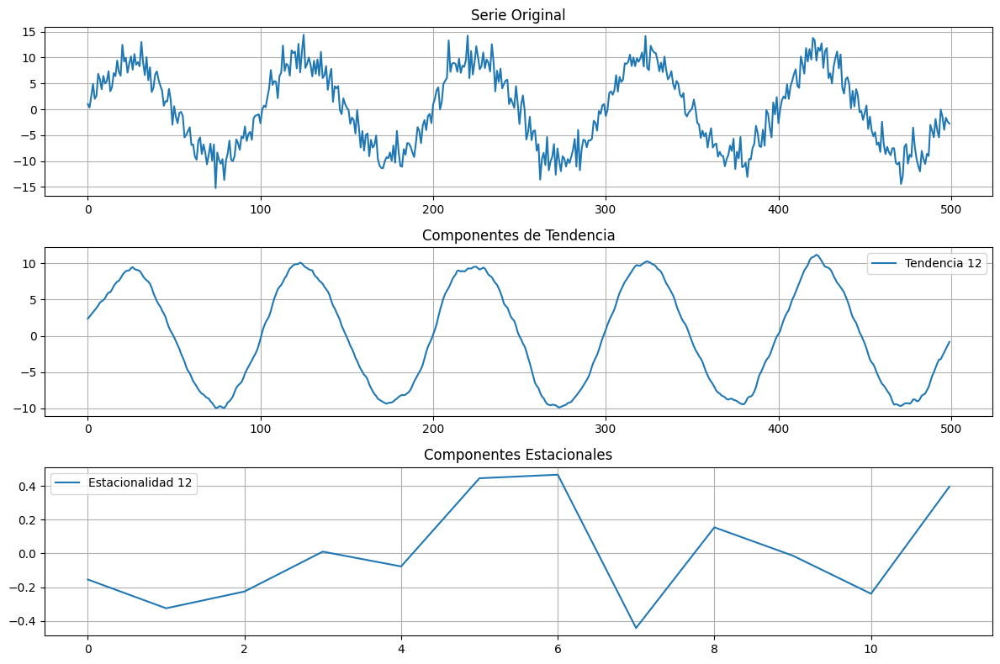

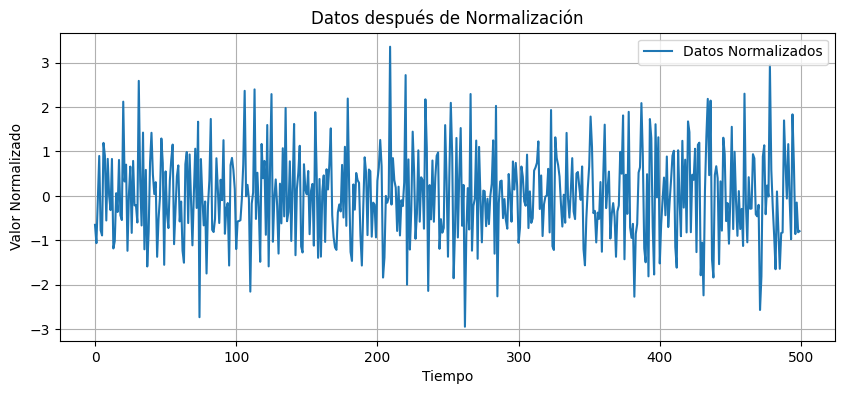


📦 Creando matriz de rezagos (lags=7, grado=3)
   Forma final de la matriz: (493, 22)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.022156


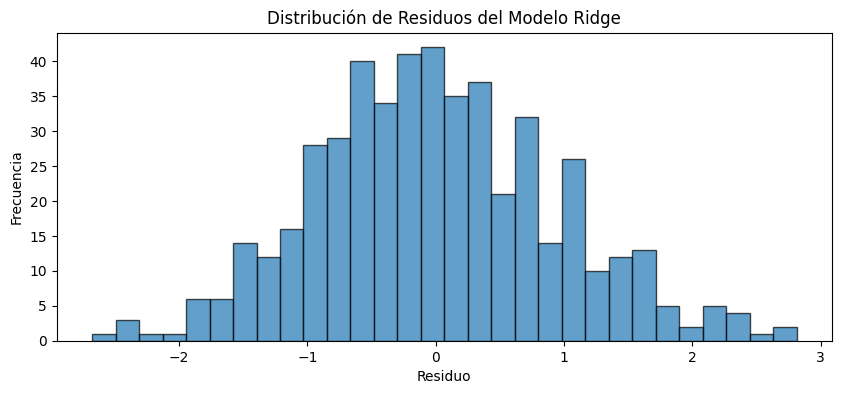


⚖️ Aplicando pesos exponenciales...


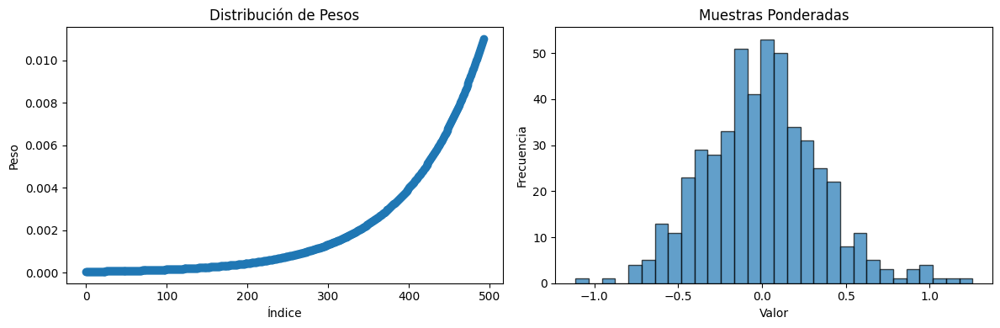

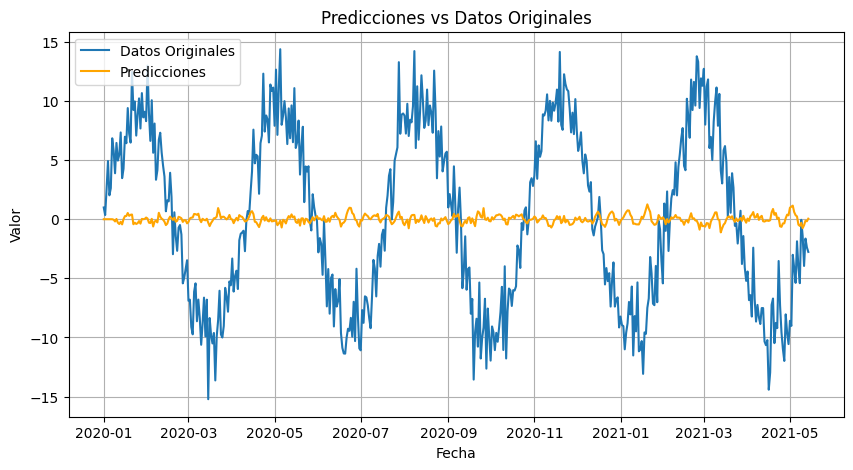

| 11        | -1.77     | 6.69      | 2.999     | 0.989     |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


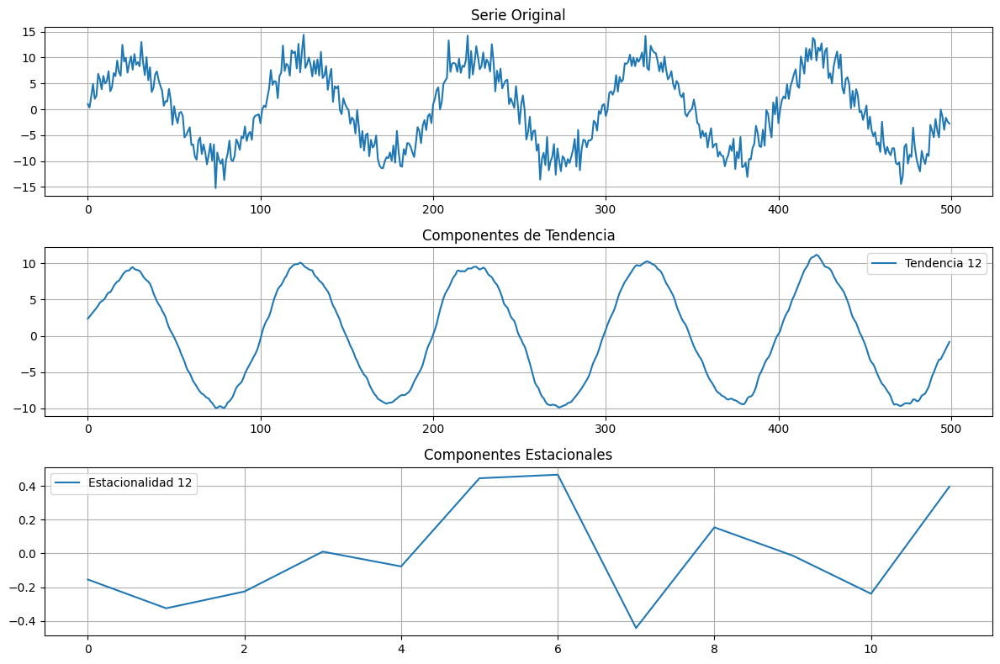

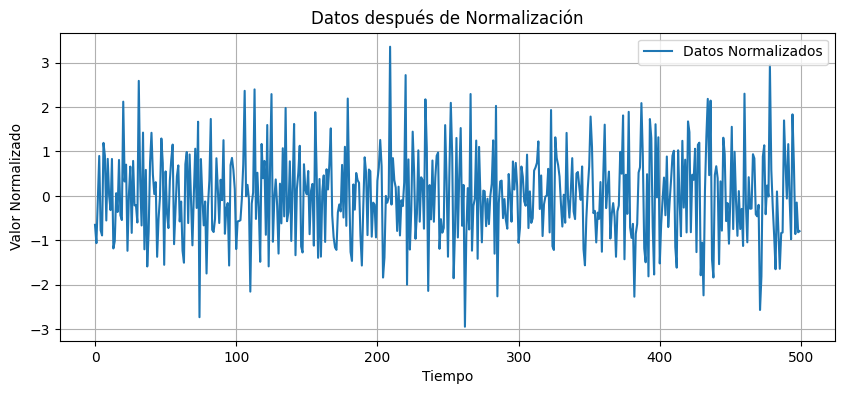


📦 Creando matriz de rezagos (lags=8, grado=1)
   Forma final de la matriz: (492, 9)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.050600


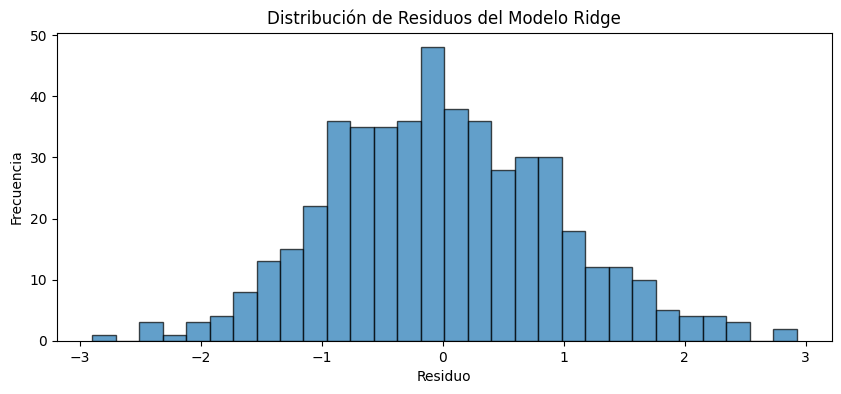


⚖️ Aplicando pesos exponenciales...


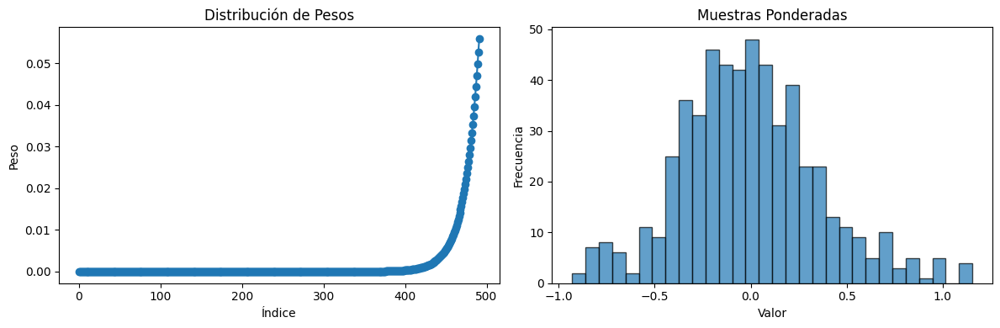

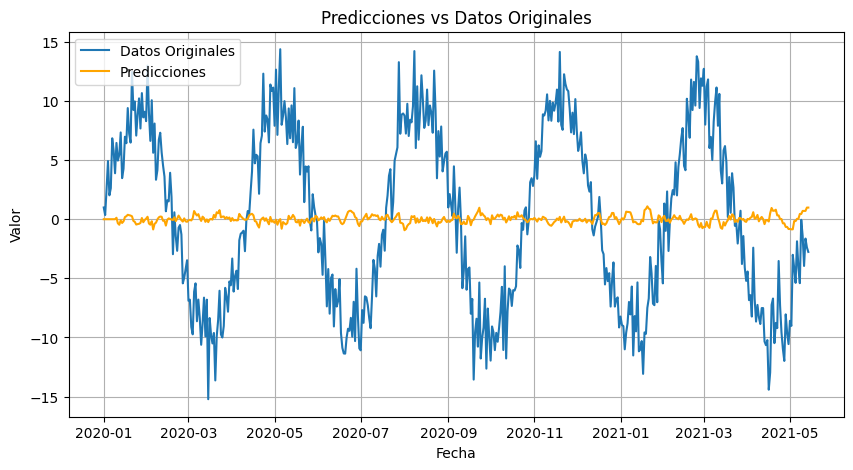

| 12        | -1.729    | 7.982     | 1.069     | 0.9441    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


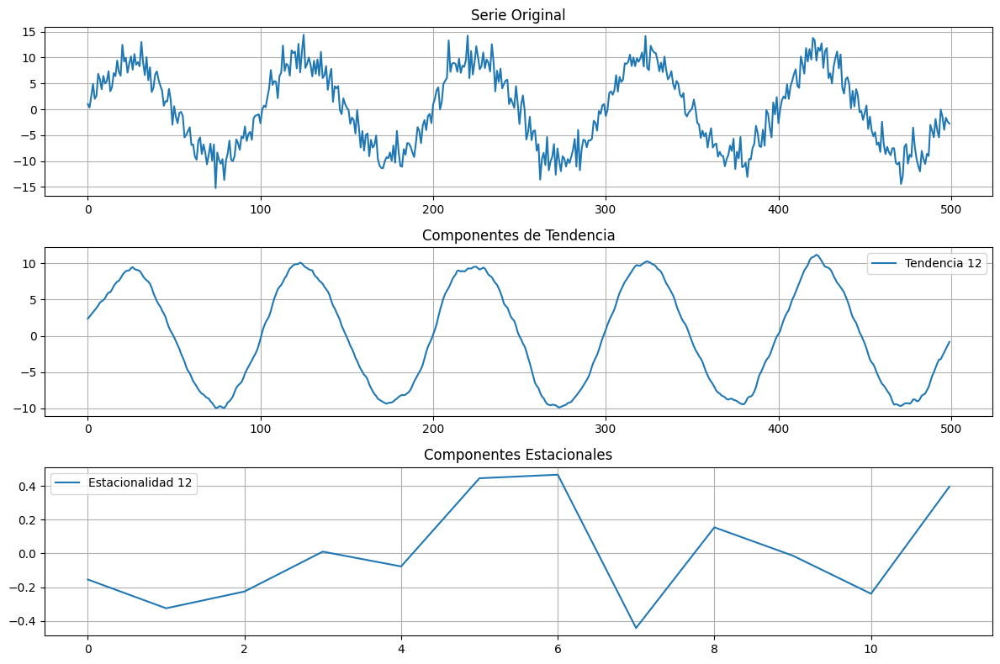

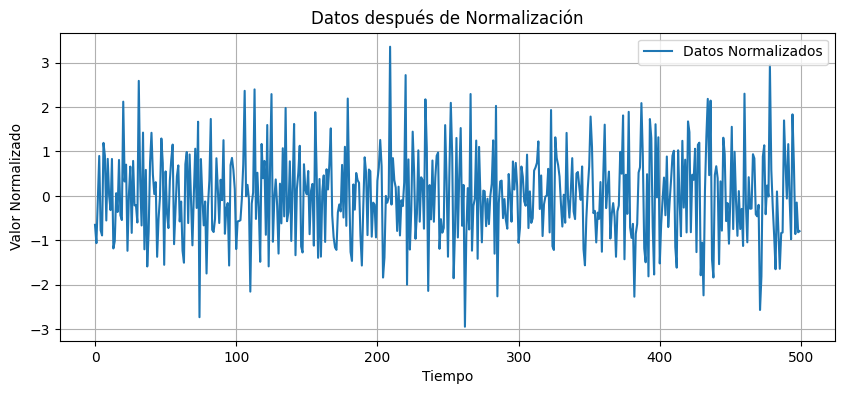


📦 Creando matriz de rezagos (lags=8, grado=3)
   Forma final de la matriz: (492, 25)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.022038


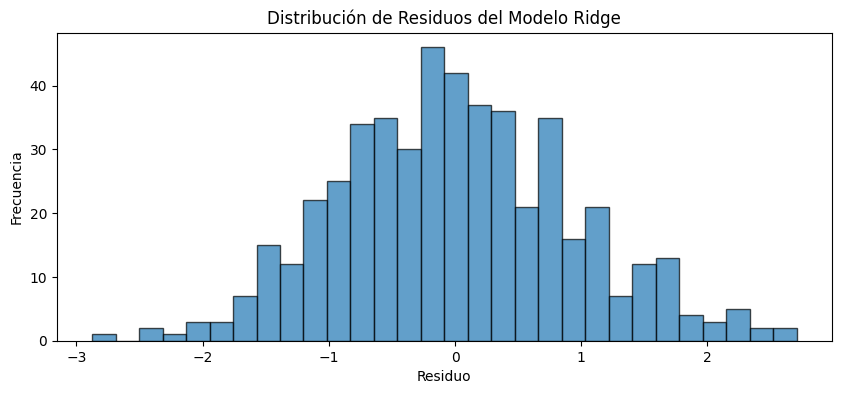


⚖️ Aplicando pesos exponenciales...


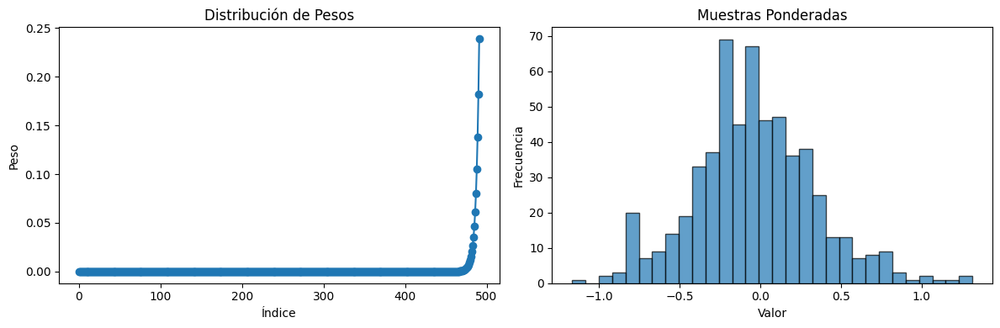

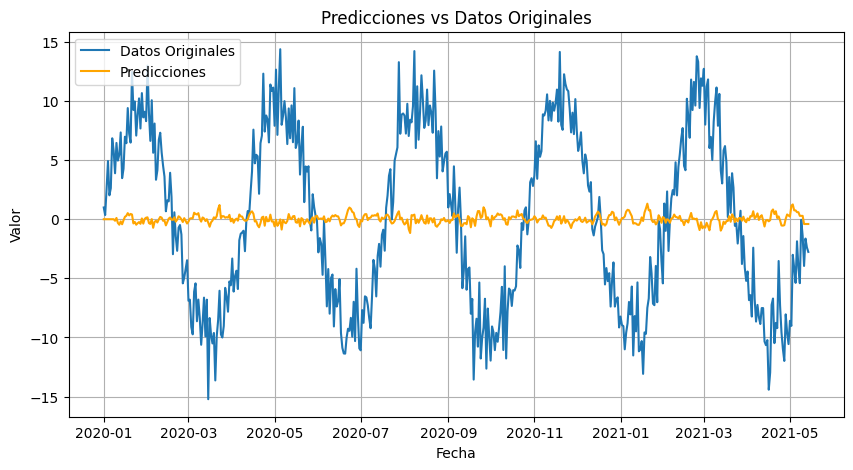

| 13        | -1.701    | 7.999     | 2.728     | 0.7612    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


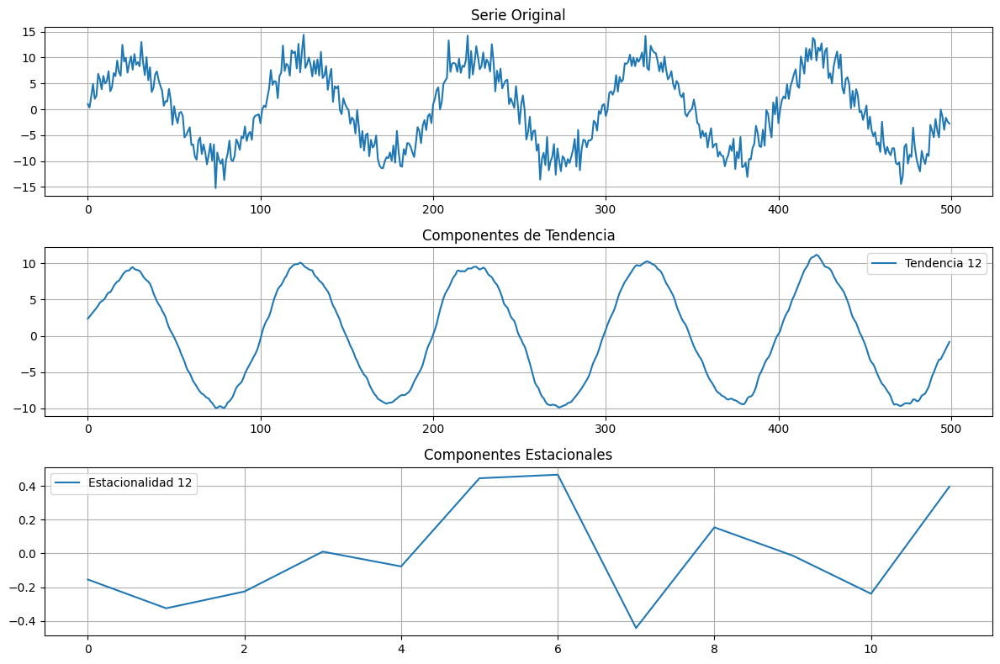

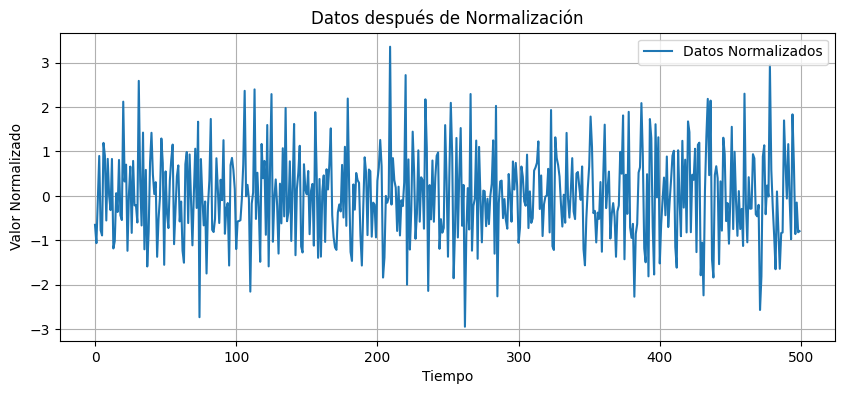


📦 Creando matriz de rezagos (lags=8, grado=2)
   Forma final de la matriz: (492, 17)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.039246


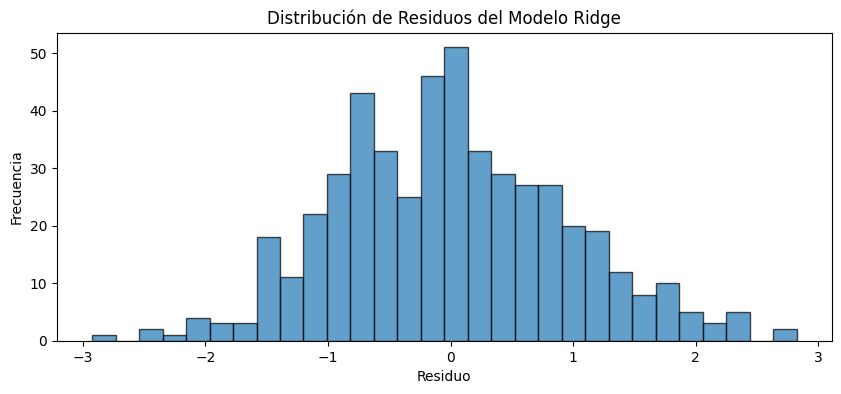


⚖️ Aplicando pesos exponenciales...


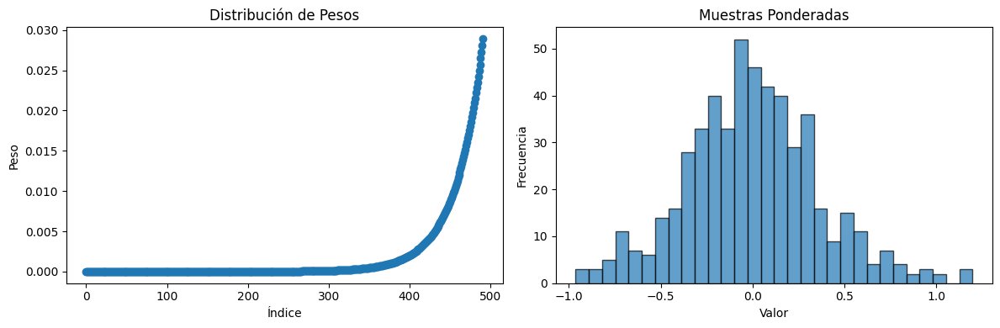

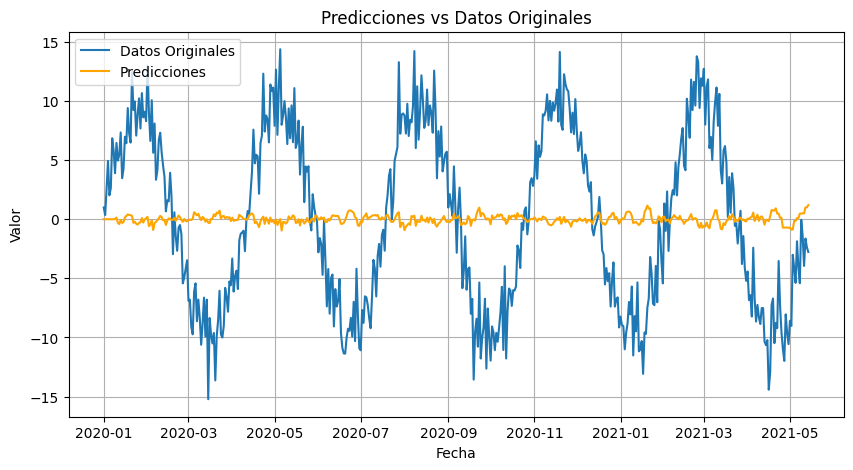

| 14        | -1.721    | 7.998     | 2.187     | 0.9711    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


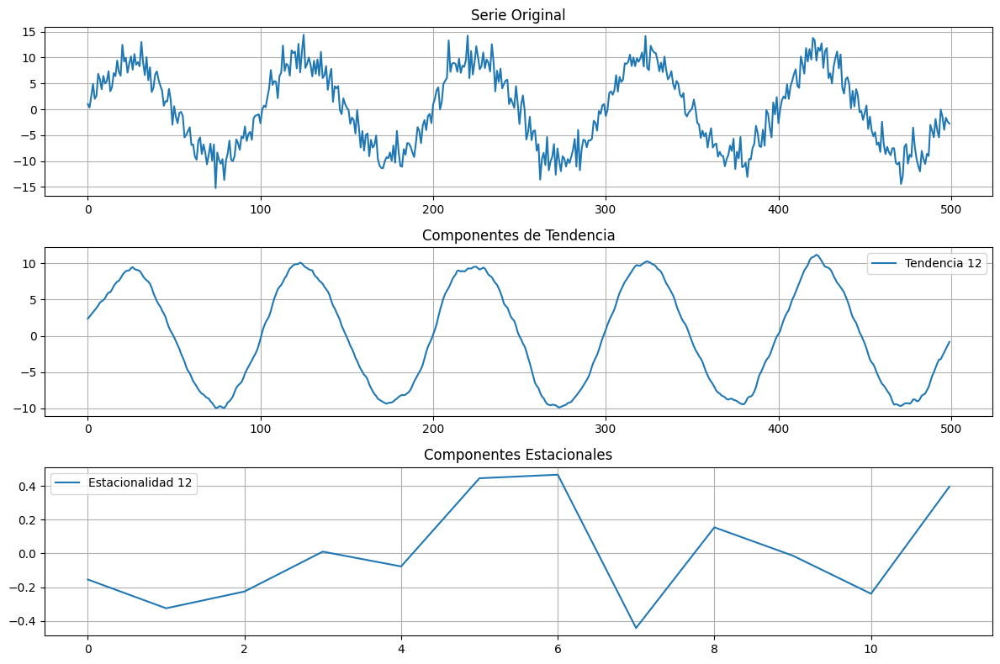

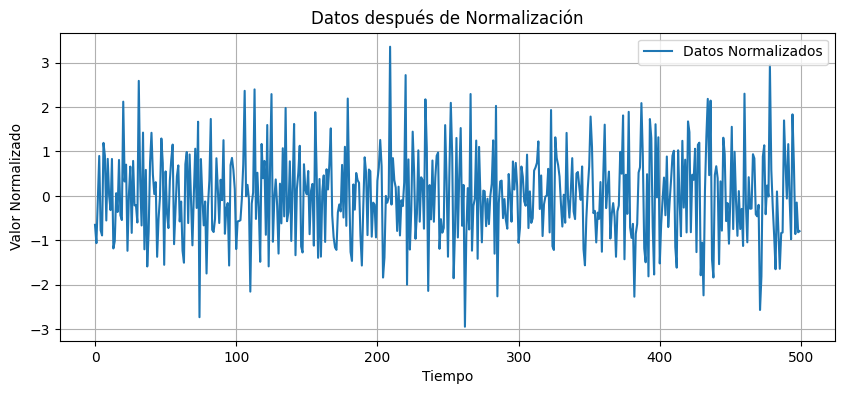


📦 Creando matriz de rezagos (lags=8, grado=3)
   Forma final de la matriz: (492, 25)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.022038


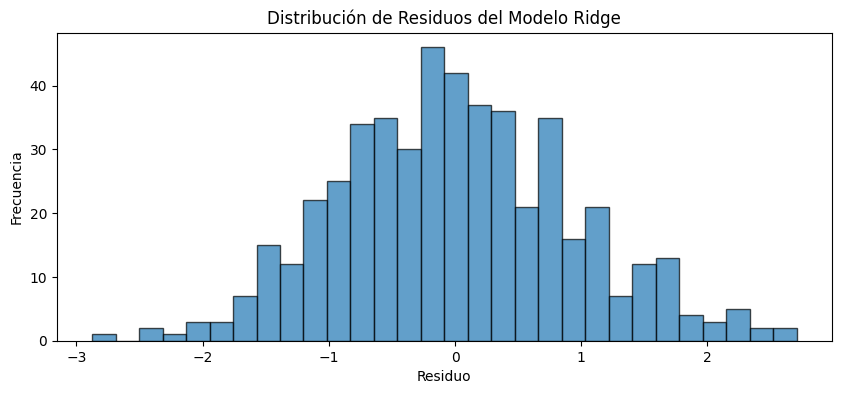


⚖️ Aplicando pesos exponenciales...


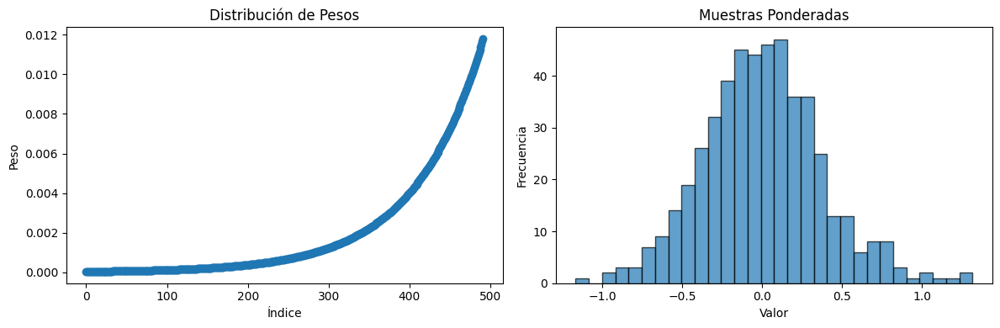

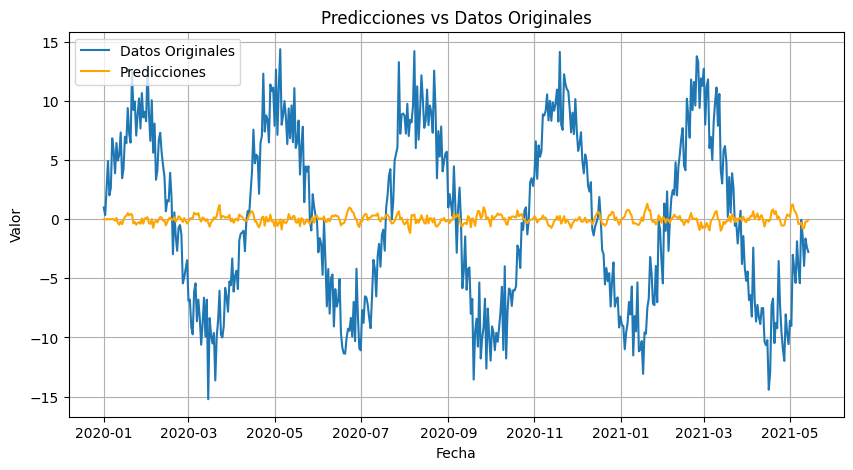

| 15        | -1.746    | 7.867     | 2.978     | 0.9882    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


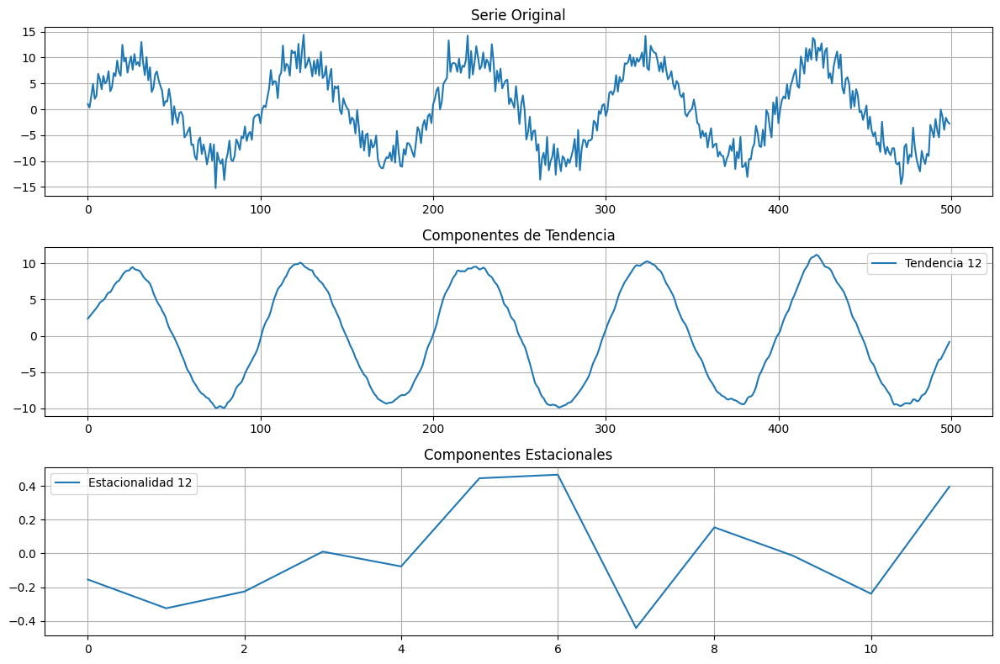

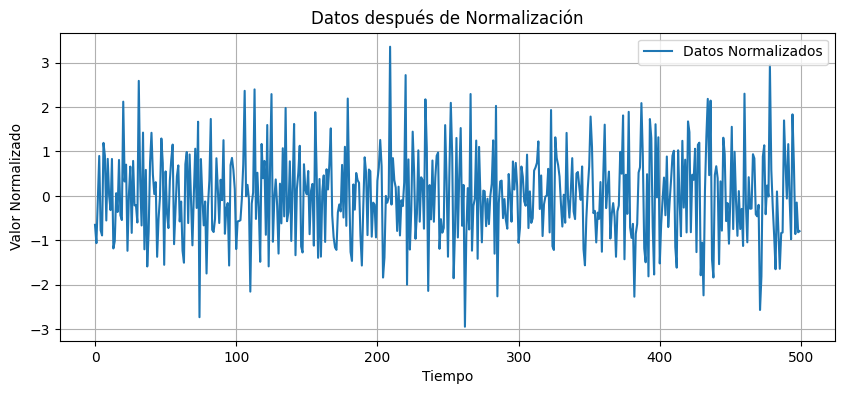


📦 Creando matriz de rezagos (lags=5, grado=3)
   Forma final de la matriz: (495, 16)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.022536


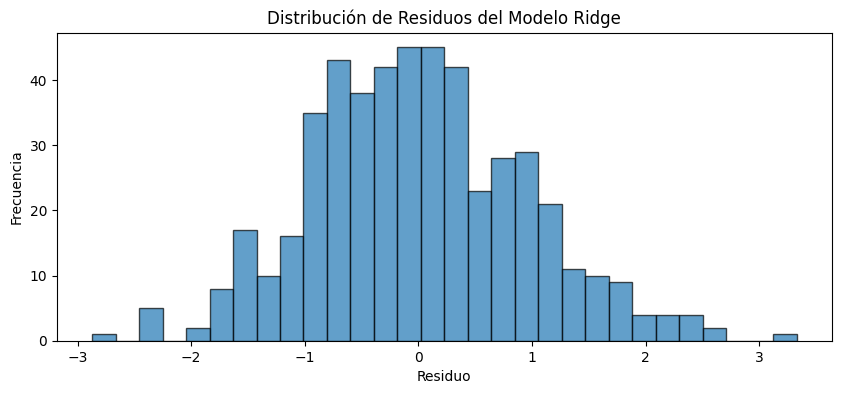


⚖️ Aplicando pesos exponenciales...


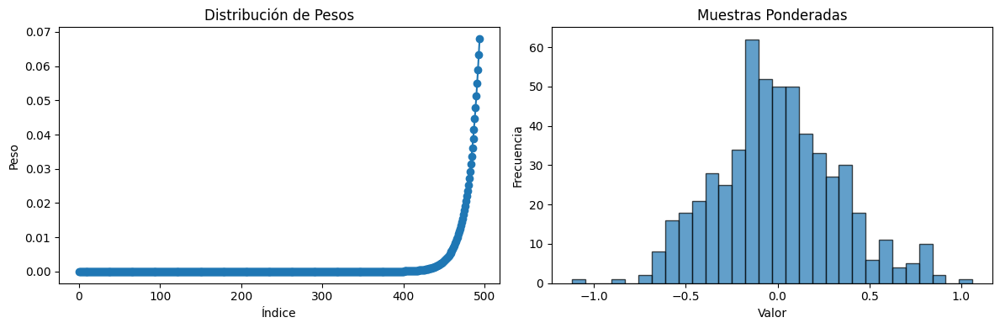

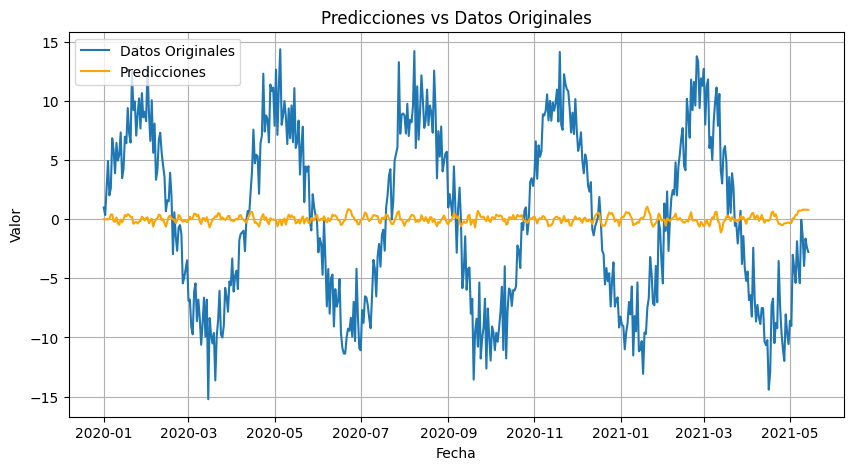

| 16        | -1.735    | 5.341     | 2.99      | 0.932     |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


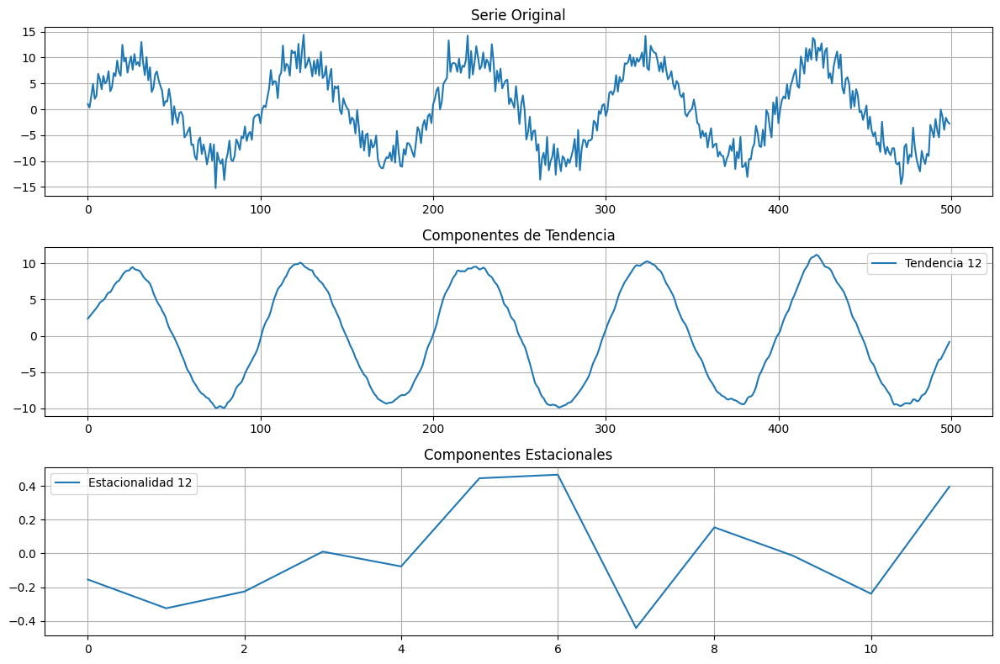

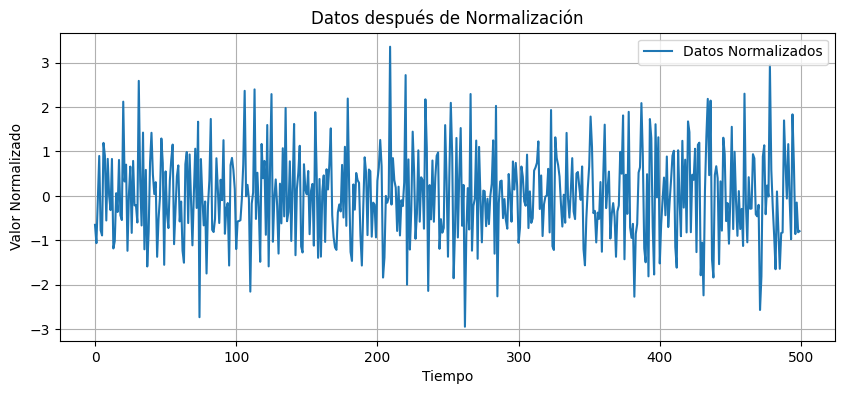


📦 Creando matriz de rezagos (lags=8, grado=2)
   Forma final de la matriz: (492, 17)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.039246


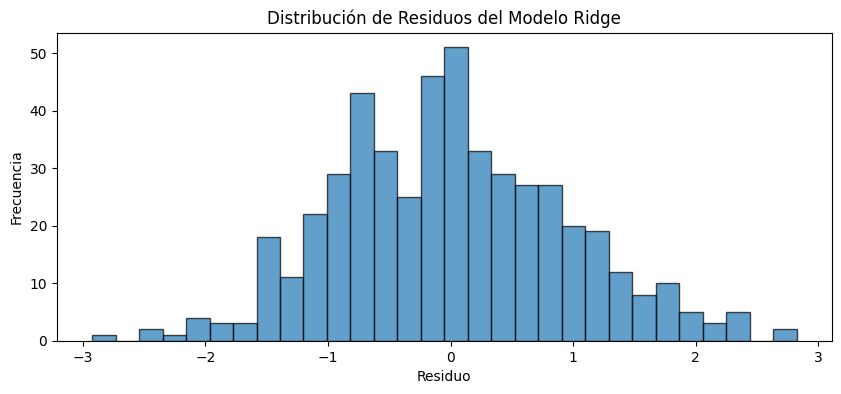


⚖️ Aplicando pesos exponenciales...


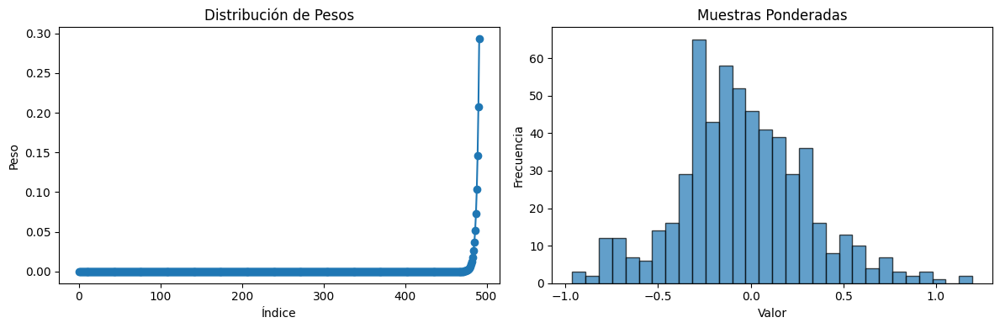

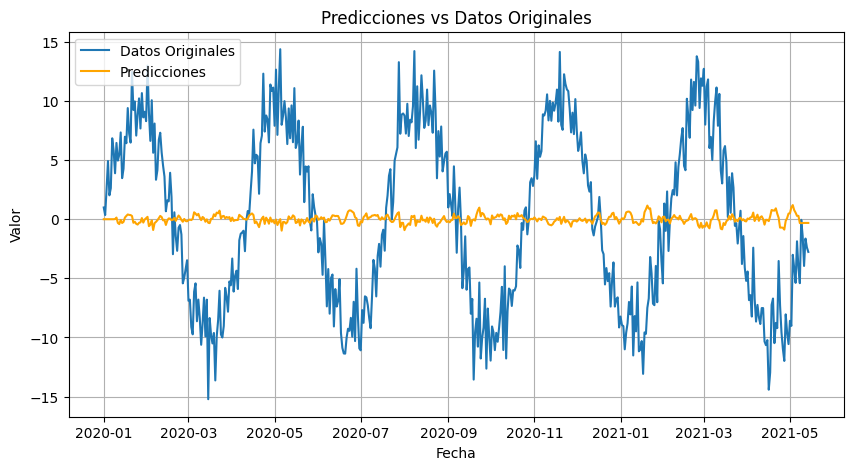

| 17        | -1.724    | 7.589     | 2.329     | 0.707     |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


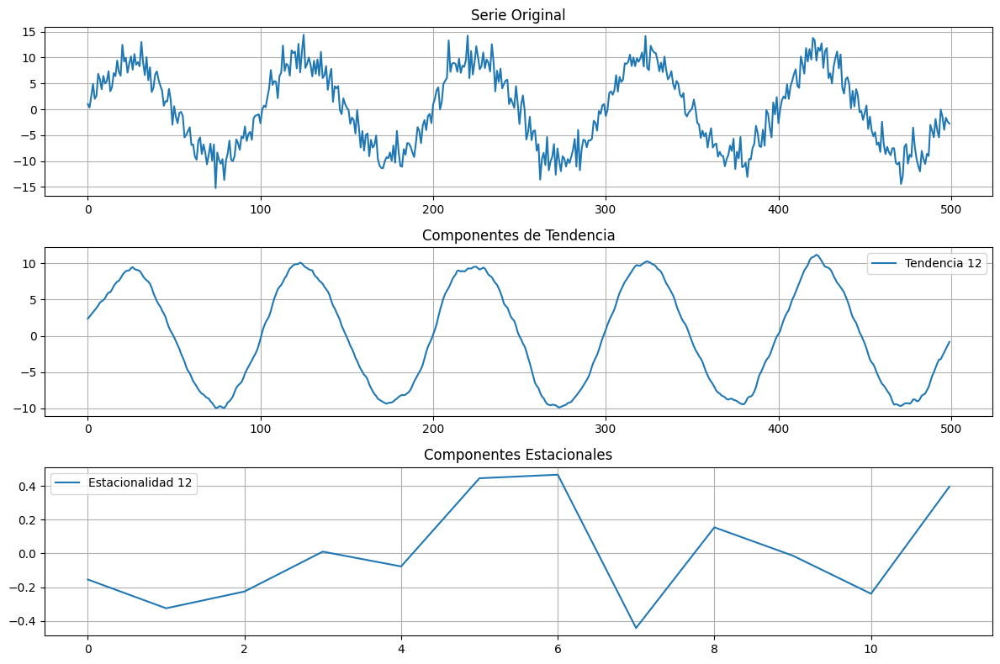

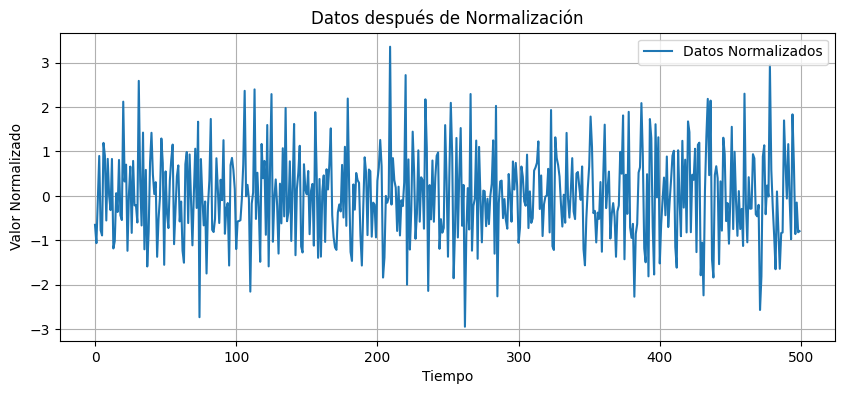


📦 Creando matriz de rezagos (lags=8, grado=2)
   Forma final de la matriz: (492, 17)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.039246


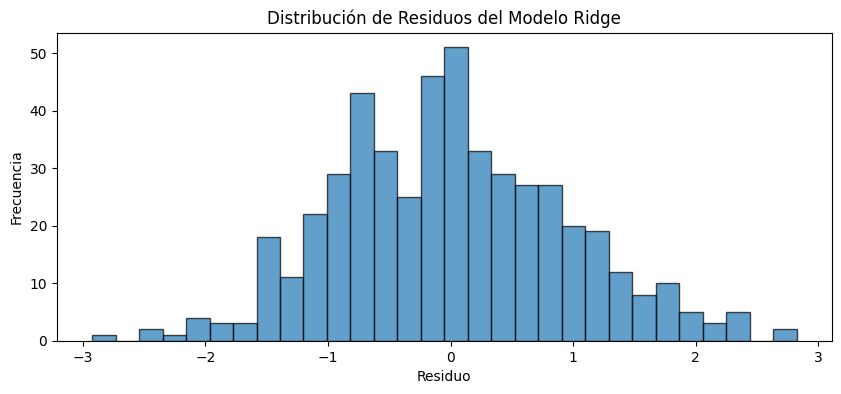


⚖️ Aplicando pesos exponenciales...


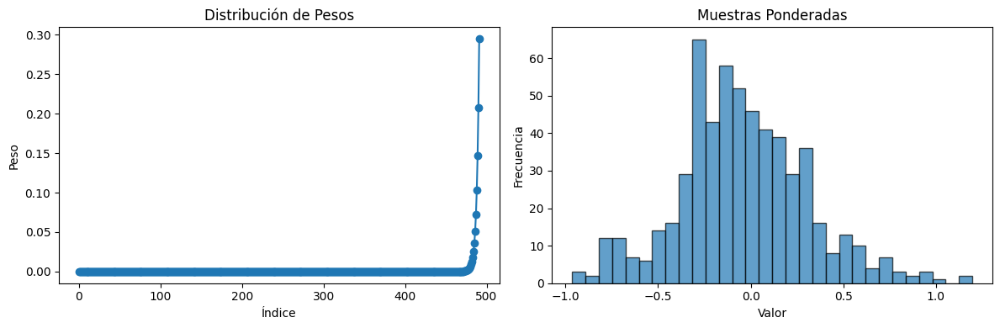

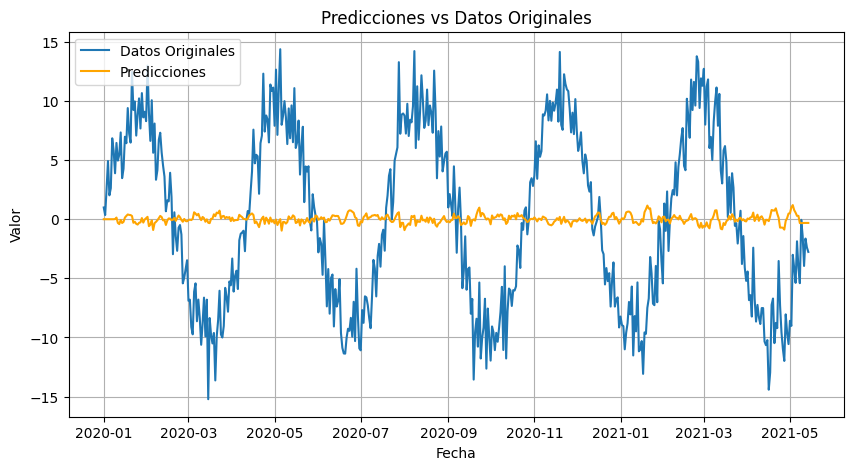

| 18        | -1.724    | 7.997     | 2.181     | 0.705     |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


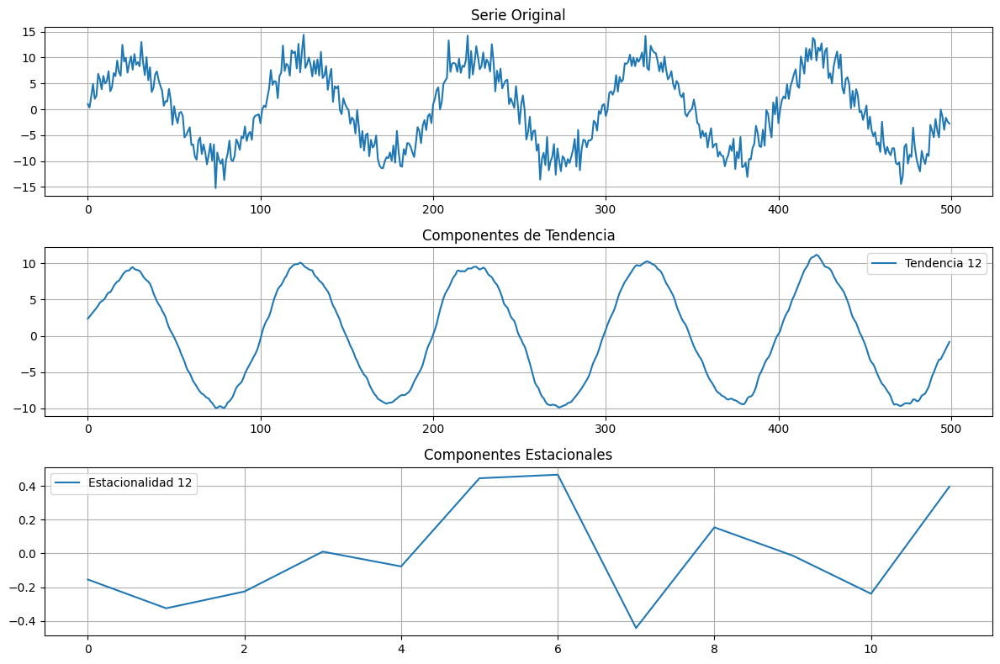

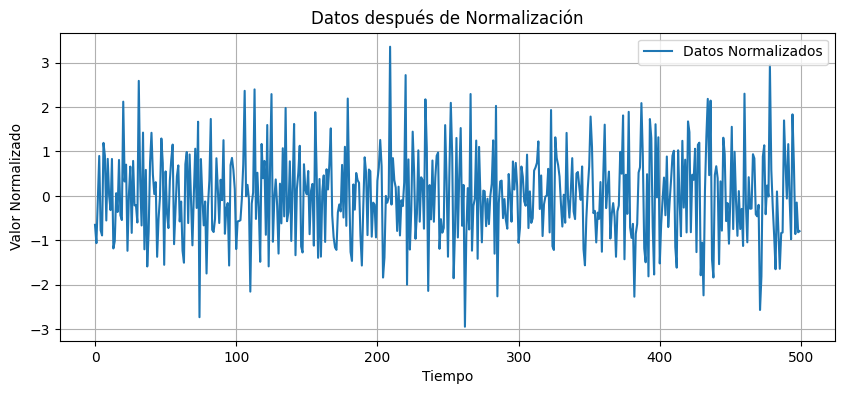


📦 Creando matriz de rezagos (lags=6, grado=2)
   Forma final de la matriz: (494, 13)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.039965


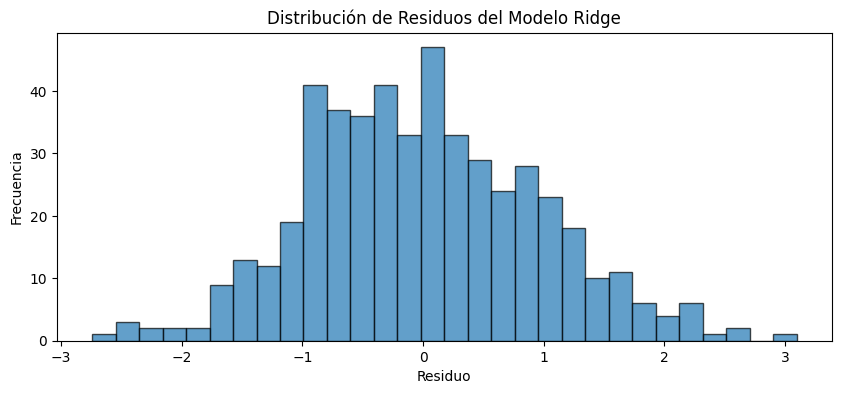


⚖️ Aplicando pesos exponenciales...


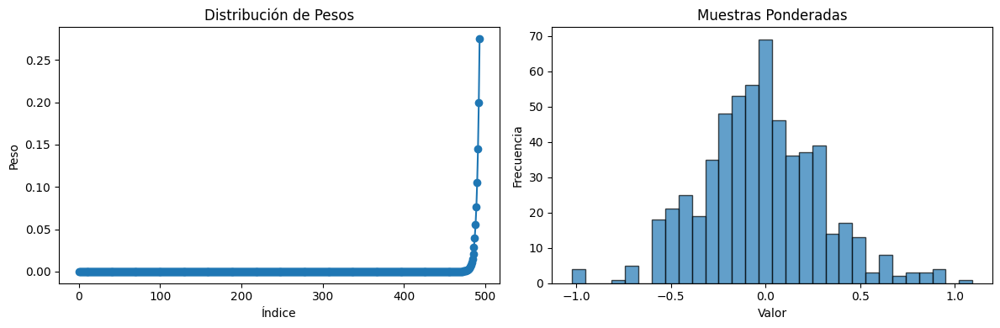

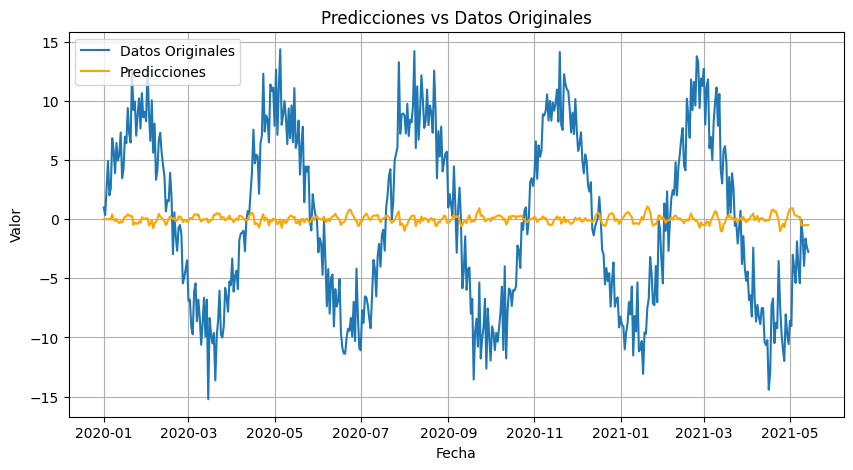

| 19        | -1.738    | 5.906     | 2.196     | 0.7251    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


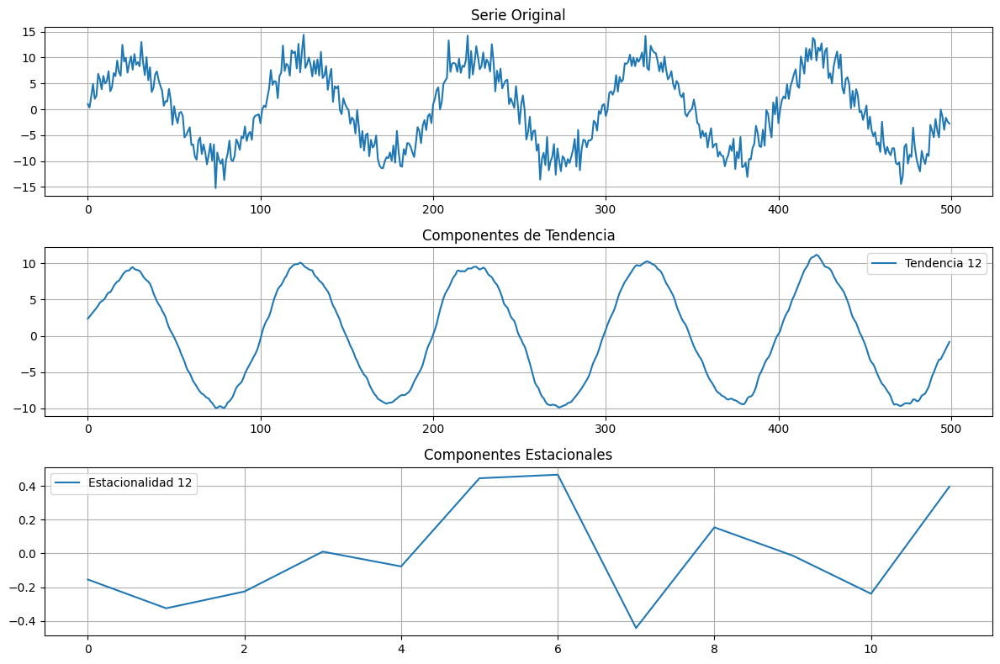

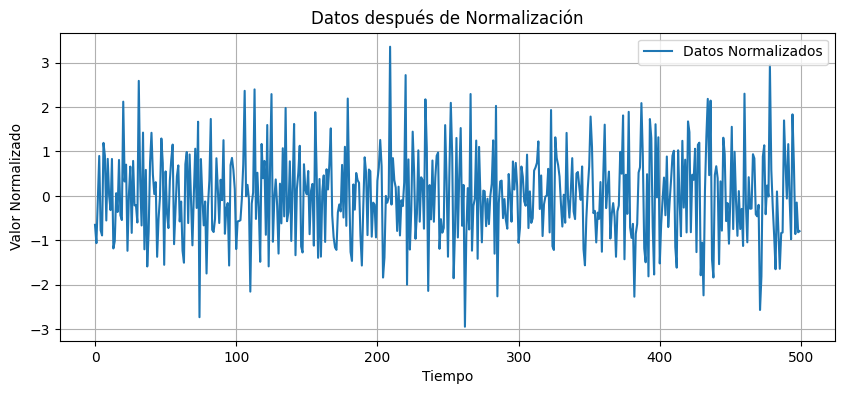


📦 Creando matriz de rezagos (lags=7, grado=1)
   Forma final de la matriz: (493, 8)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.051356


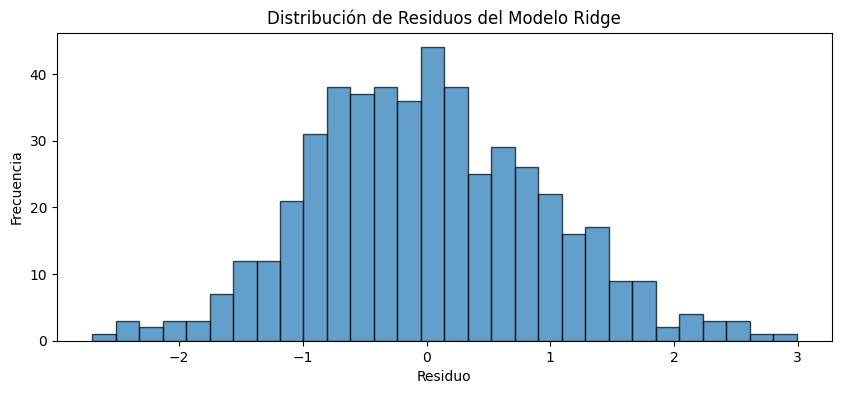


⚖️ Aplicando pesos exponenciales...


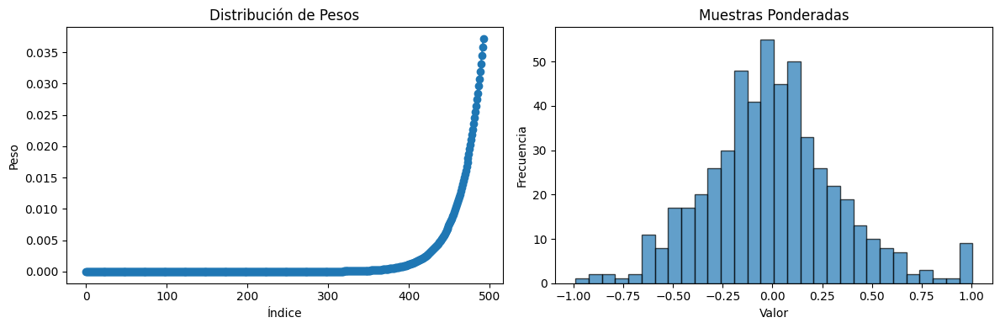

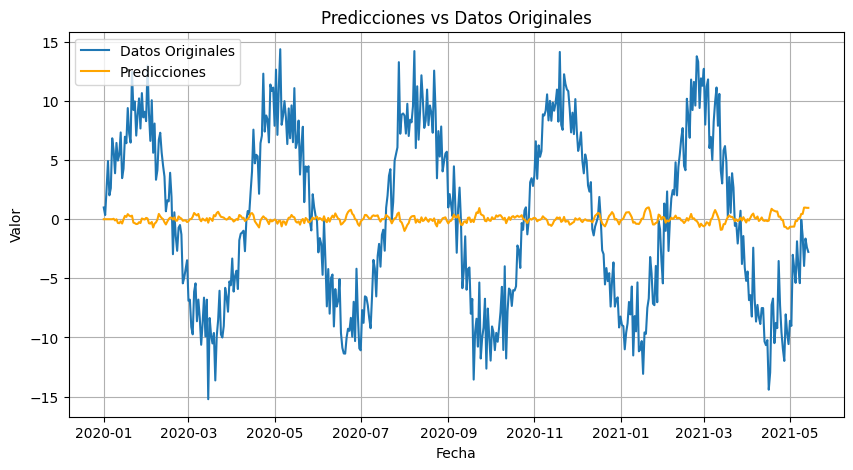

| 20        | -1.743    | 7.348     | 1.022     | 0.9629    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


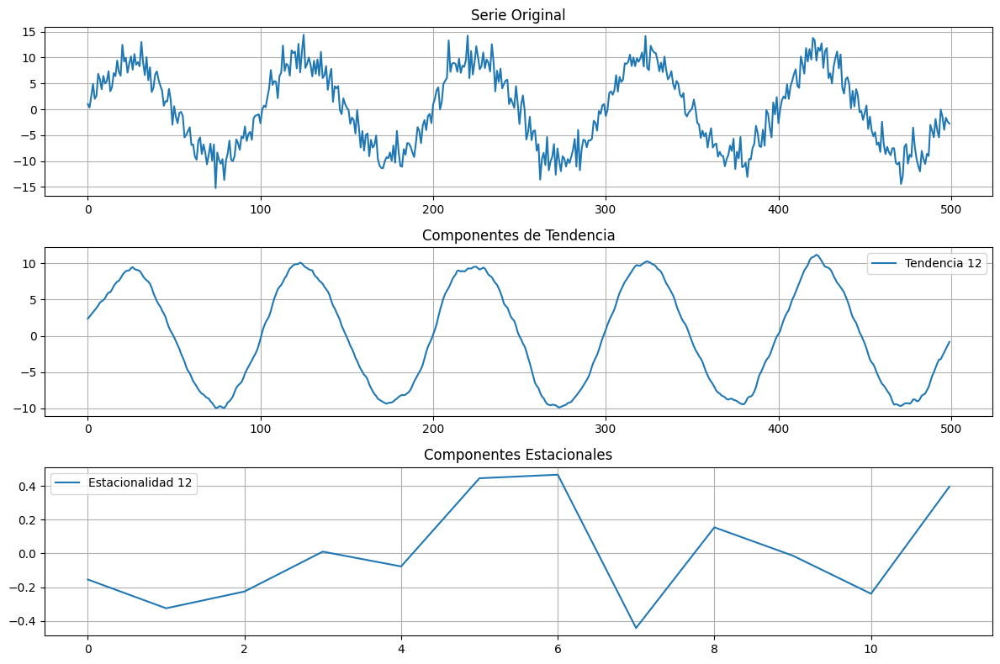

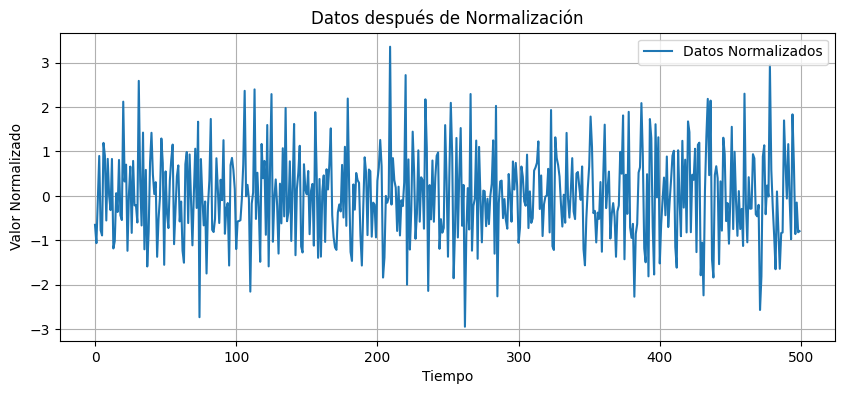


📦 Creando matriz de rezagos (lags=5, grado=2)
   Forma final de la matriz: (495, 11)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.040549


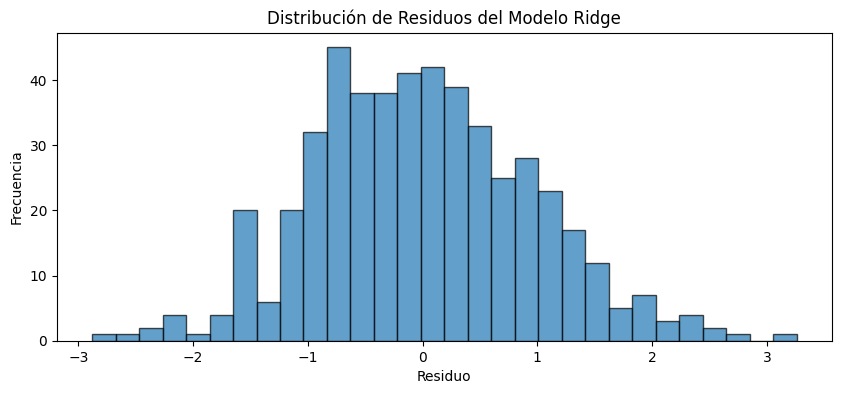


⚖️ Aplicando pesos exponenciales...


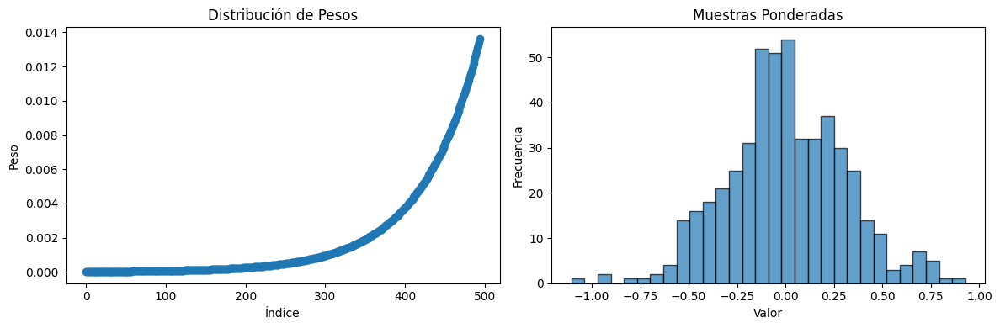

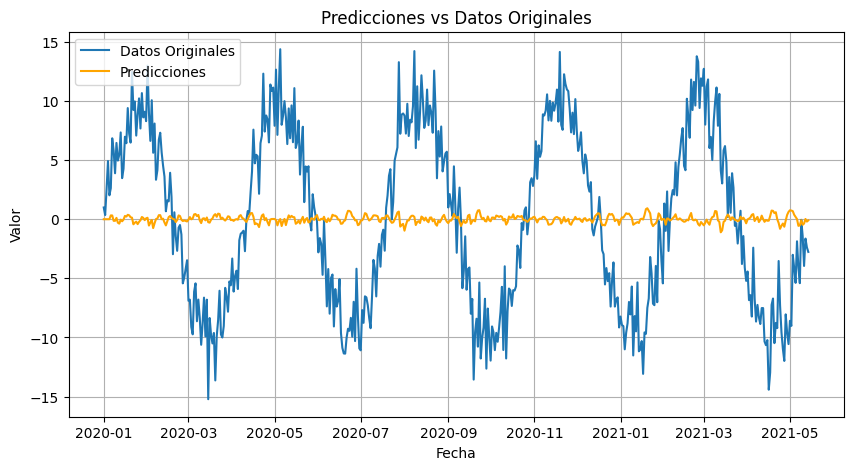

| 21        | -1.787    | 5.277     | 2.261     | 0.9864    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


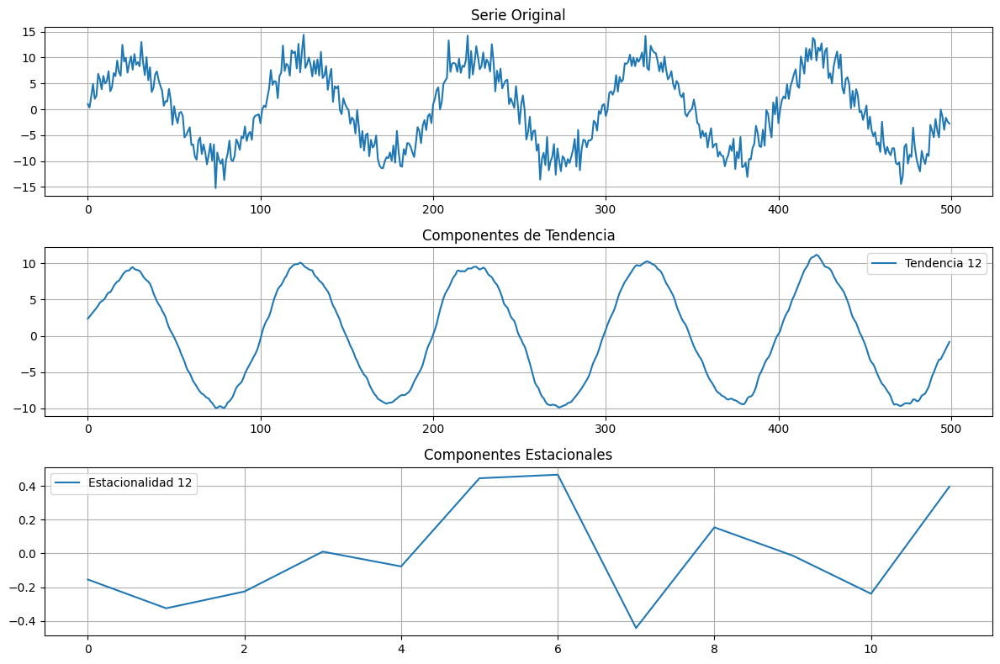

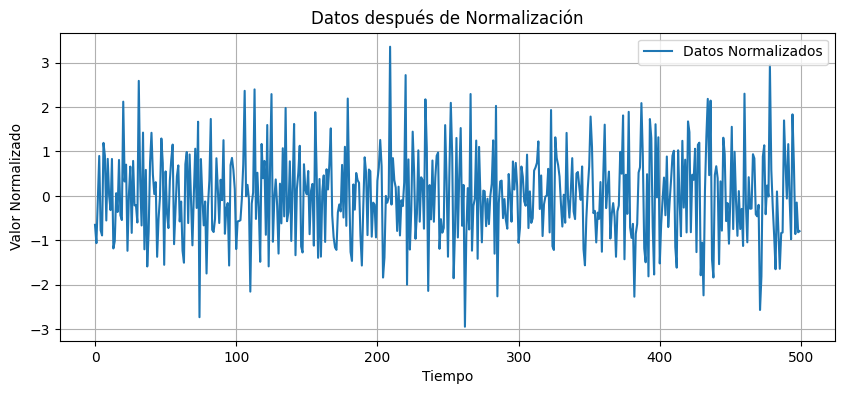


📦 Creando matriz de rezagos (lags=6, grado=3)
   Forma final de la matriz: (494, 19)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.022314


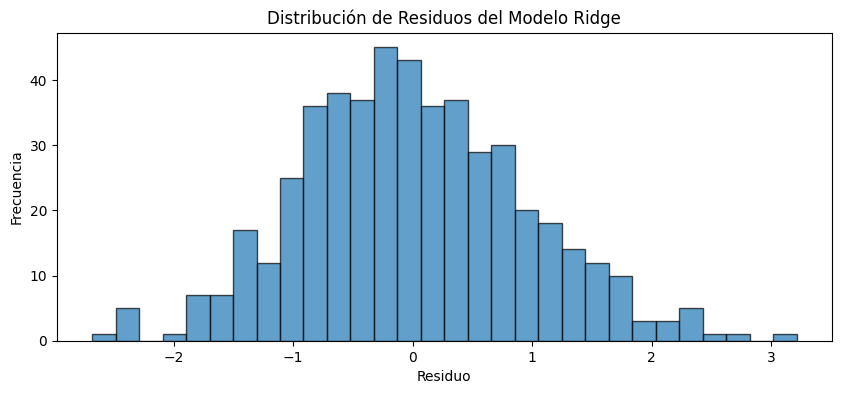


⚖️ Aplicando pesos exponenciales...


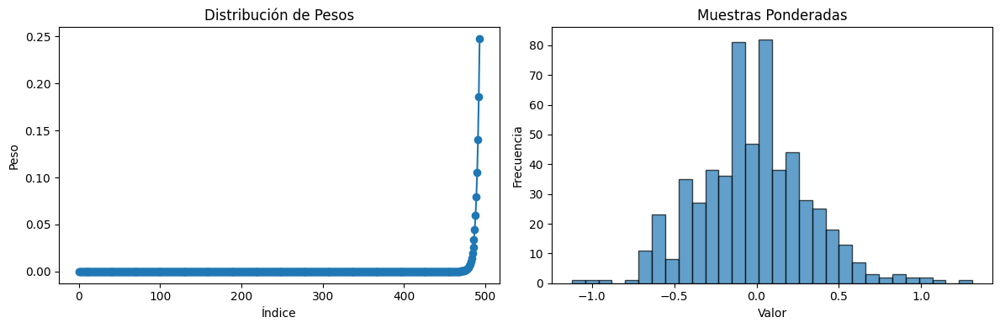

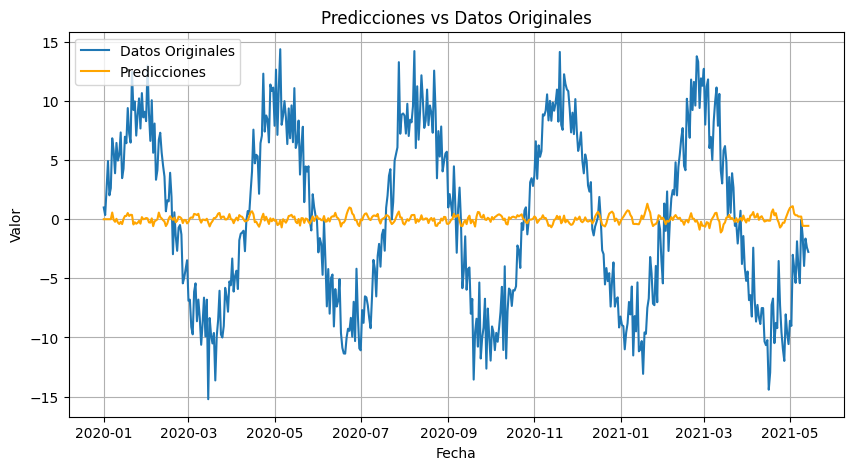

| 22        | -1.722    | 5.915     | 2.997     | 0.7526    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


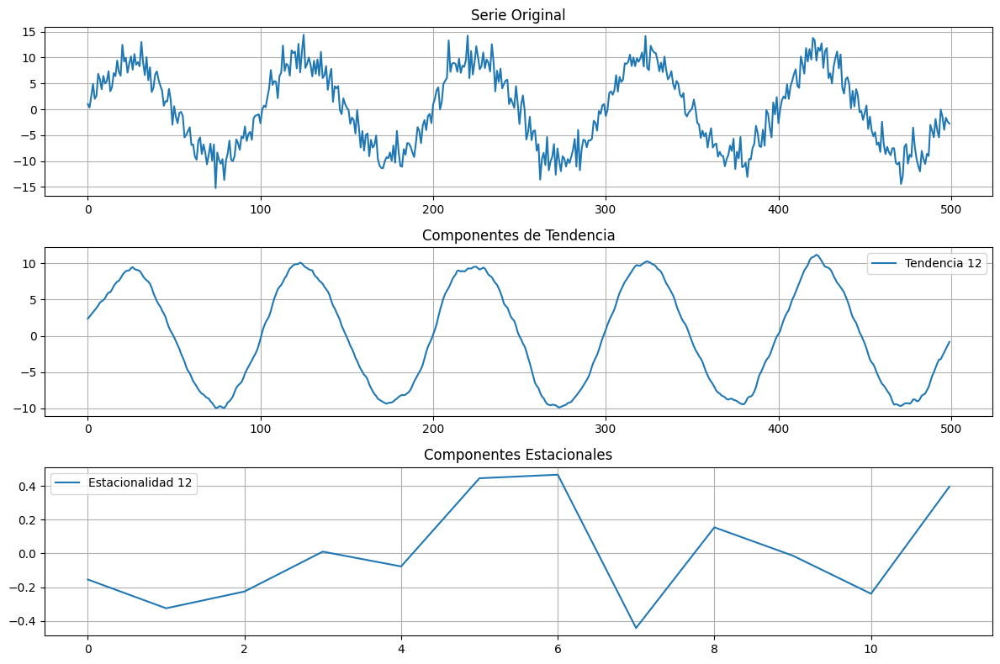

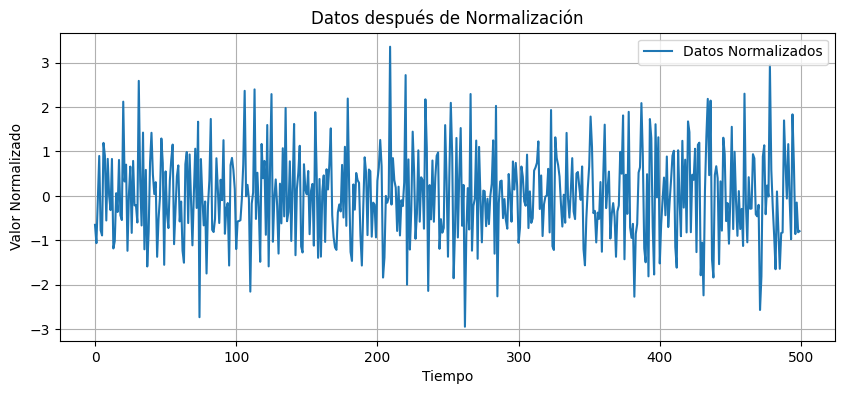


📦 Creando matriz de rezagos (lags=7, grado=2)
   Forma final de la matriz: (493, 15)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.039552


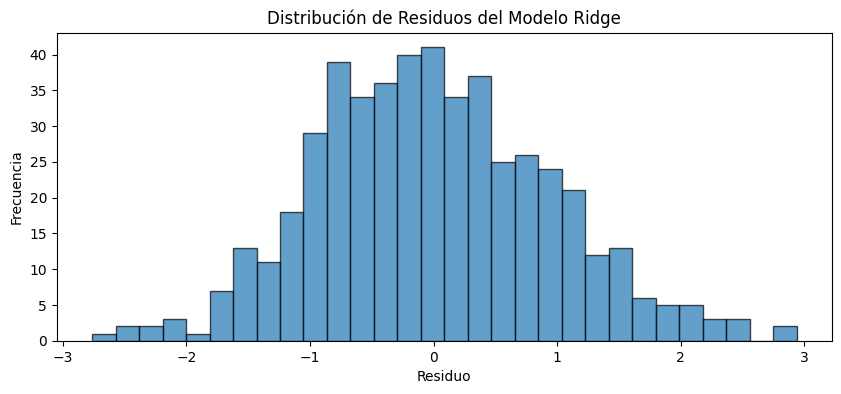


⚖️ Aplicando pesos exponenciales...


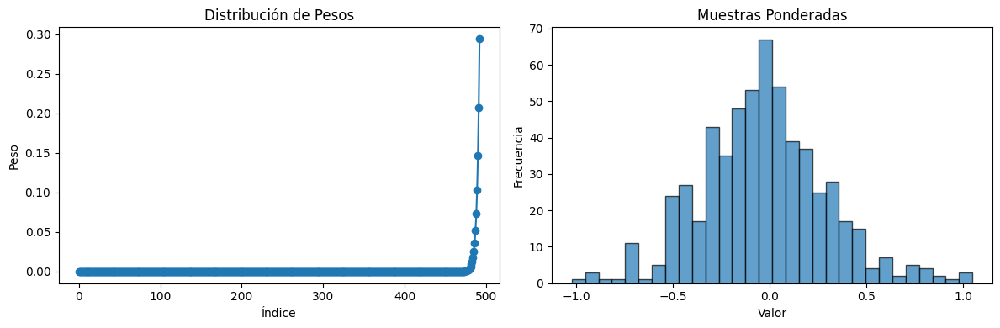

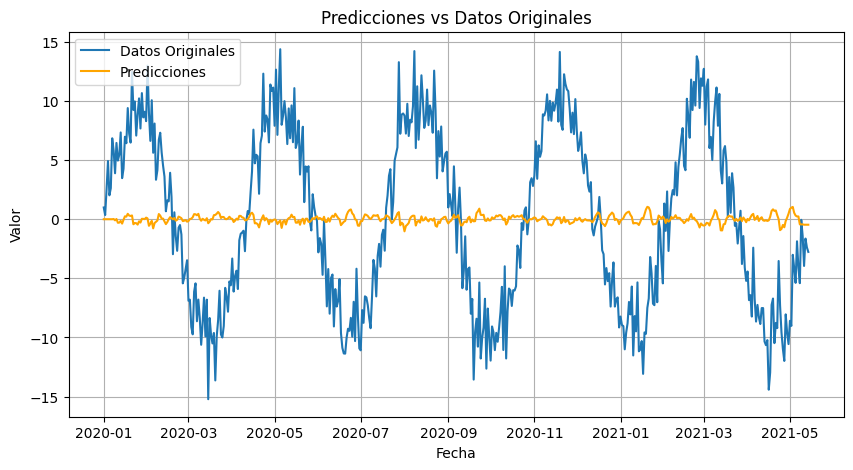

| 23        | -1.739    | 6.648     | 2.291     | 0.7057    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


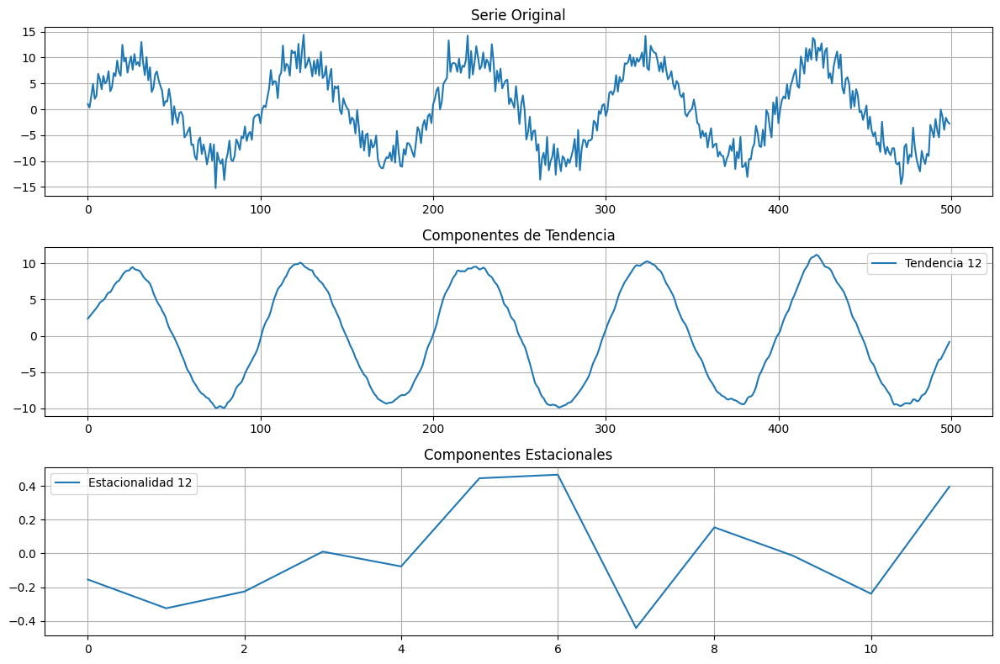

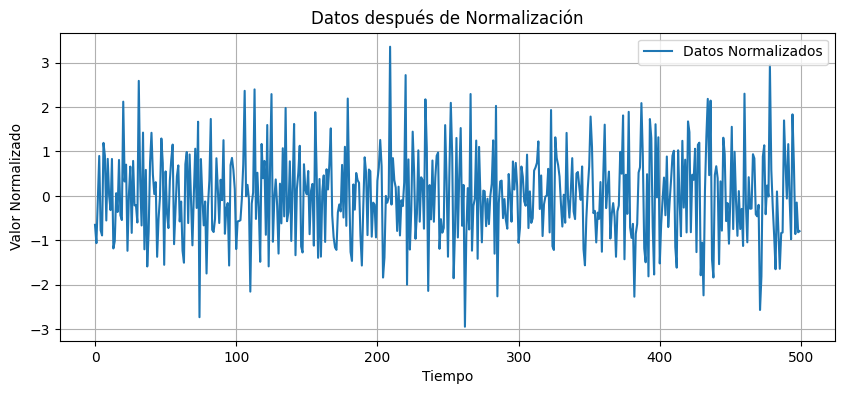


📦 Creando matriz de rezagos (lags=5, grado=3)
   Forma final de la matriz: (495, 16)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.022536


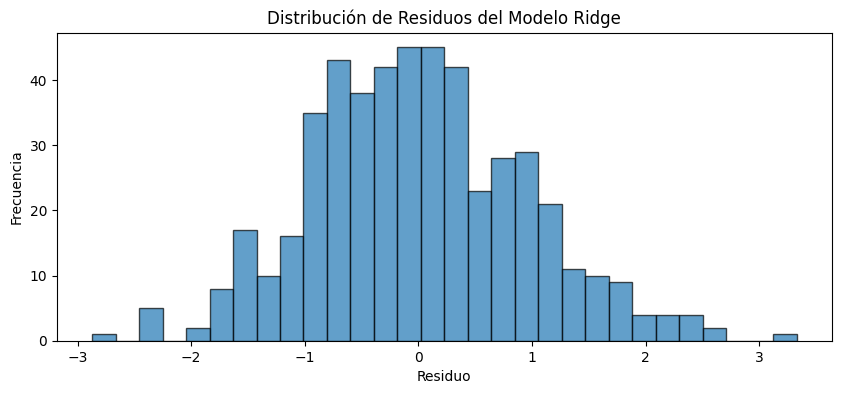


⚖️ Aplicando pesos exponenciales...


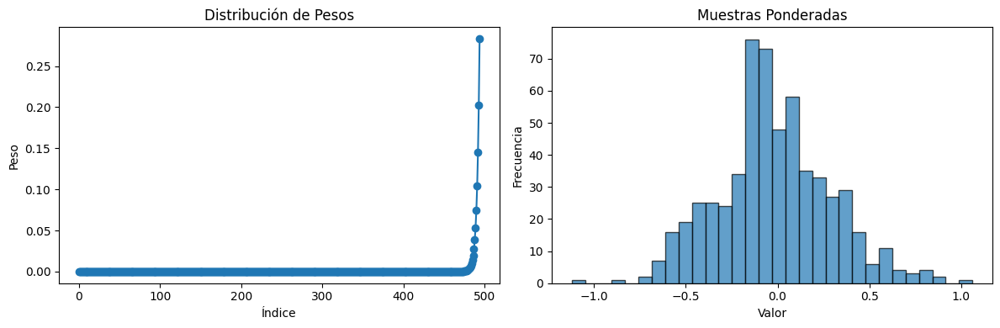

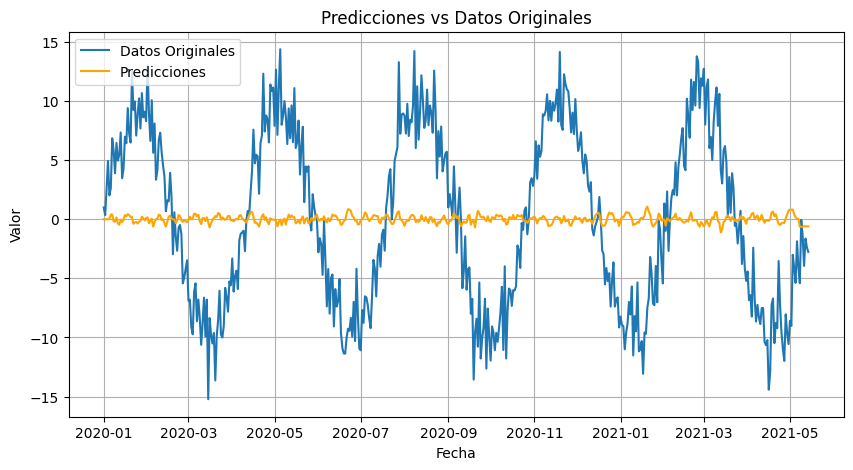

| 24        | -1.736    | 4.661     | 2.99      | 0.7168    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


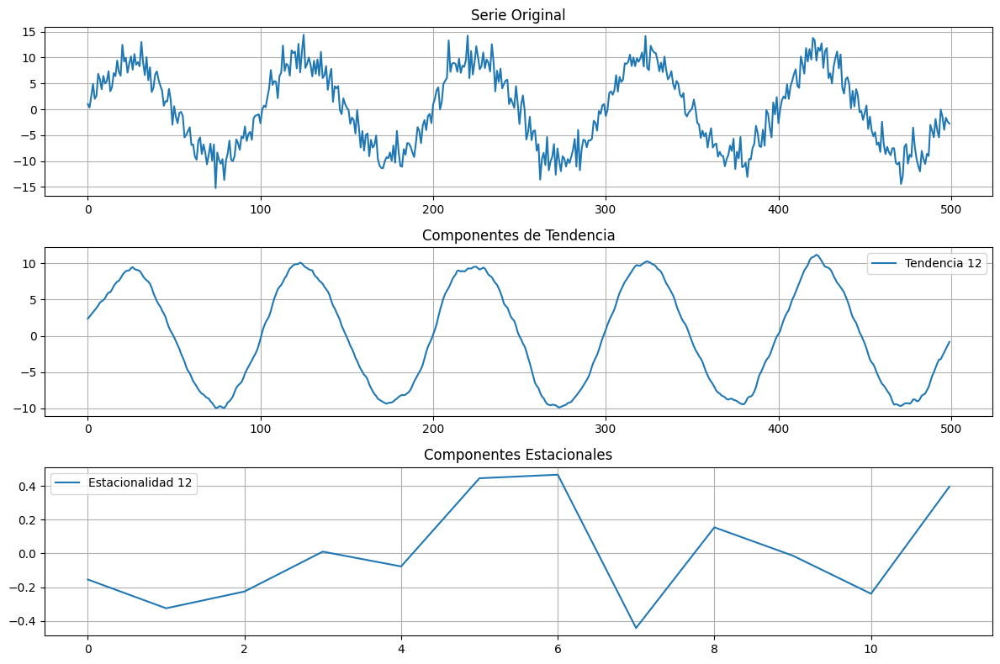

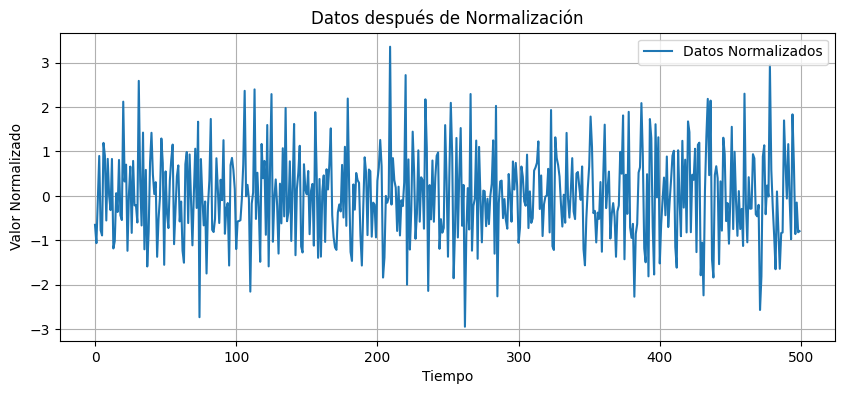


📦 Creando matriz de rezagos (lags=8, grado=3)
   Forma final de la matriz: (492, 25)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.022038


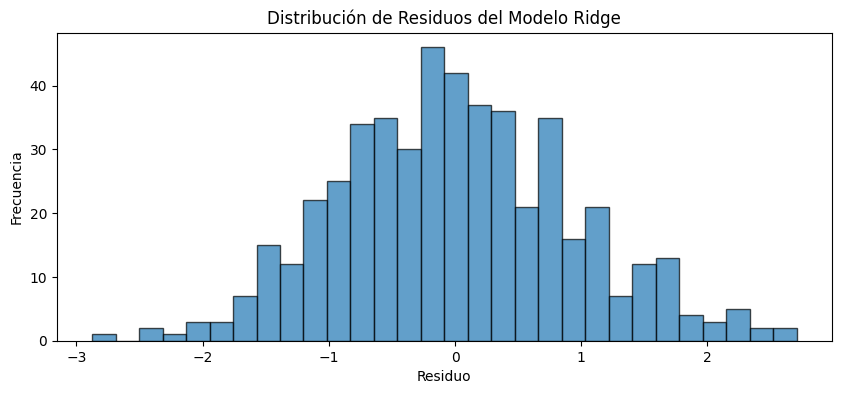


⚖️ Aplicando pesos exponenciales...


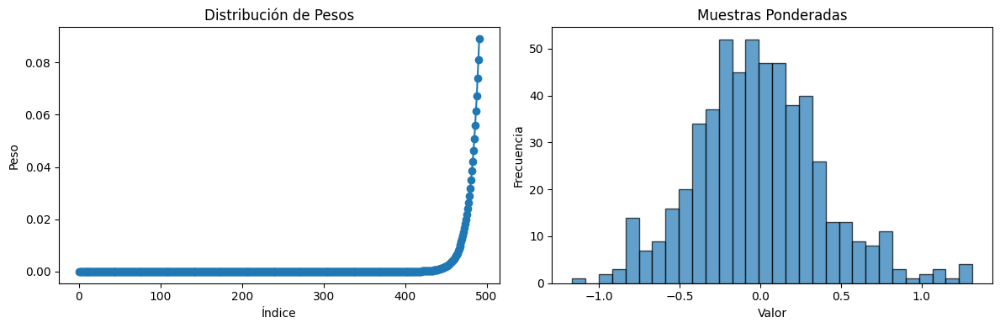

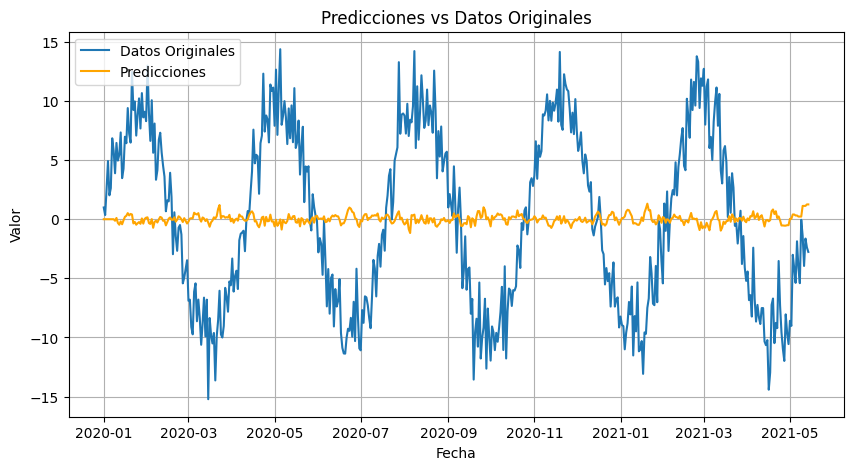

| 25        | -1.699    | 7.991     | 2.535     | 0.9109    |

🔍 Fase 2: Búsqueda local (5 iteraciones)
|   iter    |  target   |  n_lags   | poly_d... |    rho    |
-------------------------------------------------------------

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


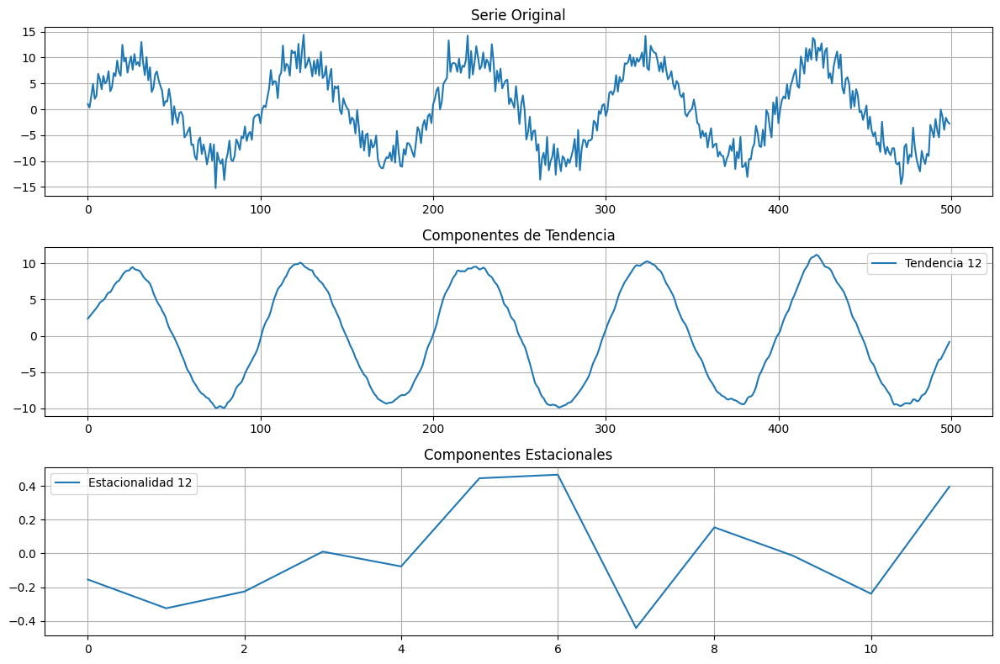

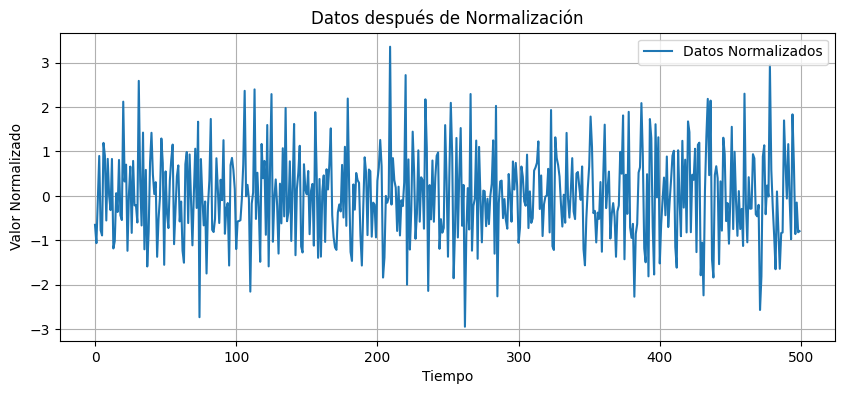


📦 Creando matriz de rezagos (lags=8, grado=2)
   Forma final de la matriz: (492, 17)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.039246


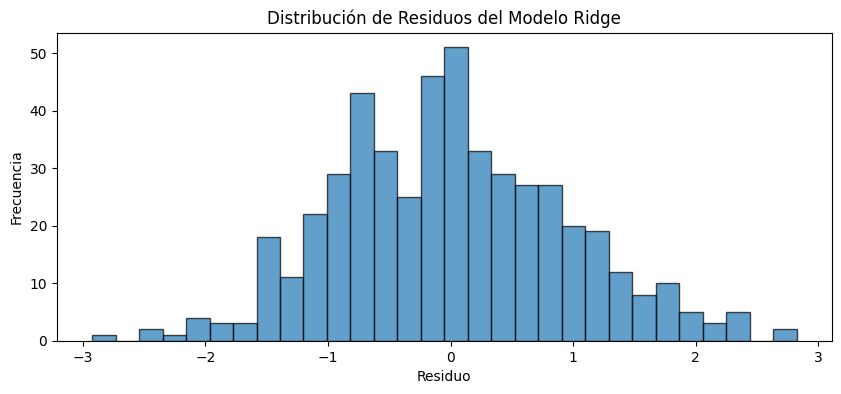


⚖️ Aplicando pesos exponenciales...


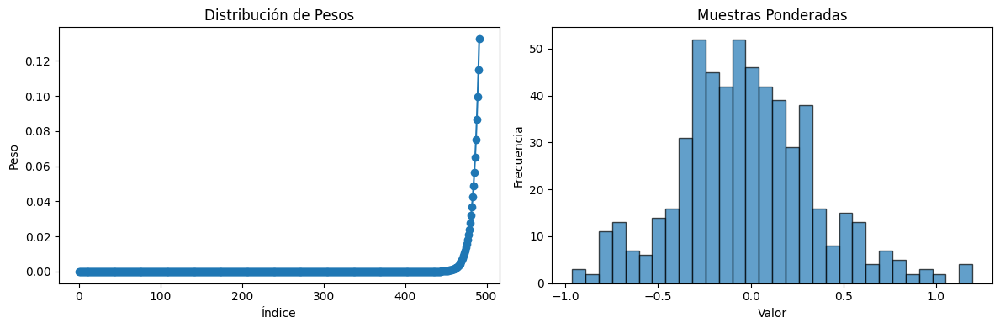

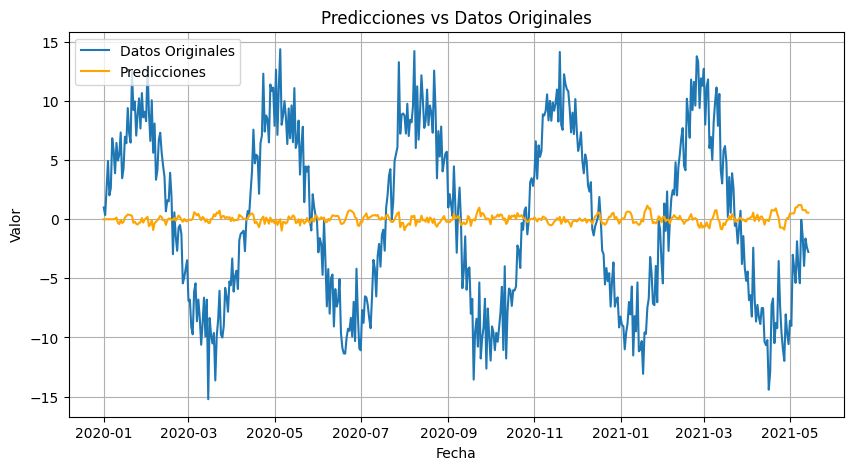

| 26        | -1.716    | 7.604     | 1.785     | 0.8674    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


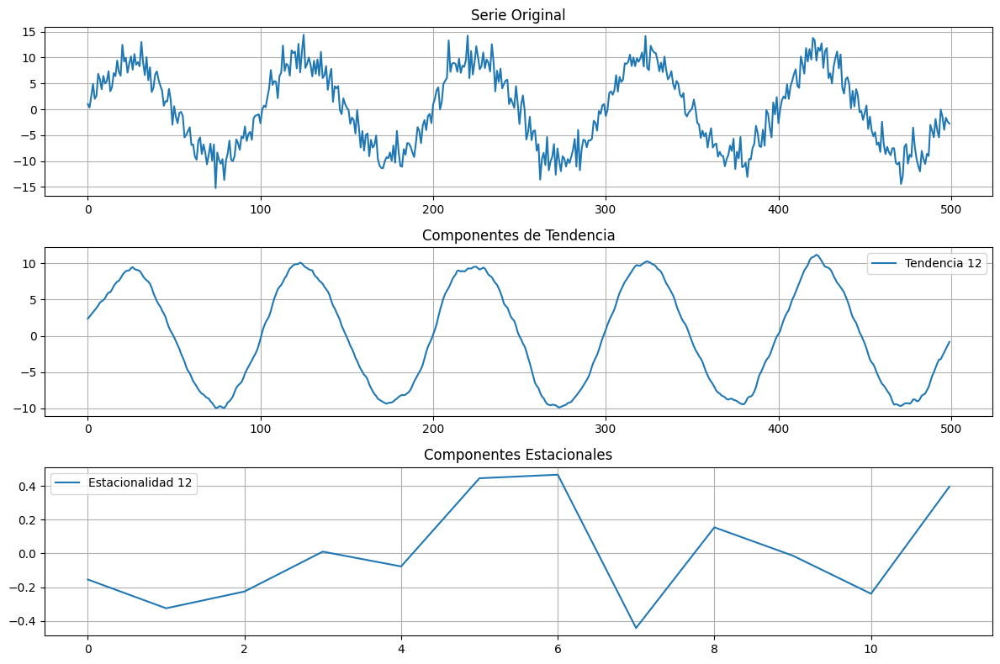

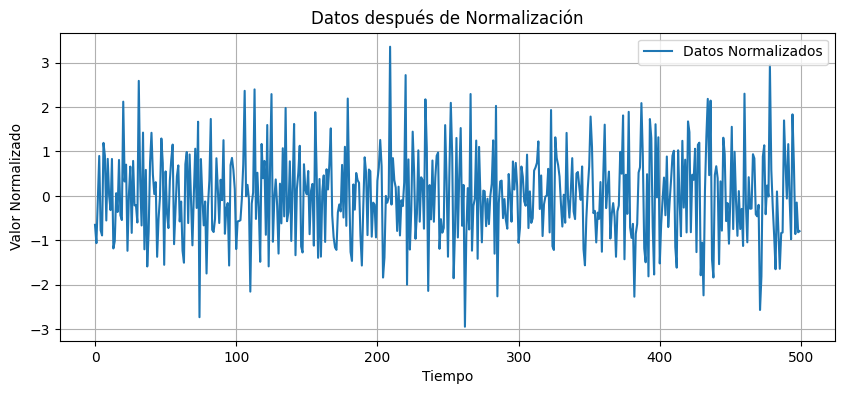


📦 Creando matriz de rezagos (lags=8, grado=3)
   Forma final de la matriz: (492, 25)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.022038


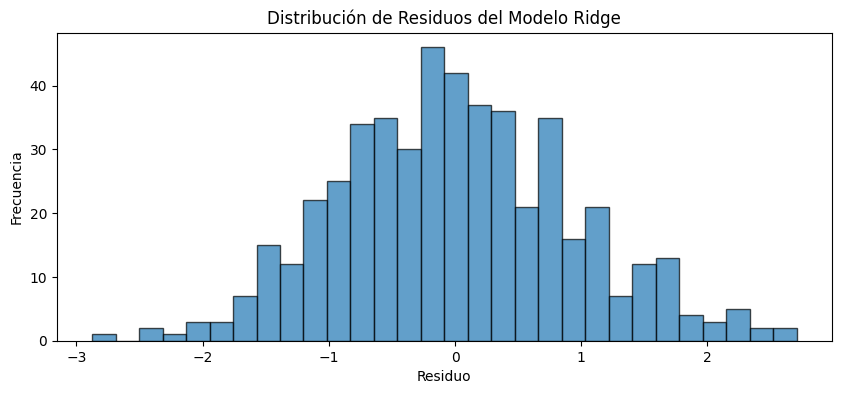


⚖️ Aplicando pesos exponenciales...


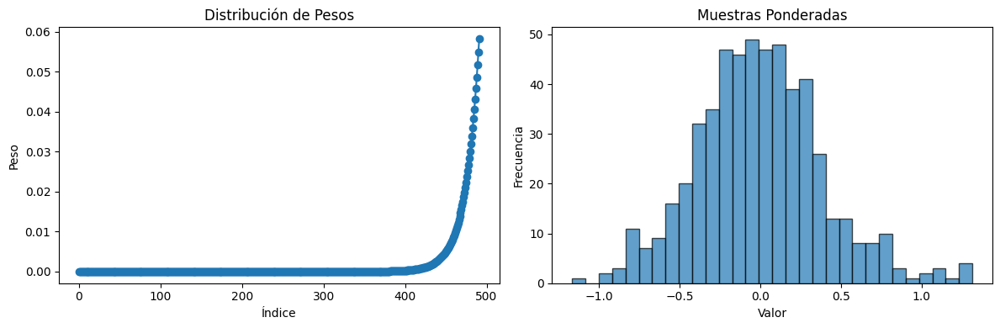

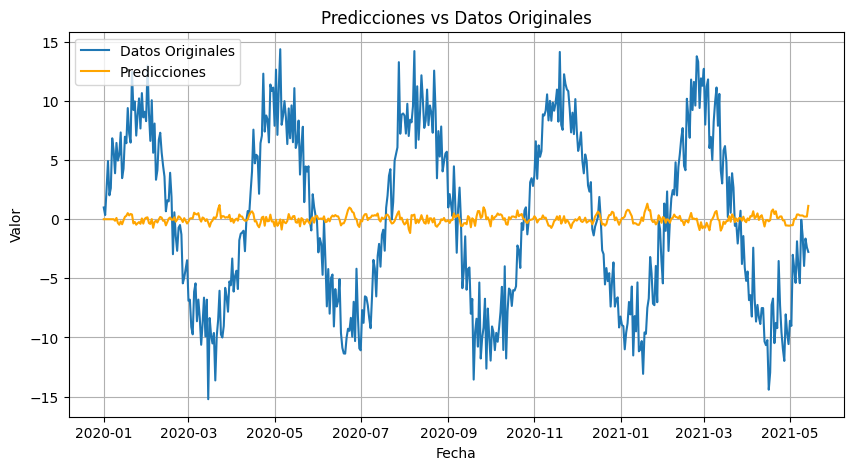

| 27        | -1.707    | 7.948     | 2.95      | 0.9418    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


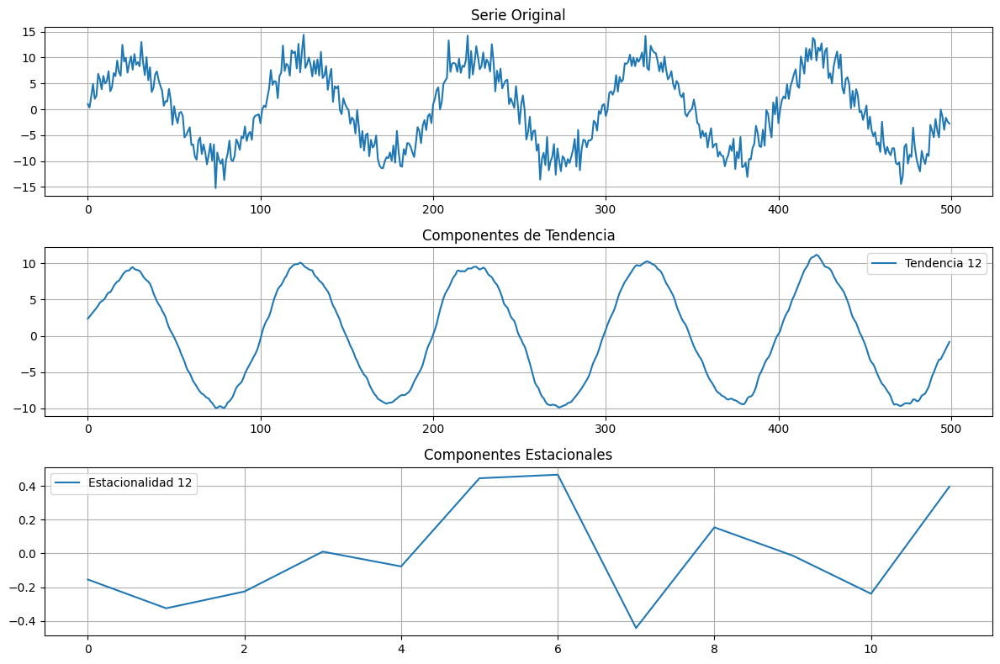

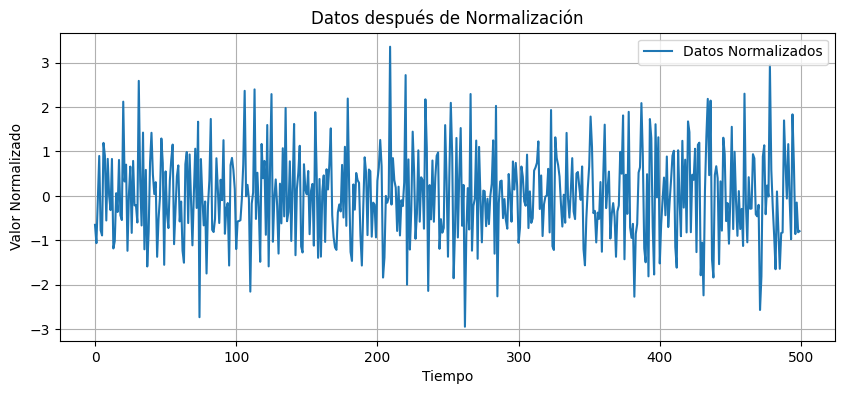


📦 Creando matriz de rezagos (lags=7, grado=2)
   Forma final de la matriz: (493, 15)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.039552


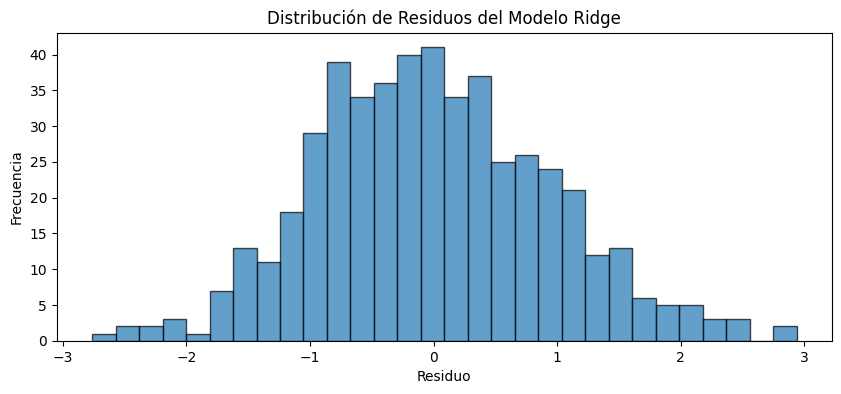


⚖️ Aplicando pesos exponenciales...


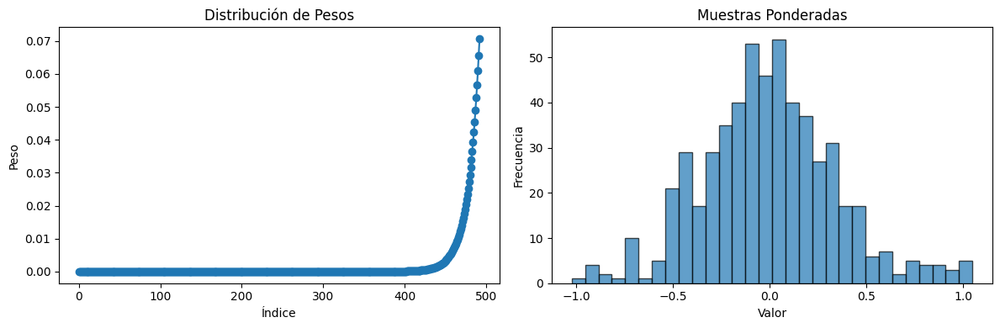

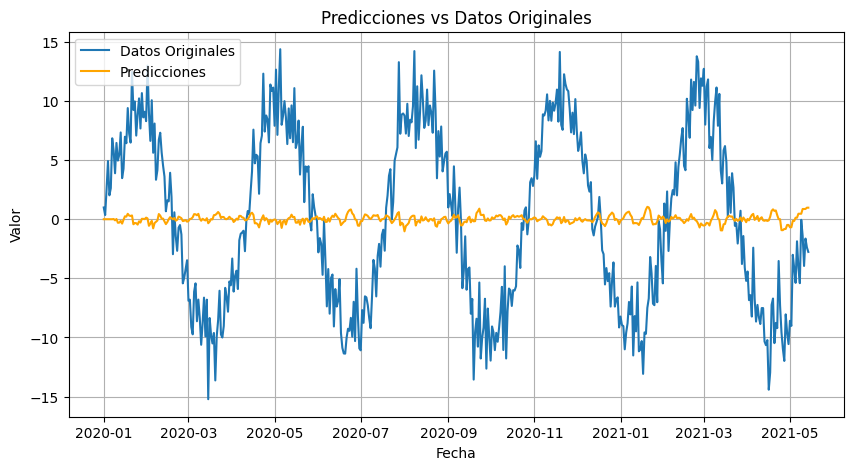

| 28        | -1.737    | 7.298     | 1.678     | 0.9293    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


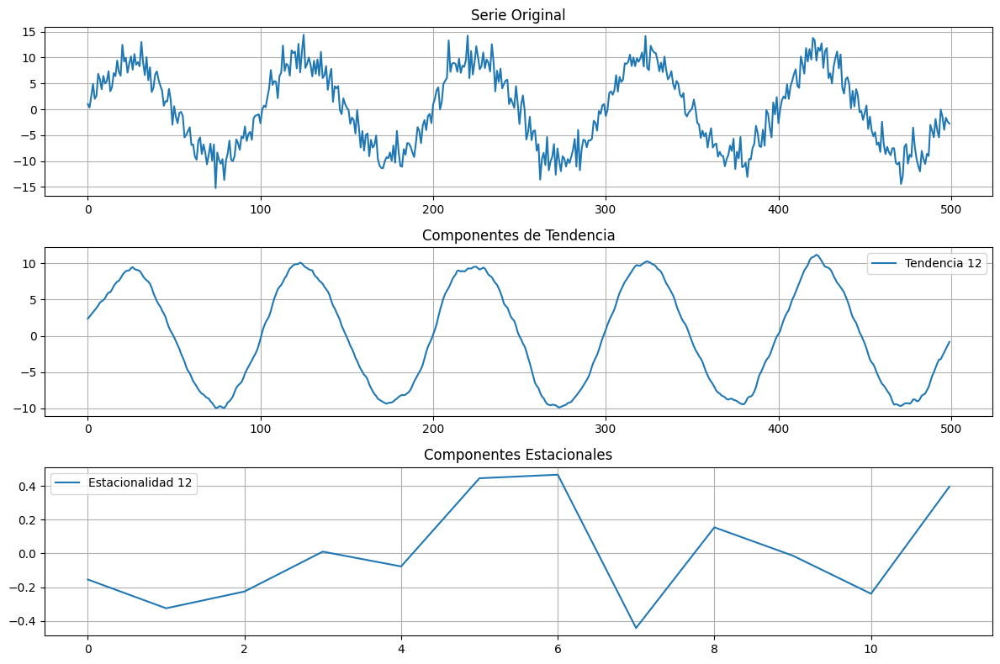

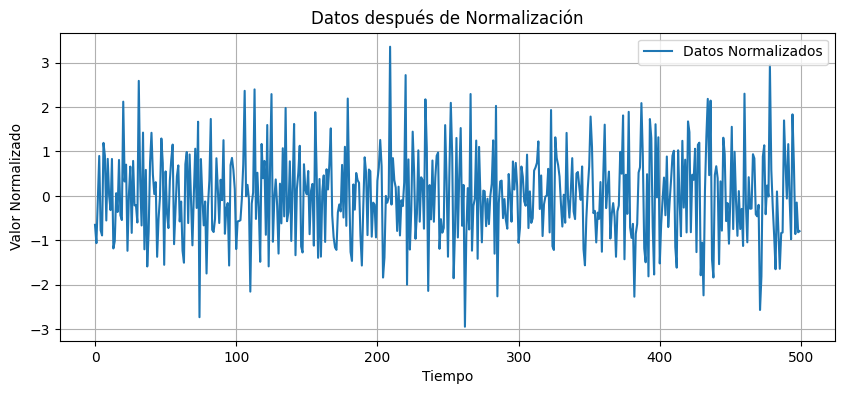


📦 Creando matriz de rezagos (lags=7, grado=2)
   Forma final de la matriz: (493, 15)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.039552


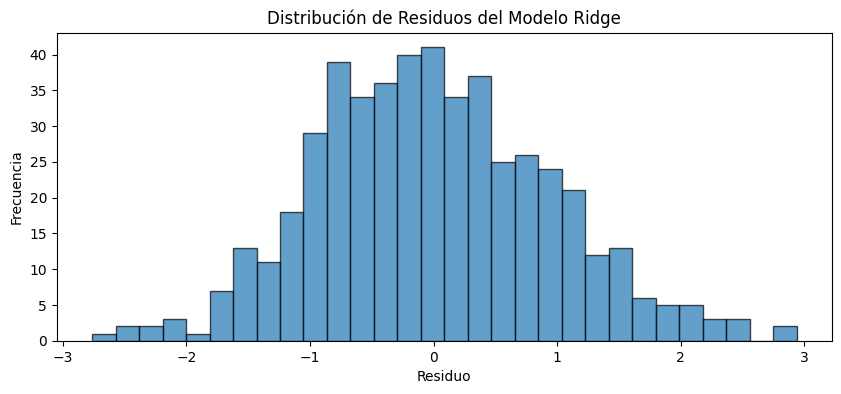


⚖️ Aplicando pesos exponenciales...


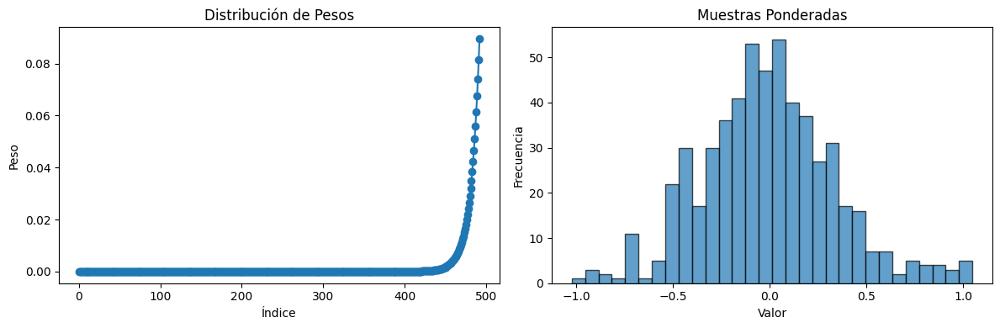

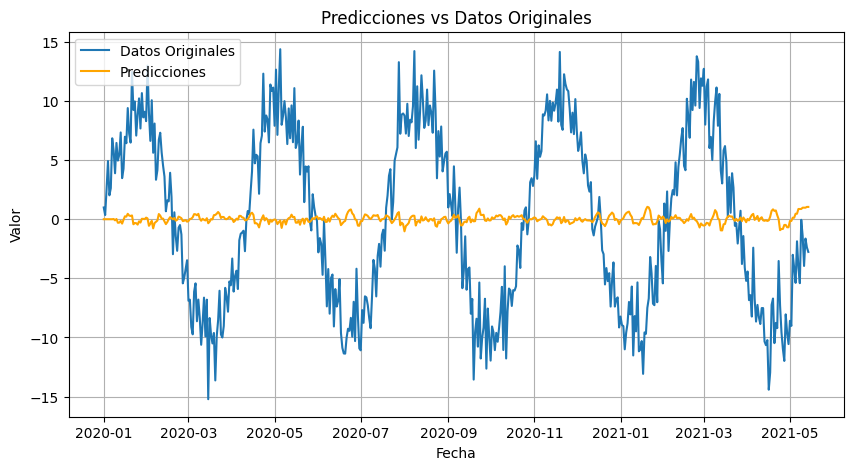

| 29        | -1.733    | 7.435     | 1.714     | 0.9104    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


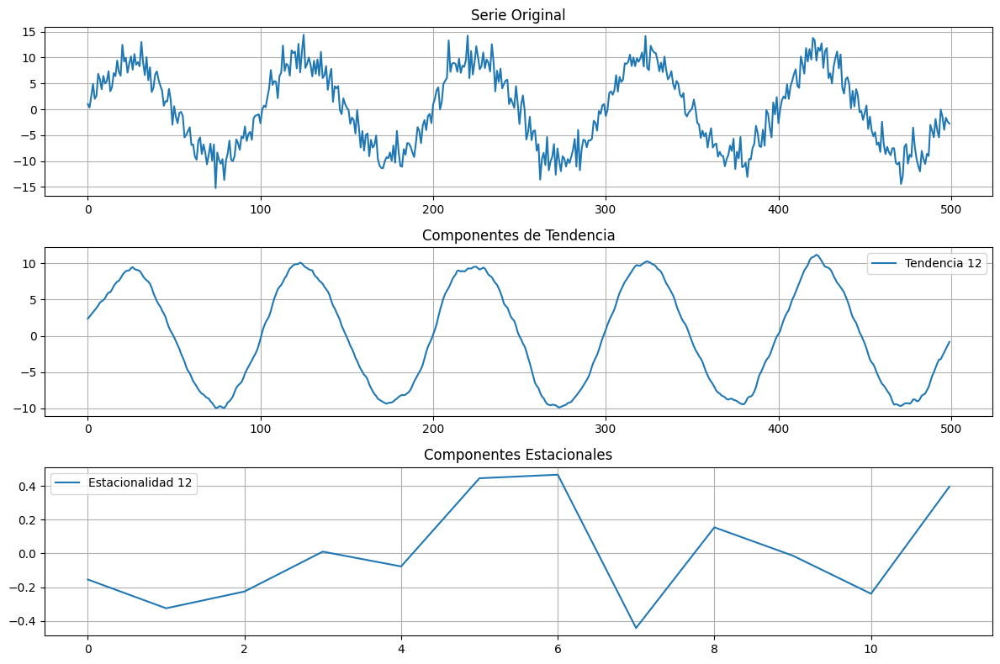

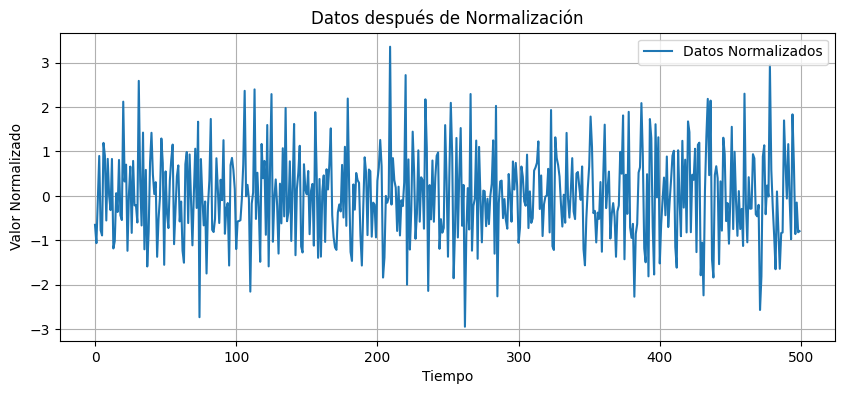


📦 Creando matriz de rezagos (lags=7, grado=3)
   Forma final de la matriz: (493, 22)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.022156


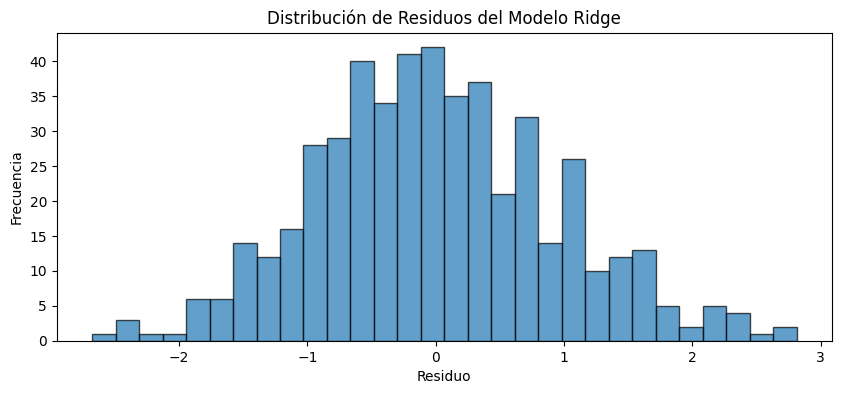


⚖️ Aplicando pesos exponenciales...


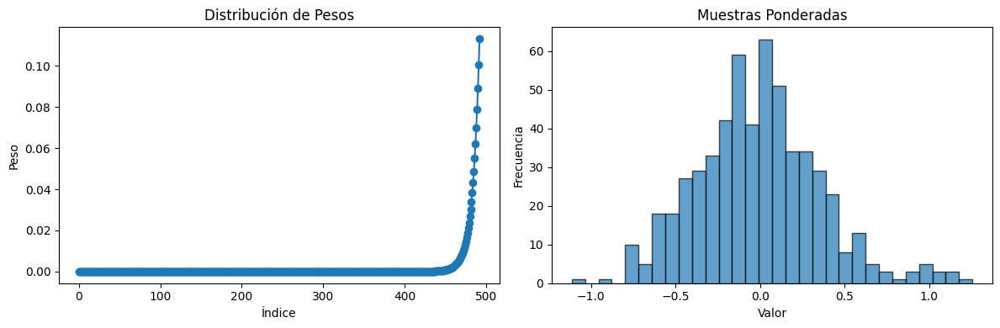

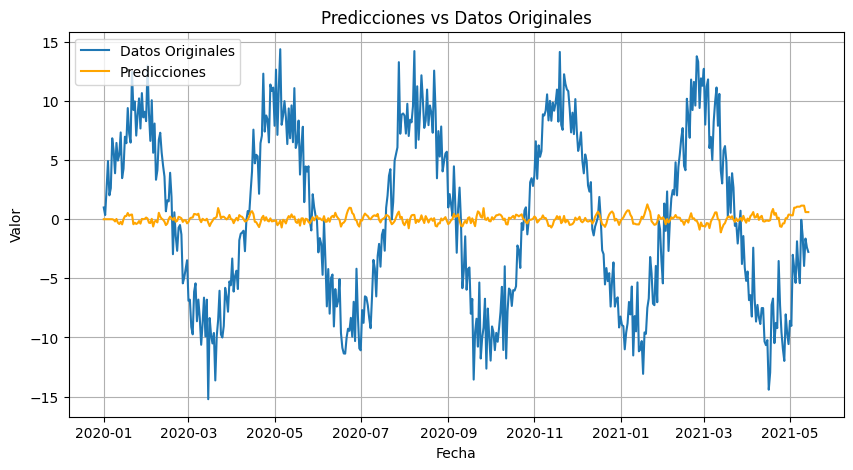

| 30        | -1.714    | 7.025     | 2.867     | 0.8868    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


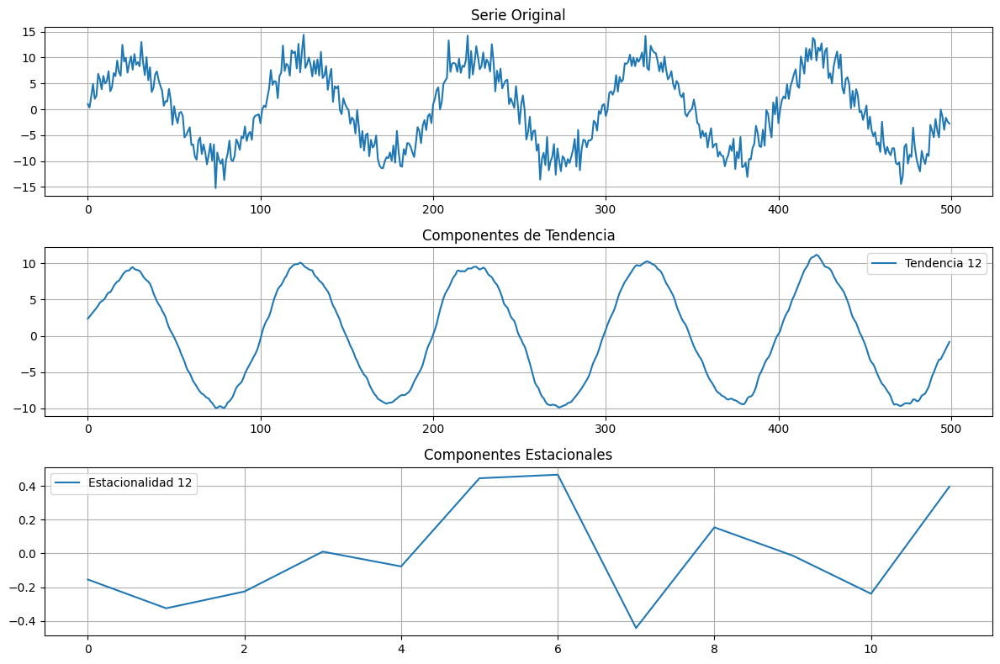

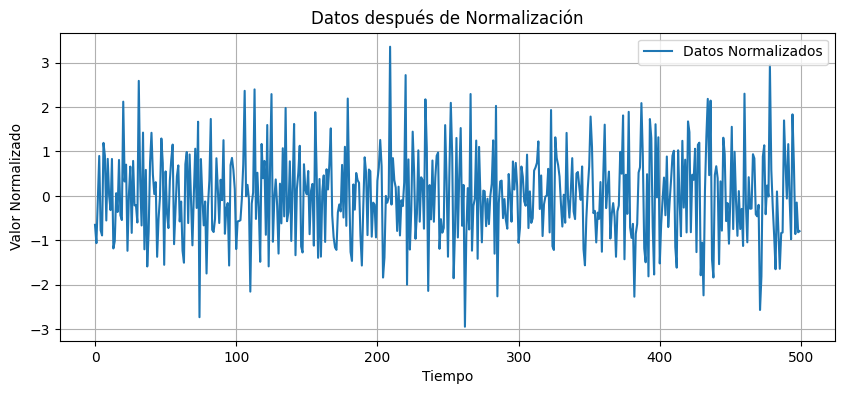


📦 Creando matriz de rezagos (lags=8, grado=3)
   Forma final de la matriz: (492, 25)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.022038


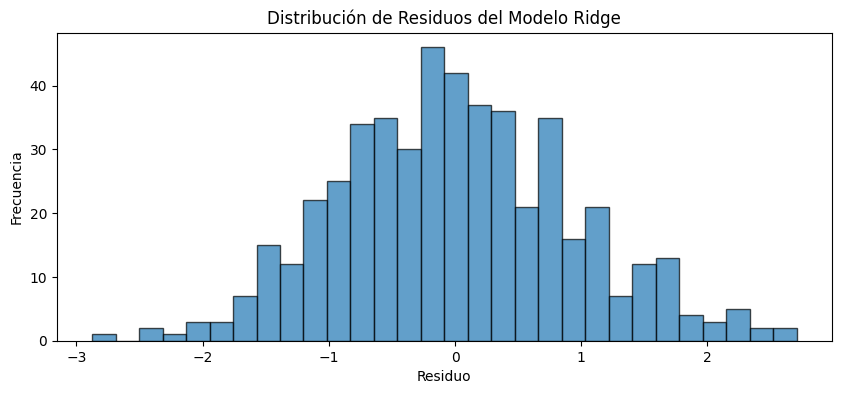


⚖️ Aplicando pesos exponenciales...


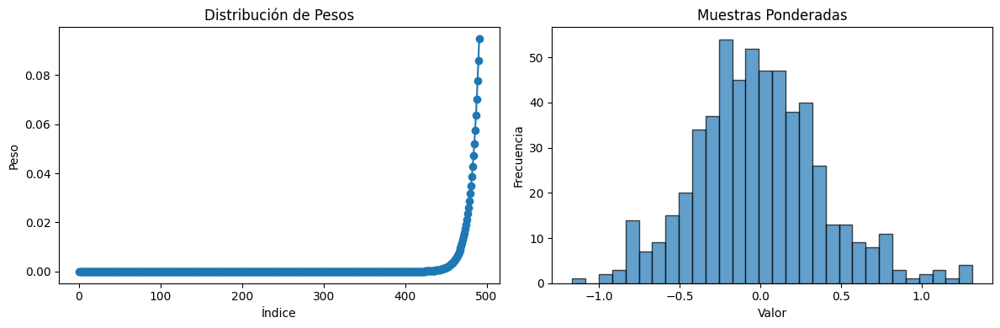

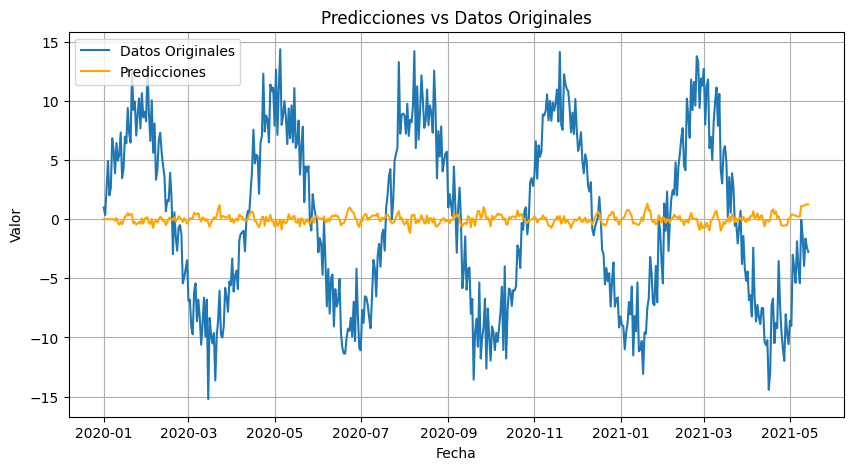

| 31        | -1.697    | 7.987     | 2.547     | 0.9053    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


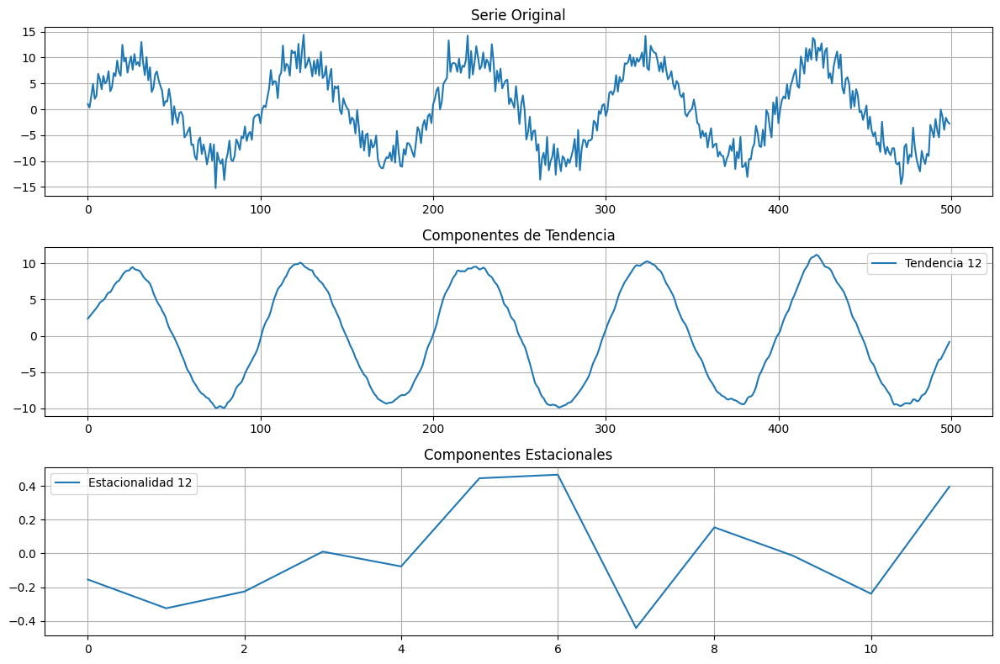

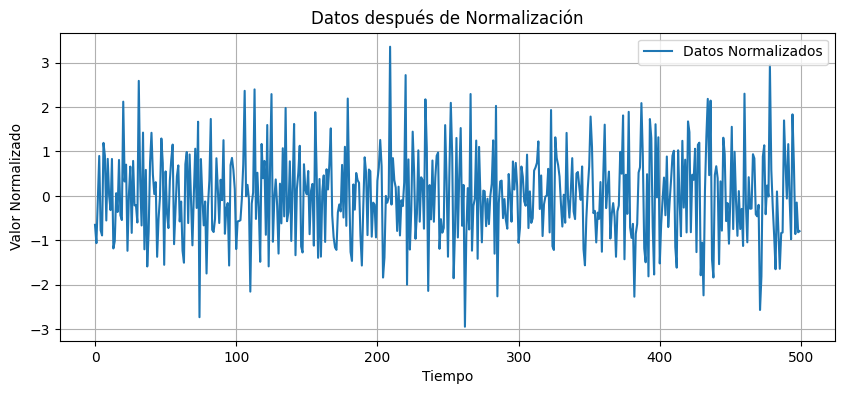


📦 Creando matriz de rezagos (lags=8, grado=2)
   Forma final de la matriz: (492, 17)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.039246


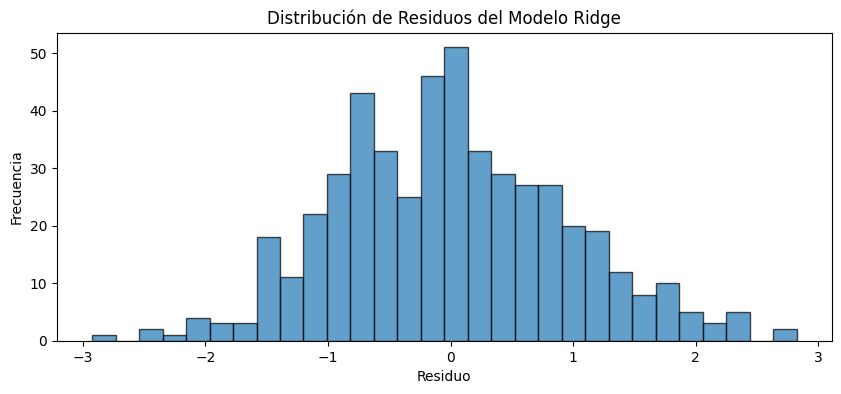


⚖️ Aplicando pesos exponenciales...


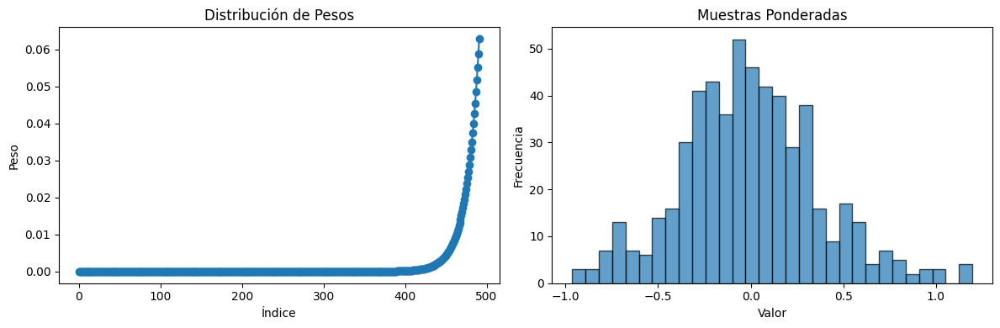

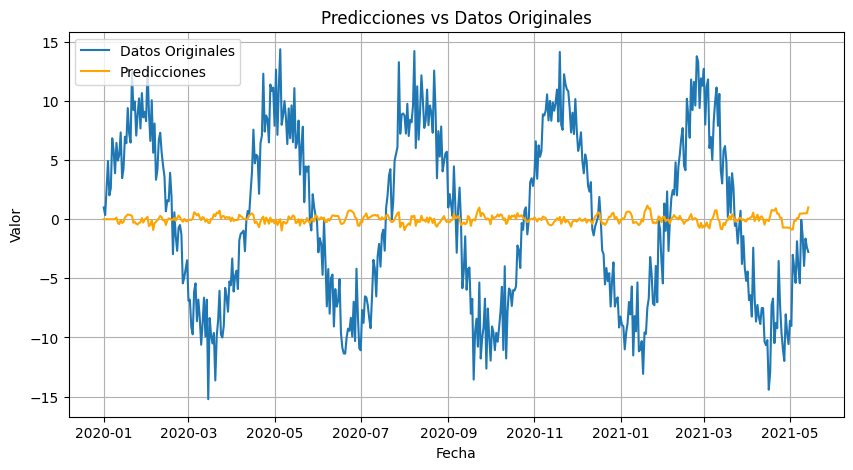

| 32        | -1.723    | 8.0       | 1.601     | 0.9372    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


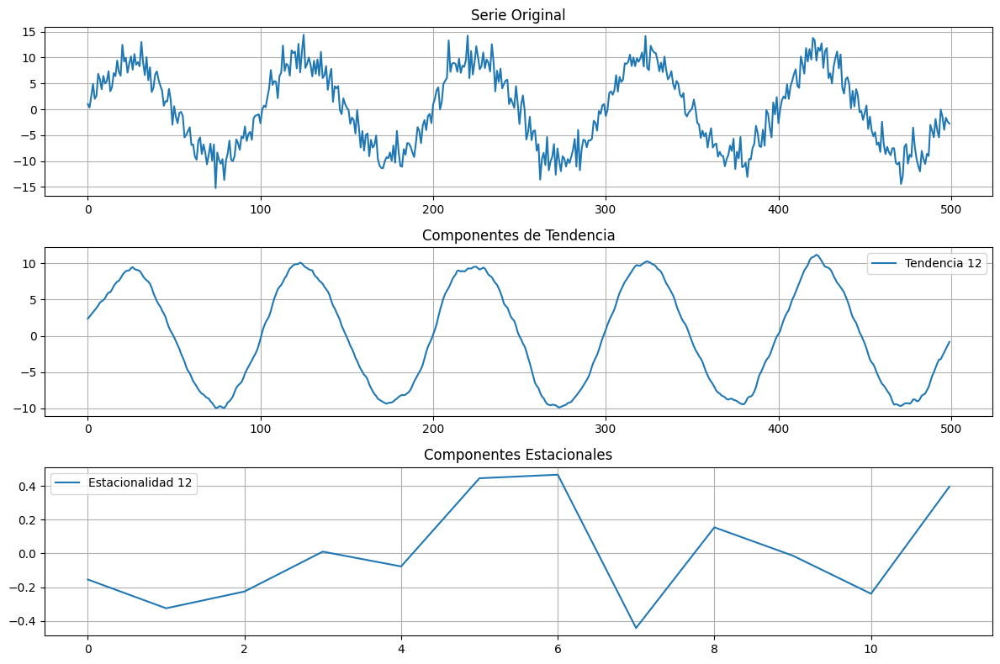

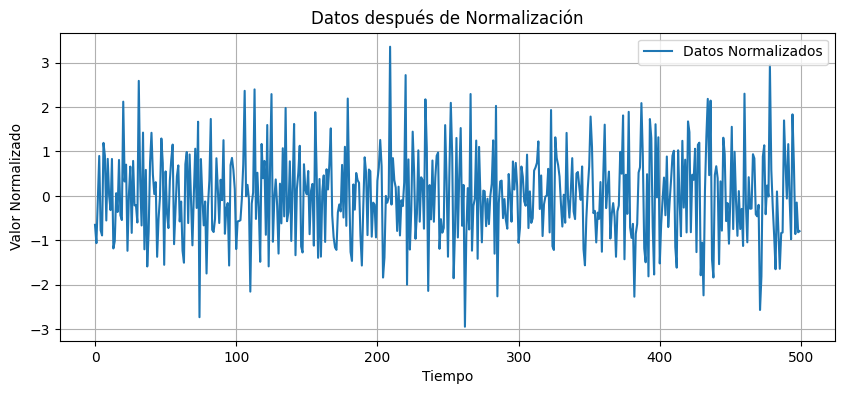


📦 Creando matriz de rezagos (lags=7, grado=2)
   Forma final de la matriz: (493, 15)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.039552


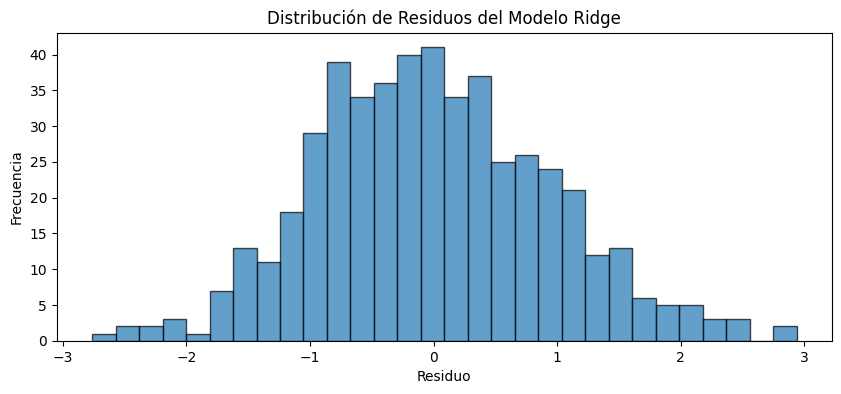


⚖️ Aplicando pesos exponenciales...


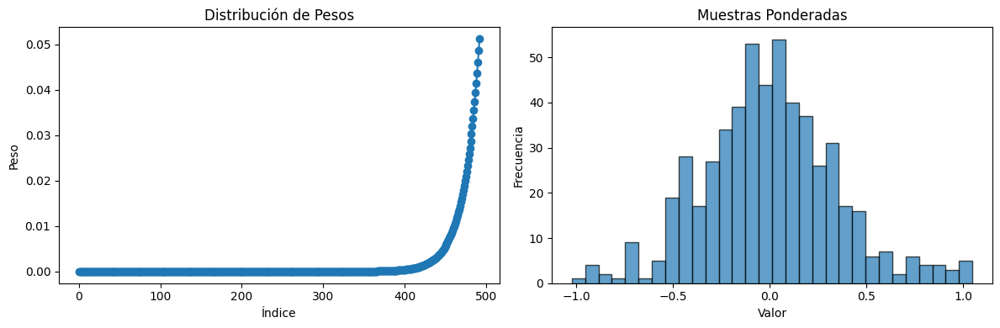

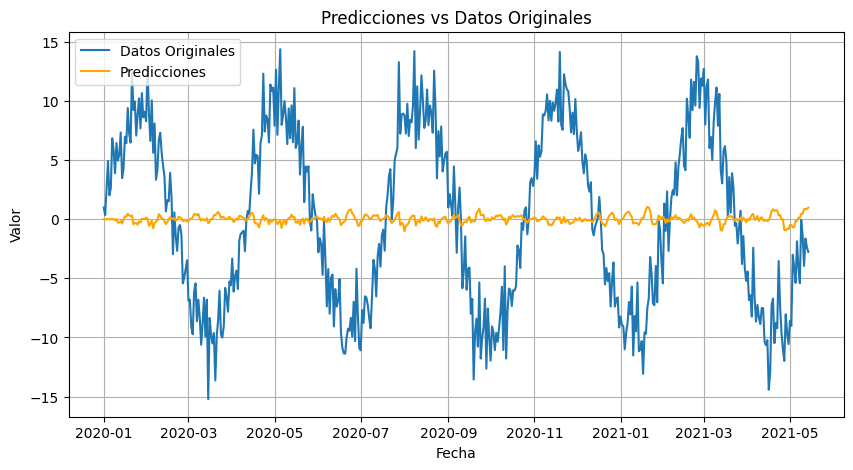

| 33        | -1.737    | 7.33      | 1.62      | 0.9488    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


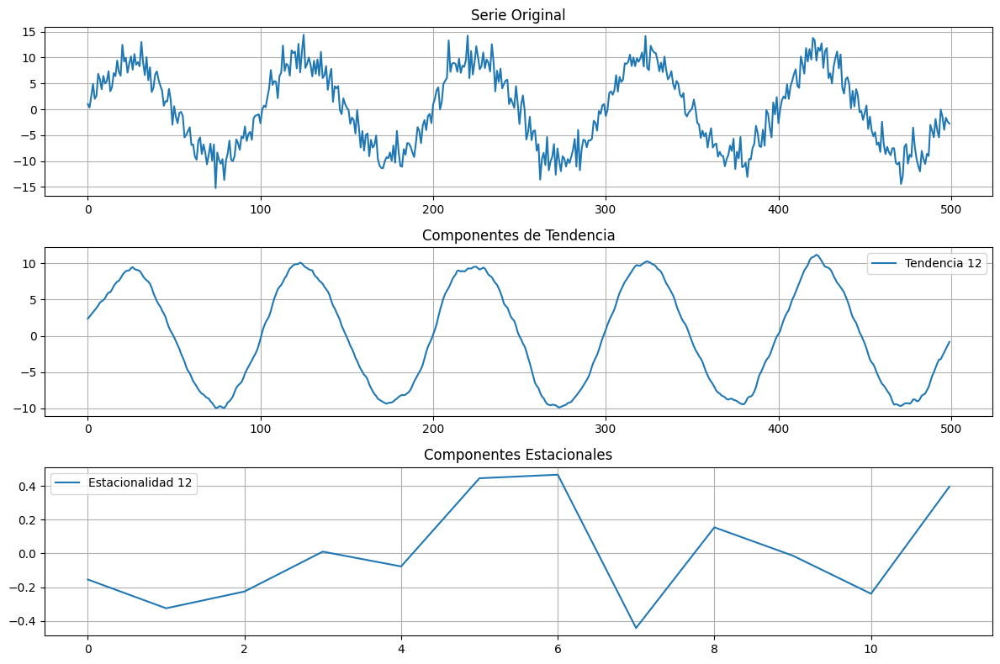

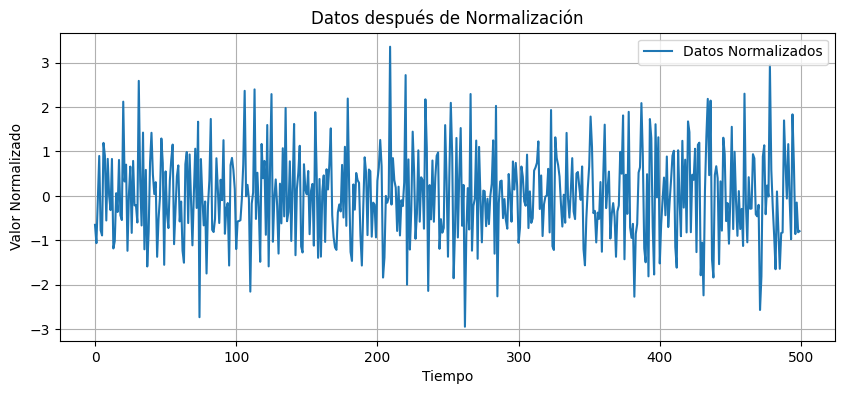


📦 Creando matriz de rezagos (lags=7, grado=2)
   Forma final de la matriz: (493, 15)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.039552


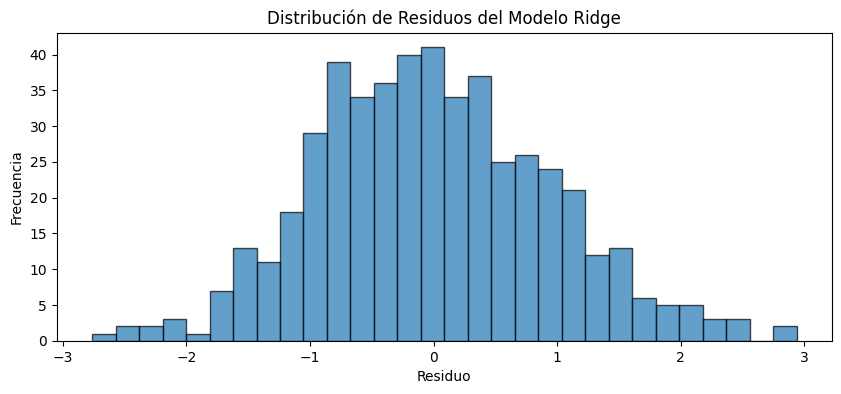


⚖️ Aplicando pesos exponenciales...


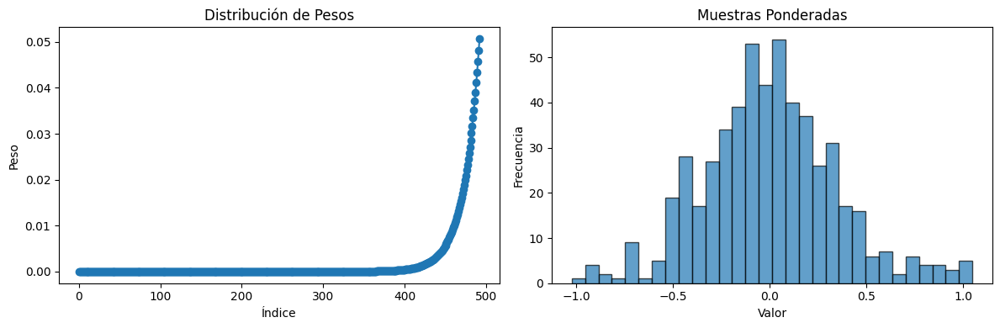

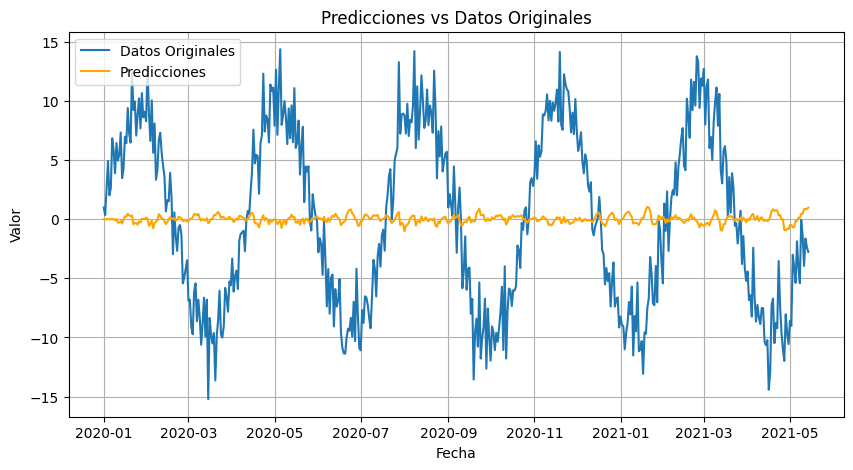

| 34        | -1.737    | 7.119     | 2.425     | 0.9493    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


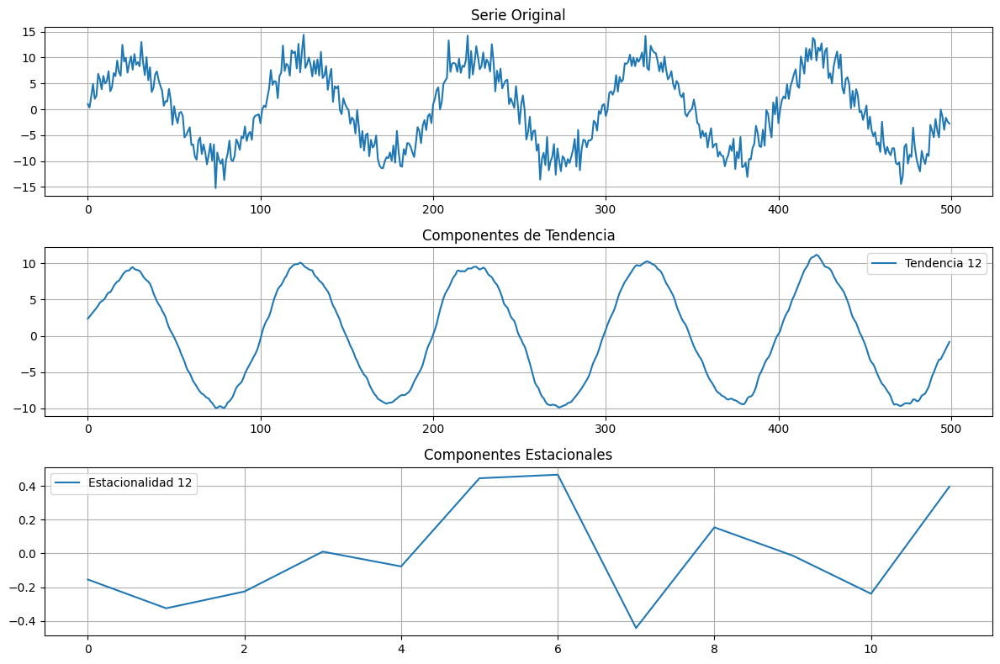

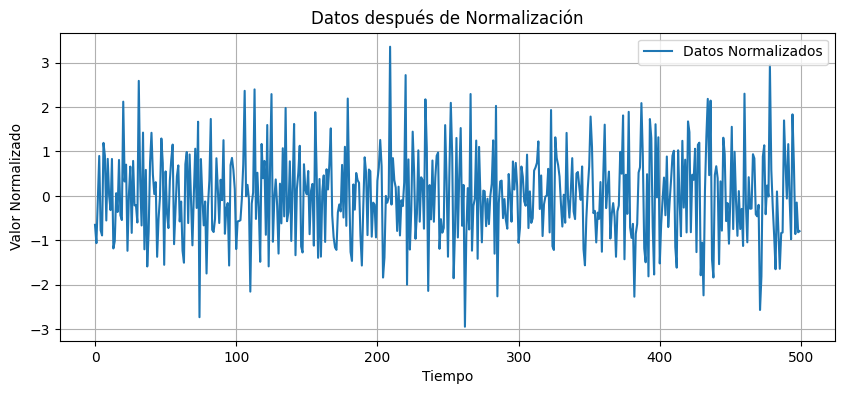


📦 Creando matriz de rezagos (lags=8, grado=3)
   Forma final de la matriz: (492, 25)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.022038


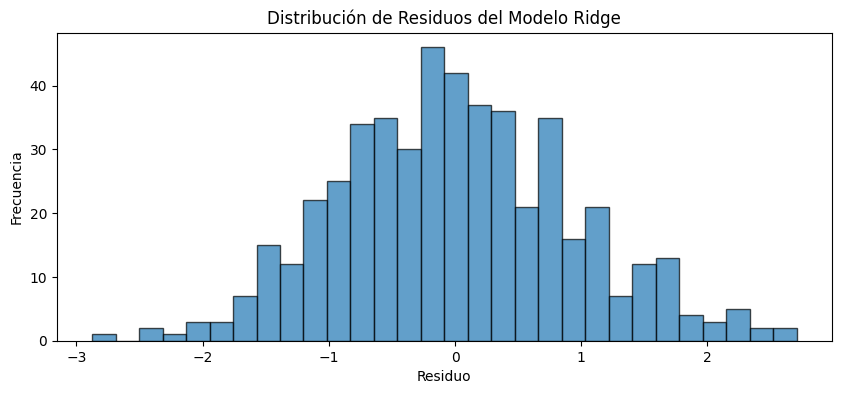


⚖️ Aplicando pesos exponenciales...


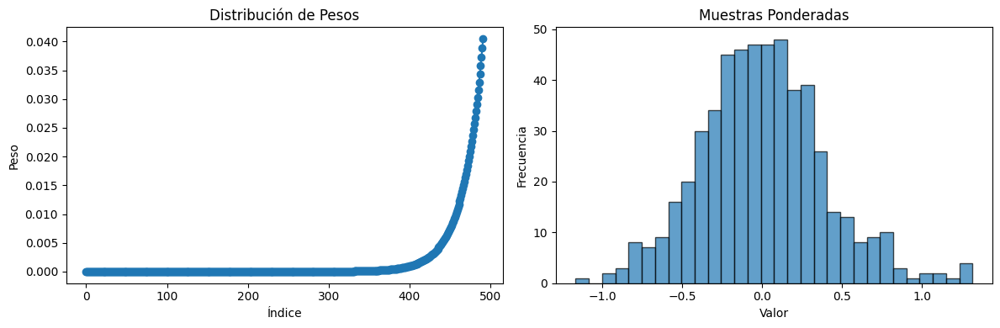

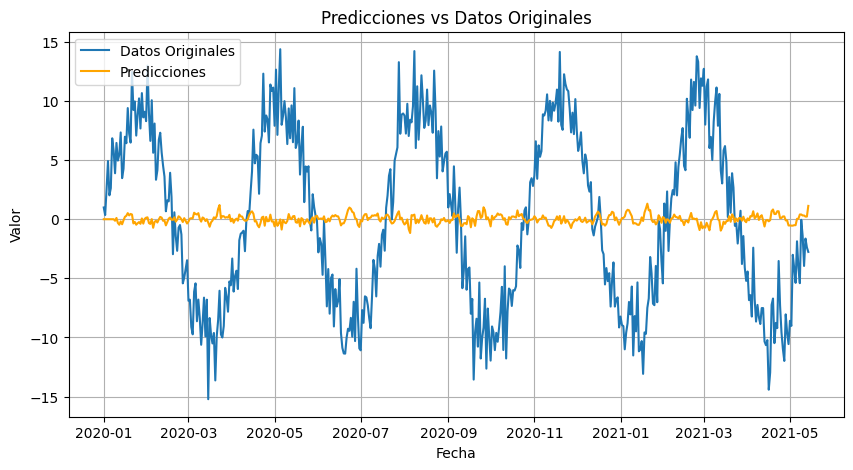

| 35        | -1.706    | 7.994     | 2.75      | 0.9595    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


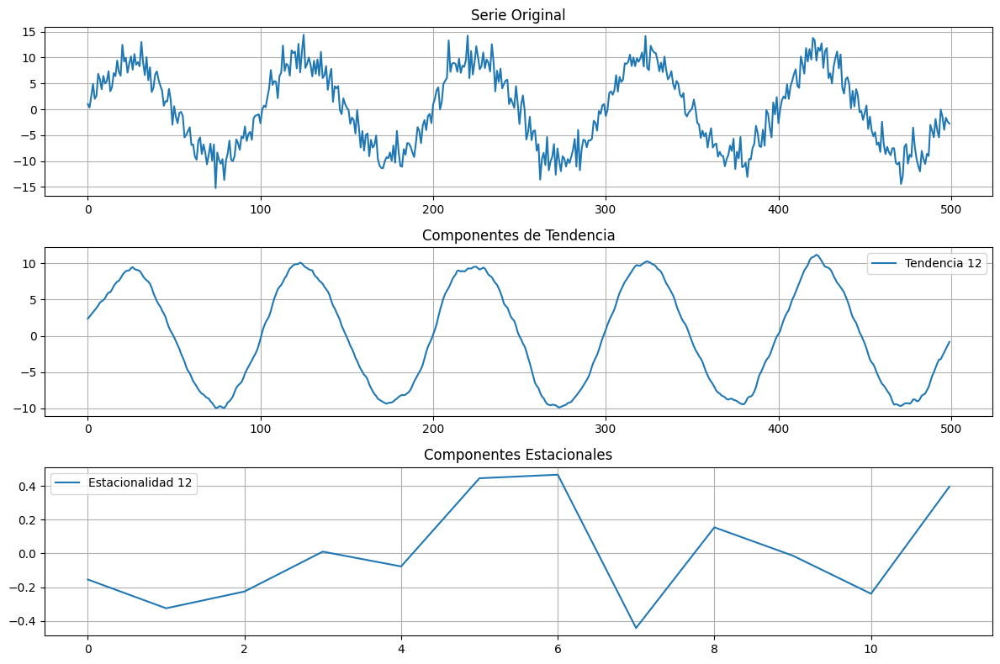

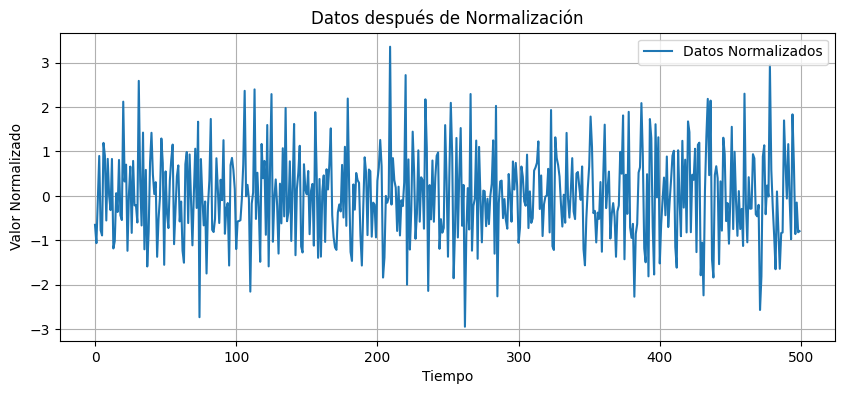


📦 Creando matriz de rezagos (lags=8, grado=2)
   Forma final de la matriz: (492, 17)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.039246


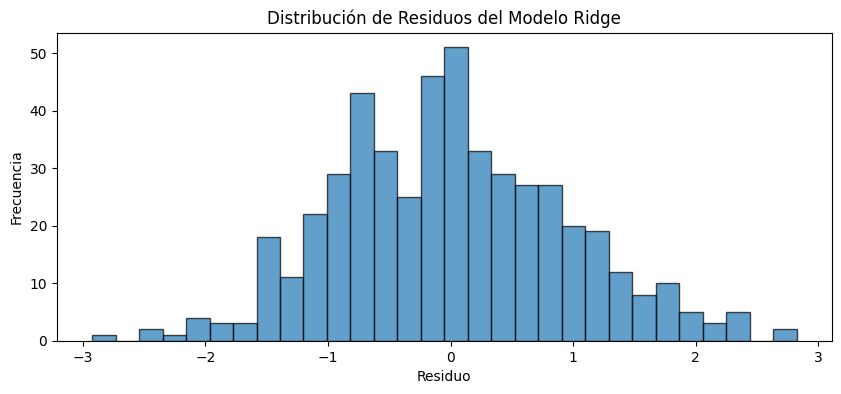


⚖️ Aplicando pesos exponenciales...


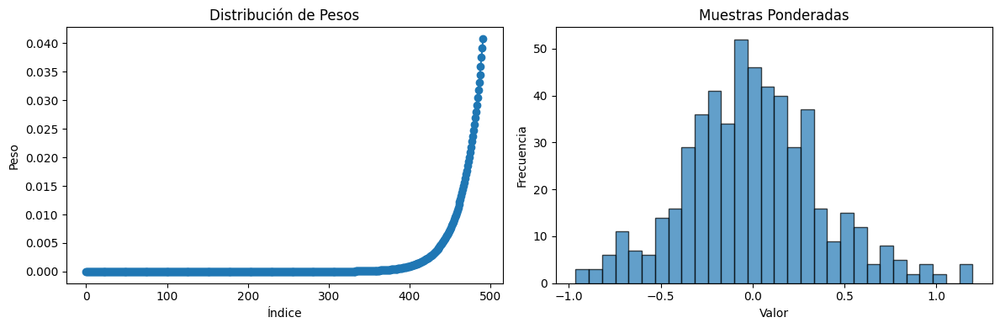

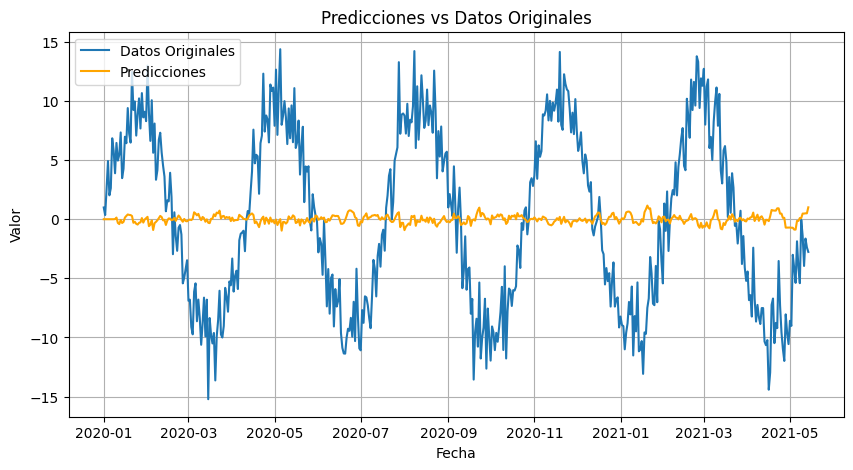

| 36        | -1.722    | 7.644     | 2.121     | 0.9592    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


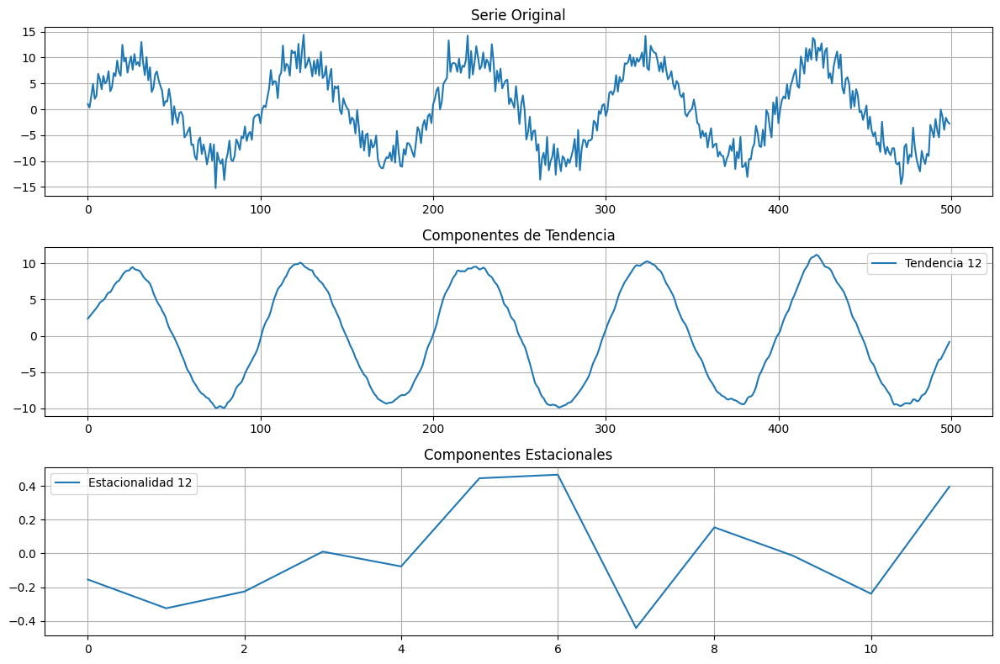

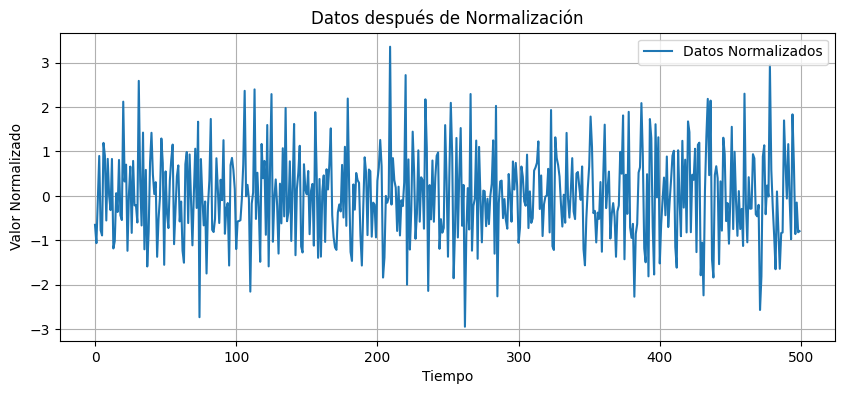


📦 Creando matriz de rezagos (lags=8, grado=2)
   Forma final de la matriz: (492, 17)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.039246


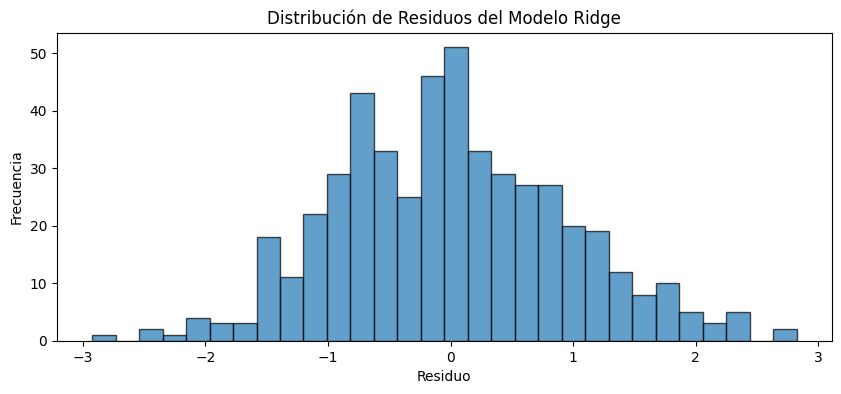


⚖️ Aplicando pesos exponenciales...


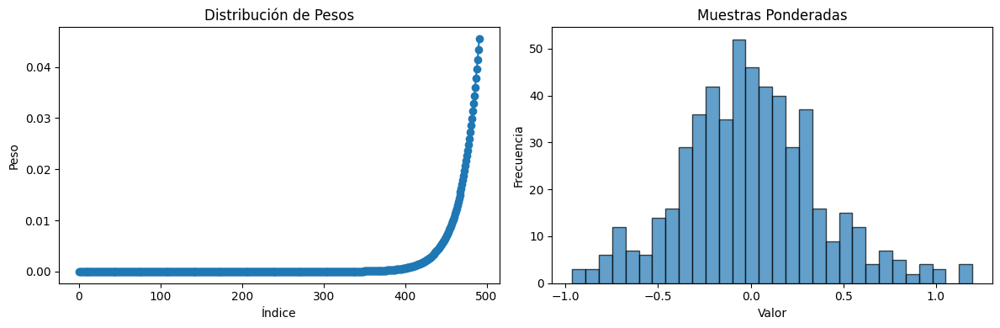

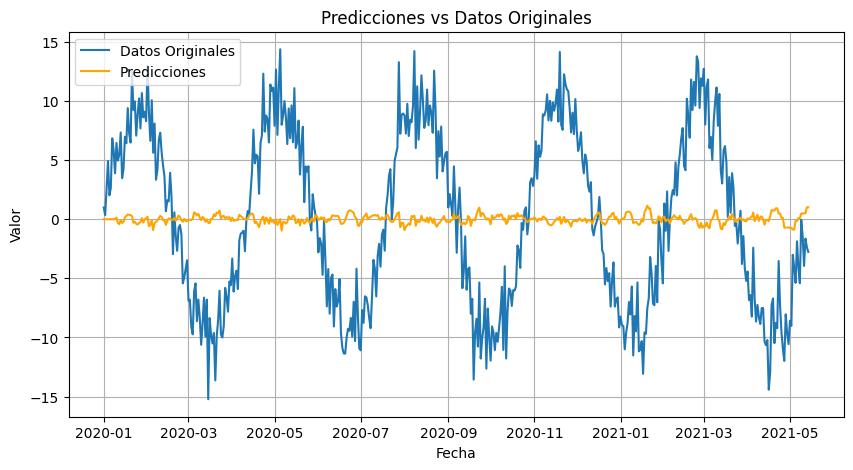

| 37        | -1.721    | 7.522     | 1.859     | 0.9545    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


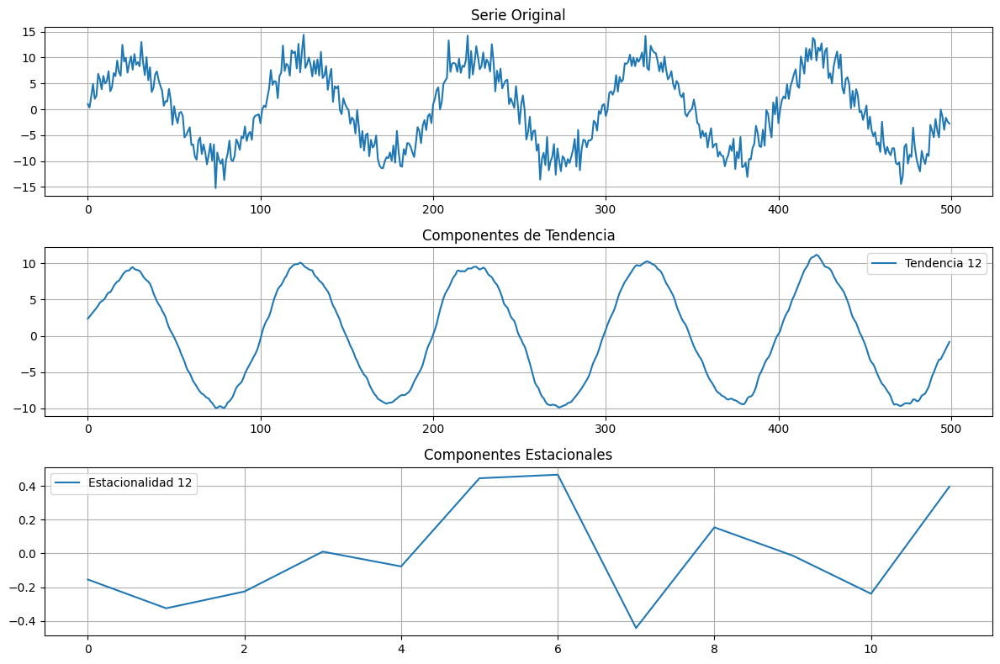

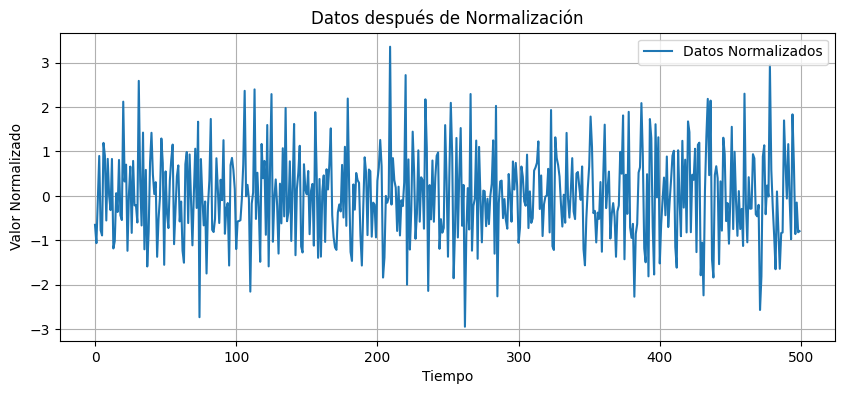


📦 Creando matriz de rezagos (lags=7, grado=3)
   Forma final de la matriz: (493, 22)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.022156


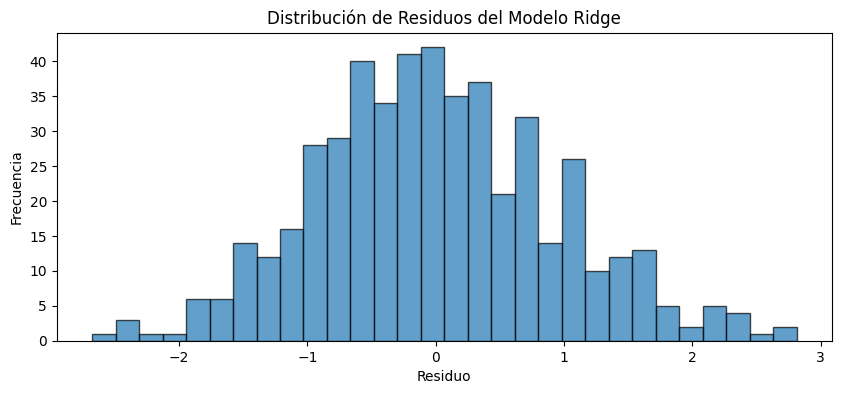


⚖️ Aplicando pesos exponenciales...


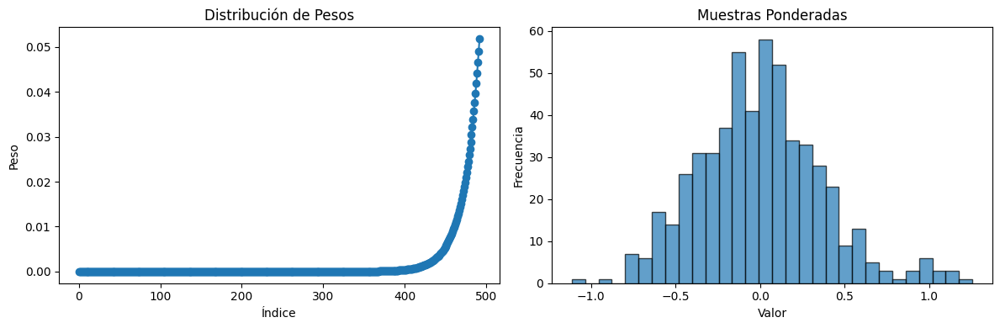

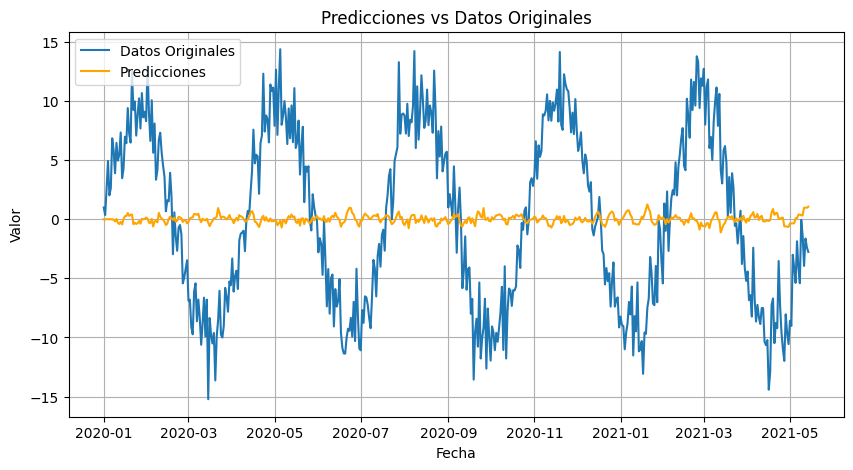

| 38        | -1.722    | 7.062     | 2.679     | 0.9482    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


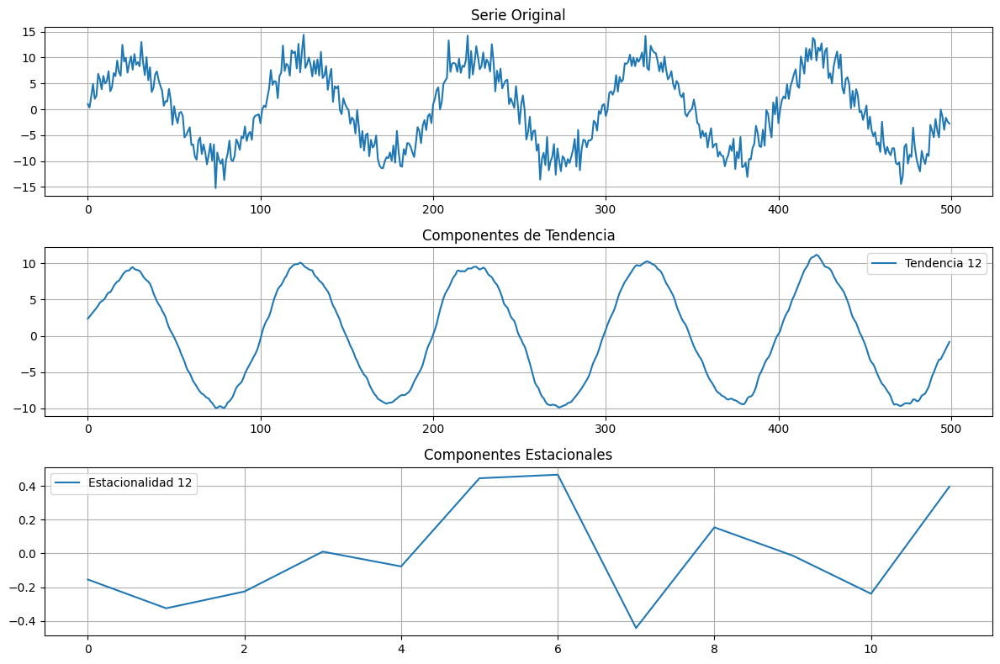

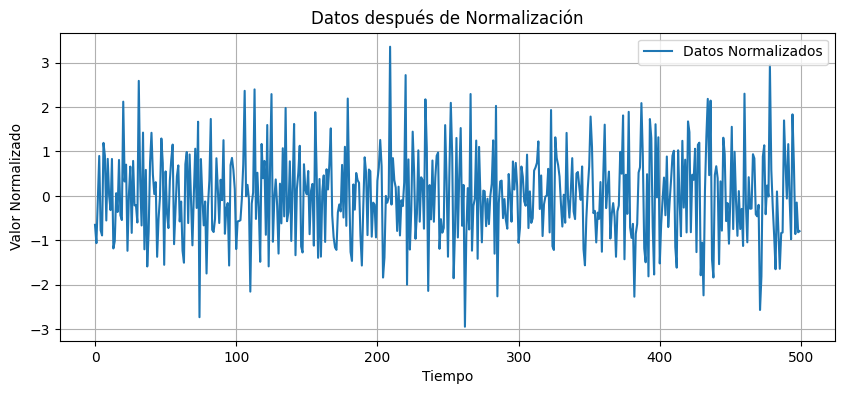


📦 Creando matriz de rezagos (lags=8, grado=3)
   Forma final de la matriz: (492, 25)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.022038


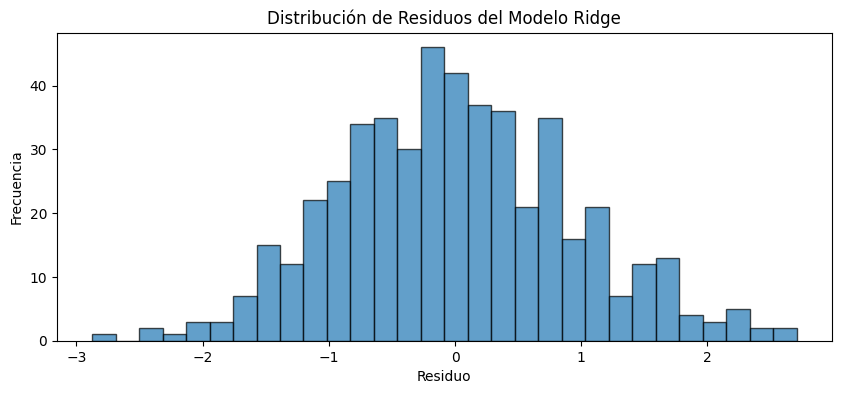


⚖️ Aplicando pesos exponenciales...


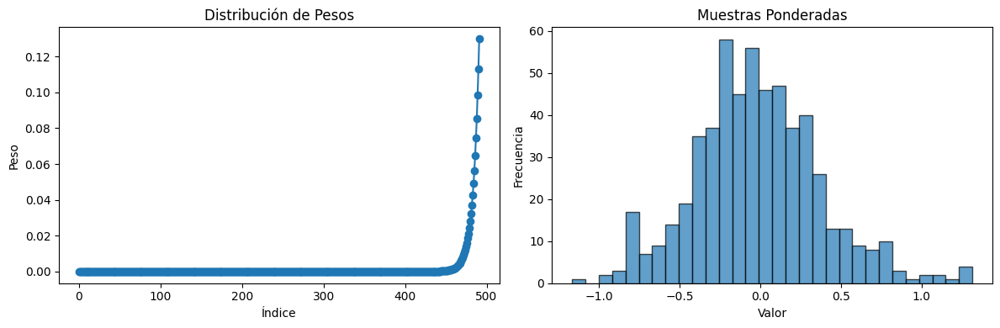

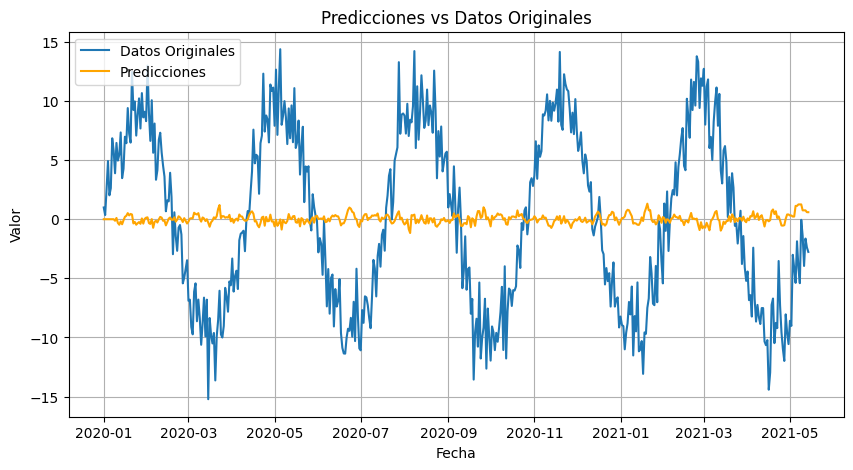

| 39        | -1.695    | 7.74      | 2.566     | 0.8701    |

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


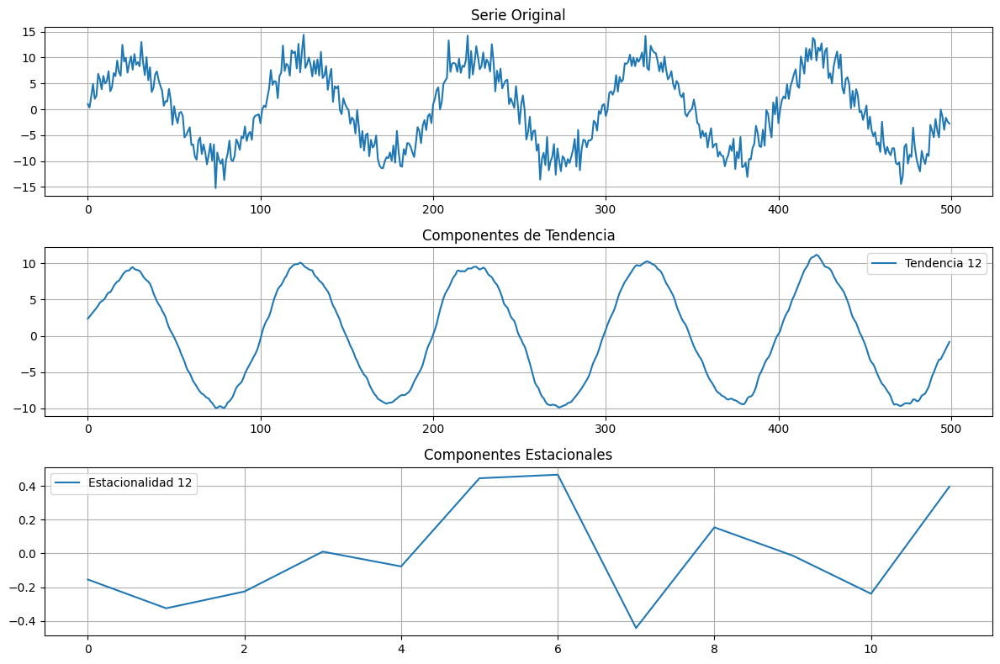

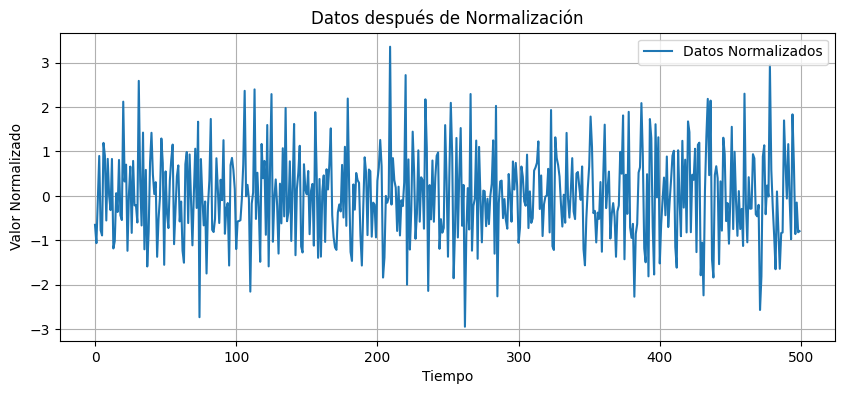


📦 Creando matriz de rezagos (lags=7, grado=3)
   Forma final de la matriz: (493, 22)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.022156


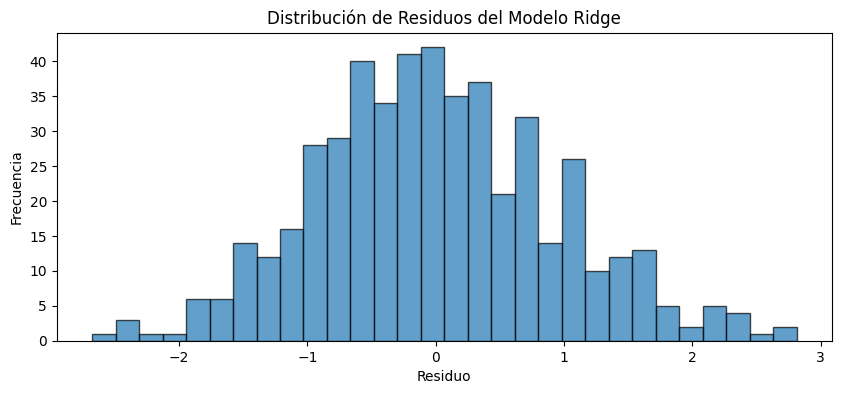


⚖️ Aplicando pesos exponenciales...


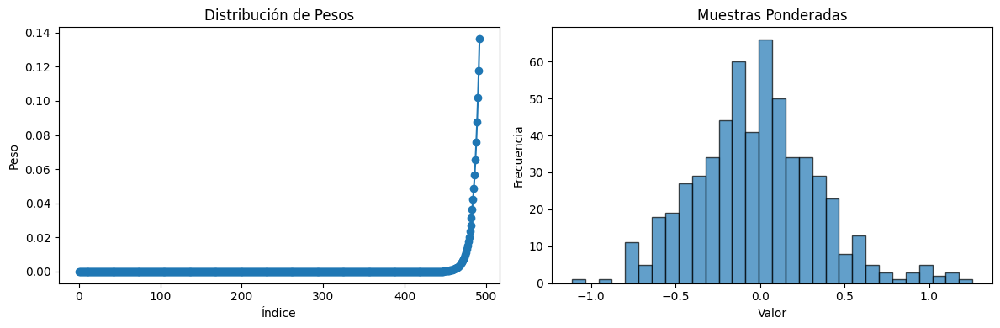

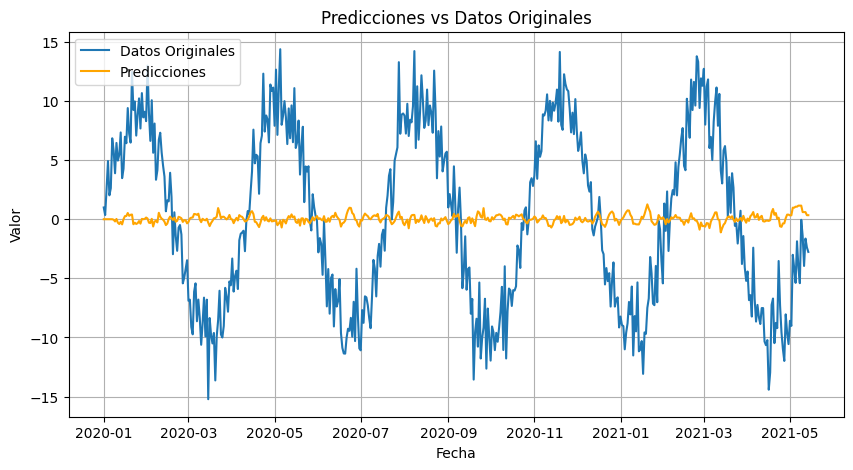

| 40        | -1.715    | 7.374     | 2.783     | 0.8637    |


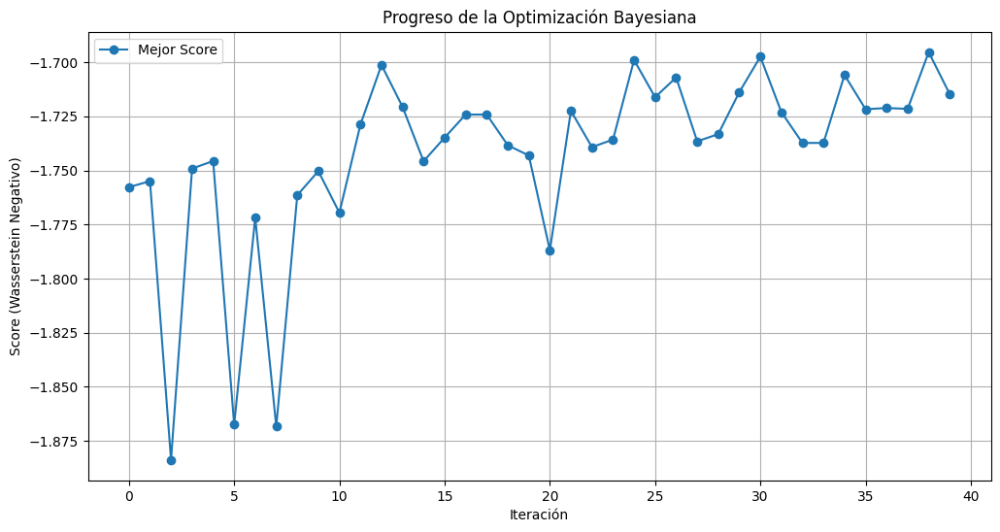


✅ Optimización exitosa:
   • Lags: 8
   • Rho: 0.870
   • Grado polinomial: 3
   • Distancia de Wasserstein: 1.6953

🔮 Generando predic ciones...

🧹 Preparando datos...

🔧 Descomponiendo serie temporal...


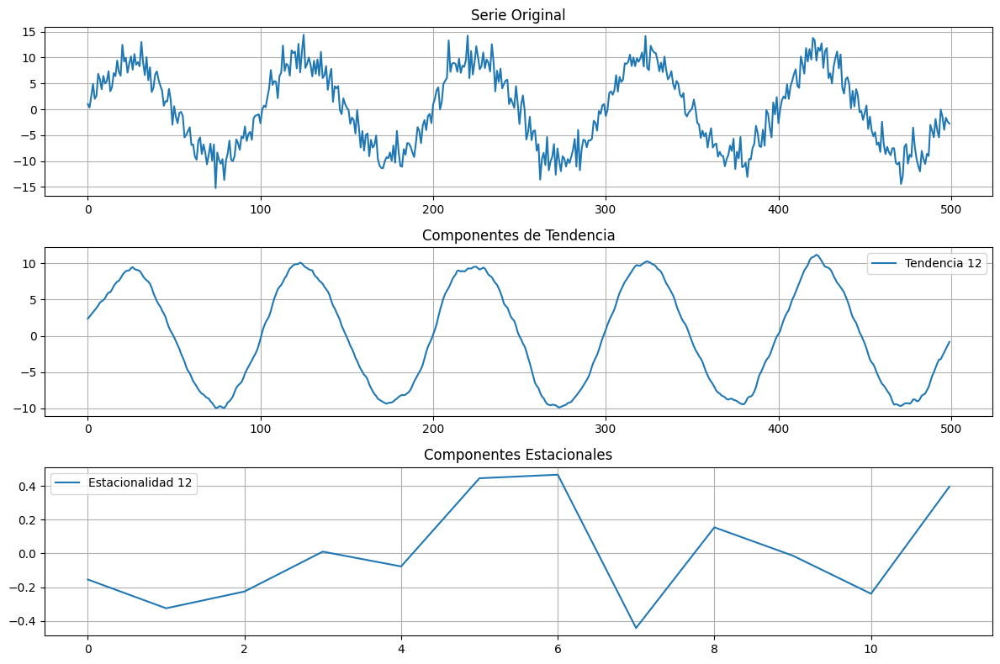

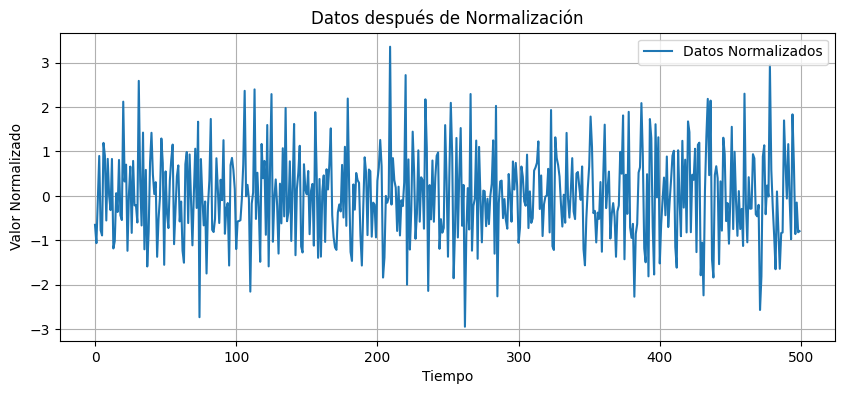


📦 Creando matriz de rezagos (lags=8, grado=3)
   Forma final de la matriz: (492, 25)

🧮 Calculando valores C...

🔍 Calculando regularización adaptativa...
   Regularización adaptativa: 0.022038


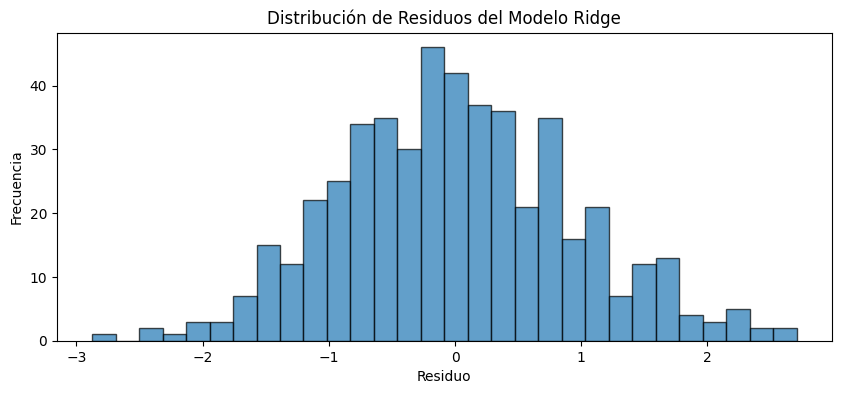


⚖️ Aplicando pesos exponenciales...


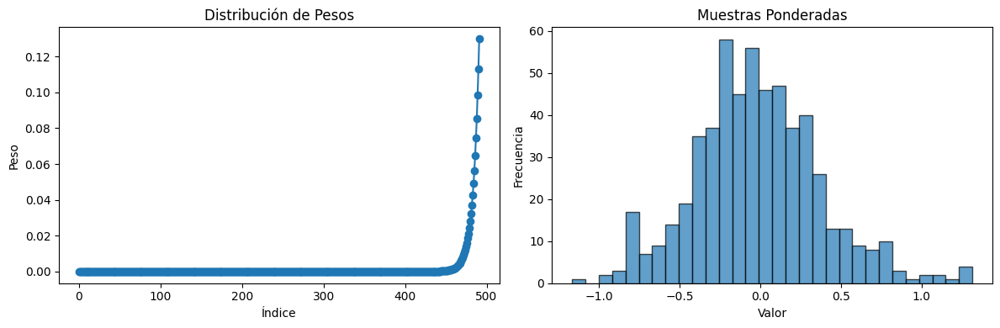

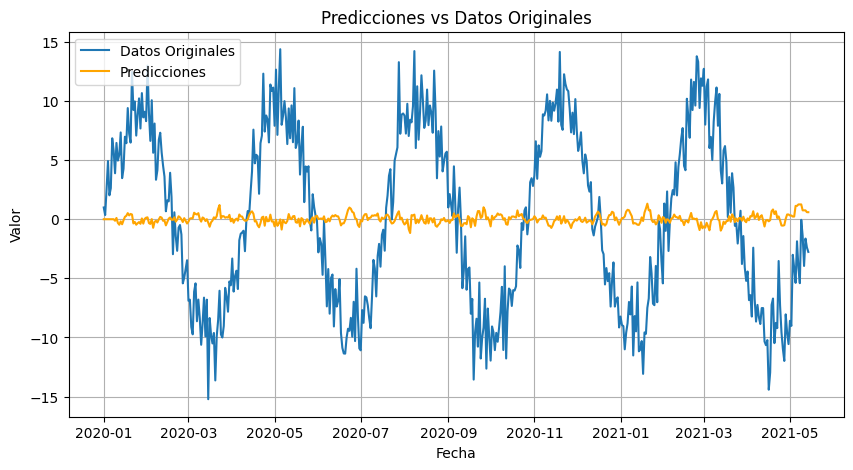

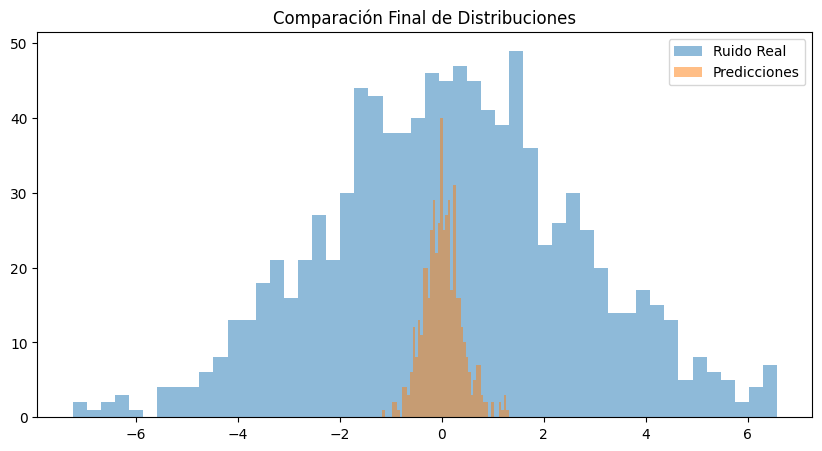

In [14]:
# Ejemplo de uso
# Generar datos sintéticos
np.random.seed(42)
dates = pd.date_range(start='2020-01-01', periods=500)
data = 10 * np.sin(np.linspace(0, 10*np.pi, 500)) + np.random.normal(0, 2, 500)
df = pd.DataFrame({'fecha': dates, 'valor': data})

# Ruido real simulado
real_noise = np.random.normal(0, 2.5, 1000)

# Instanciar y ejecutar modelo
model = CPnewModel()
model.optimize_hyperparameters(df, real_noise)
predictions = model.fit_predict(df)

# Visualización final comparativa
plt.figure(figsize=(10, 5))
plt.hist(real_noise, bins=50, alpha=0.5, label='Ruido Real')
plt.hist(predictions, bins=50, alpha=0.5, label='Predicciones')
plt.title("Comparación Final de Distribuciones")
plt.legend()
plt.show()

Forma de la matriz de diseño: (147, 7)


array([[ 1.        , -1.56945905,  2.46320172, ...,  0.39875451,
         1.40447113,  1.97253915],
       [ 1.        , -0.63147011,  0.39875451, ...,  1.97253915,
        -0.57452661,  0.33008083],
       [ 1.        ,  1.40447113,  1.97253915, ...,  0.33008083,
         1.61353813,  2.60350529],
       ...,
       [ 1.        , -1.23278435,  1.51975726, ...,  4.33828486,
        -1.62998263,  2.65684337],
       [ 1.        , -2.08285498,  4.33828486, ...,  2.65684337,
        -1.18264024,  1.39863793],
       [ 1.        , -1.62998263,  2.65684337, ...,  1.39863793,
         0.14968077,  0.02240433]])

Alpha calculado: 0.1082
Prediciones del modelo


array([ 9.75203401e-02,  1.55928162e-01, -5.45439109e-01, -8.96596209e-02,
       -1.13153321e+00, -1.85864320e-01, -2.97902086e-01, -6.47642239e-01,
        2.60168333e-01, -1.29367100e-01,  4.72824494e-01,  5.83220776e-01,
        5.11728168e-01, -2.72902438e-03, -1.19526732e-01, -4.05604086e-01,
        1.52889615e-01, -9.78653210e-02,  4.68447851e-01,  4.01600703e-01,
       -5.90519412e-01, -1.17738947e-01, -2.89715886e-01,  2.03585073e-01,
        4.44217396e-01, -9.50734471e-02, -1.66069454e-01, -3.93084991e-01,
       -7.47417576e-01, -4.25079888e-01,  7.25461236e-01,  4.99823367e-01,
       -1.76191997e-01, -6.56194570e-01, -1.69989017e-01, -1.55073606e-02,
        6.88091237e-01,  9.27069482e-01,  1.22353062e-01, -7.88479777e-02,
       -3.01871258e-01,  1.03828420e-01,  2.21077861e-02,  9.80993544e-02,
       -1.05911432e+00,  5.16422674e-03, -1.40266617e+00, -1.33276255e-01,
        7.31264353e-01,  5.28944671e-01,  1.30820959e-01, -1.93678193e-01,
        2.09318766e-01,  

Residuos del modelo Ridge:


array([-0.67204695,  1.45760996,  1.21685593,  2.59281817,  1.22356931,
       -0.80879046,  2.90368843, -1.33281267,  0.27599616, -2.1063797 ,
       -2.02528479,  0.52540017,  0.55957998, -1.0213813 ,  1.75979115,
        0.33004489, -1.83747068, -0.21340348, -0.29417634,  1.83729248,
        0.77352416, -2.19939668,  1.61113259, -0.58128926, -0.57500095,
        1.38968207,  1.59429064,  2.03761025, -2.66451247, -0.23618023,
        0.48462423,  0.58385696,  1.6614515 ,  0.08294097, -1.98189372,
       -2.5846423 , -0.05939996,  0.45155372, -0.70319423,  0.97410084,
        0.23654177, -0.92849038,  0.57122787,  3.15285227,  0.16959763,
        2.84497253, -2.63078131, -0.46939603,  0.68528515, -0.93934741,
        0.19086387, -2.01392074,  0.87978247, -1.12325239,  2.03671093,
        0.33669631, -1.37017256, -0.79118608,  1.03171028,  1.8123643 ,
       -0.13403042,  1.43398157, -0.16699102,  0.04861942,  0.25867038,
       -0.48957551,  0.19330438, -2.11102552,  1.2567954 ,  0.42

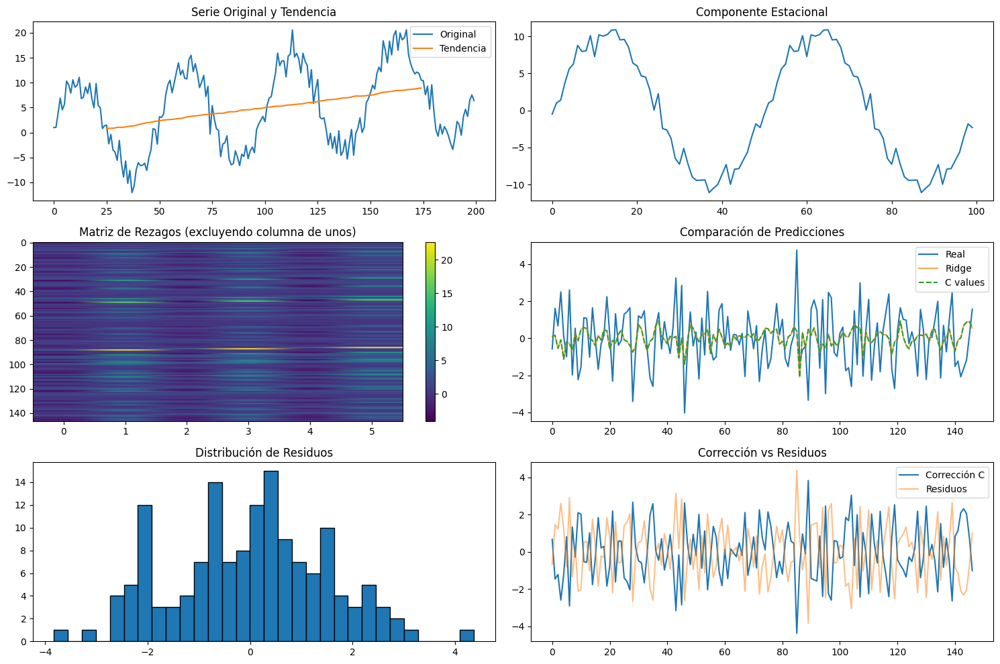

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.linear_model import Ridge

# Generar datos sintéticos con tendencia y estacionalidad
np.random.seed(42)
n_points = 200
time = np.arange(n_points)
trend = 0.05 * time
seasonality = 10 * np.sin(2 * np.pi * time / 50)
noise = np.random.normal(0, 2, n_points)
data = trend + seasonality + noise

# Función para crear matriz de rezagos con términos polinomiales
def create_lag_matrix(values, n_lags, degree=2):
    n = len(values) - n_lags
    X = np.ones((n, 1))
    for lag in range(n_lags):
        lagged = values[lag:lag+n].reshape(-1,1)
        X = np.hstack((X, lagged))
        if degree > 1:
            for d in range(2, degree+1):
                X = np.hstack((X, np.power(lagged, d)))
    y = values[n_lags:]
    return X, y

# Función de regularización adaptativa usando SVD
def adaptive_regularization(X):
    _, s, _ = np.linalg.svd(X)
    condition_number = s[0] / (s[-1] + 1e-10)
    return min(1.0, 1 / (condition_number + 1e-5))

# Parámetros del modelo
n_lags = 3
poly_degree = 2

# 1. Descomposición de la serie temporal
result = seasonal_decompose(data, period=50, model='additive')
detrended = data - result.trend
deseasonalized = detrended - result.seasonal

# 2. Crear matriz de diseño
X, y = create_lag_matrix(deseasonalized[~np.isnan(deseasonalized)], n_lags, poly_degree)

print(f"Forma de la matriz de diseño: {X.shape}")

display(X)
# 3. Calcular alpha adaptativo
alpha = adaptive_regularization(X)
print(f"Alpha calculado: {alpha:.4f}")

# 4. Entrenar modelo Ridge
model = Ridge(alpha=alpha, fit_intercept=False)
model.fit(X, y)
y_pred = model.predict(X)
print("Prediciones del modelo")
display(y_pred)
# 5. Calcular valores C
residuals = y - y_pred
print("Residuos del modelo Ridge:")
display(residuals)
XtX_inv = np.linalg.pinv(X.T @ X + alpha * np.eye(X.shape[1]))
correction = X @ XtX_inv @ X.T @ residuals
C = y_pred + correction

# Visualizaciones
plt.figure(figsize=(15, 10))

# Componentes de la serie
plt.subplot(3, 2, 1)
plt.plot(data, label='Original')
plt.plot(result.trend, label='Tendencia')
plt.title("Serie Original y Tendencia")
plt.legend()

plt.subplot(3, 2, 2)
plt.plot(result.seasonal[:100], label='Estacionalidad')
plt.title("Componente Estacional")

# Matriz de diseño
plt.subplot(3, 2, 3)
plt.imshow(X[:,1:], aspect='auto', cmap='viridis')
plt.colorbar()
plt.title("Matriz de Rezagos (excluyendo columna de unos)")

# Predicciones vs Real
plt.subplot(3, 2, 4)
plt.plot(y, label='Real')
plt.plot(y_pred, label='Ridge', alpha=0.7)
plt.plot(C, label='C values', linestyle='--')
plt.title("Comparación de Predicciones")
plt.legend()

# Residuos
plt.subplot(3, 2, 5)
plt.hist(residuals, bins=30, edgecolor='k')
plt.title("Distribución de Residuos")

# Evolución de C vs y
plt.subplot(3, 2, 6)
plt.plot(C - y, label='Corrección C')
plt.plot(residuals, label='Residuos', alpha=0.5)
plt.title("Corrección vs Residuos")
plt.legend()

plt.tight_layout()
plt.show()

In [24]:
import numpy as np
import pandas as pd

def create_lag_matrix(values, n_lags, degree=3):
    """Crea una matriz de retardos y el vector objetivo."""
    n = len(values) - n_lags  # Número de filas disponibles
    X = np.ones((n, 1))  # Columna de unos para el intercepto
    
    for lag in range(n_lags):
        lagged = values[lag:lag+n].reshape(-1,1)
        X = np.hstack((X, lagged))
        
        if degree > 1:
            for d in range(2, degree+1):
                X = np.hstack((X, np.power(lagged, d)))
    
    y = values[n_lags:]  # Valores objetivo
    return X, y

# Valores de la serie temporal
values = np.array([10, 20, 30, 40, 50, 60])

# Crear la matriz de retardos con n_lags=2 y degree=2
X, y = create_lag_matrix(values, n_lags=2, degree=3)

# Convertir a DataFrame para visualizar mejor
df_X = pd.DataFrame(X)
df_y = pd.DataFrame(y, columns=['y'])

# Mostrar la matriz X y el vector y
print("\nMatriz X (Variables Predictoras):")
print(df_X)
print("\nVector y (Valores Objetivo):")
print(df_y)



Matriz X (Variables Predictoras):
     0     1       2        3     4       5         6
0  1.0  10.0   100.0   1000.0  20.0   400.0    8000.0
1  1.0  20.0   400.0   8000.0  30.0   900.0   27000.0
2  1.0  30.0   900.0  27000.0  40.0  1600.0   64000.0
3  1.0  40.0  1600.0  64000.0  50.0  2500.0  125000.0

Vector y (Valores Objetivo):
    y
0  30
1  40
2  50
3  60


# Modelo TimeseriesDistribution

## Model CPnewModelQn

In [17]:
import numpy as np
import pandas as pd
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.linear_model import Ridge
from bayes_opt import BayesianOptimization
from scipy.stats import wasserstein_distance
from sklearn.utils import check_random_state

class CPnewModelQn:
    def __init__(self, n_lags=5, rho=0.95, max_points=1000, alpha=0.1, poly_degree=2, 
                 seasonal_periods=None, random_state=42):
        self.n_lags = n_lags
        self.rho = rho
        self.max_points = max_points
        self.alpha = alpha
        self.poly_degree = poly_degree
        self.seasonal_periods = seasonal_periods if seasonal_periods is not None else []
        self.mean_val = None
        self.std_val = None
        self.trend_models = []
        self.seasonal_models = []
        self.random_state = random_state
        self.rng = check_random_state(random_state)
        np.random.seed(random_state)

    def optimize_hyperparameters(self, df, real_noise):
        def objective(n_lags, rho, poly_degree):
            try:
                n_lags = int(round(n_lags))
                rho = np.clip(rho, 0.5, 0.99)
                poly_degree = int(round(poly_degree))
                
                max_seasonal = max(self.seasonal_periods) if self.seasonal_periods else 0
                if len(df) < 2 * n_lags + 2 * max_seasonal:
                    return -1e12
                
                self.n_lags = n_lags
                self.rho = rho
                self.poly_degree = poly_degree
                
                distribution = self.fit_predict(df)
                if not distribution:
                    return -1e12
                
                values = np.array([d['value'] for d in distribution])
                probs = np.array([d['probability'] for d in distribution])
                samples = self.rng.choice(values, size=1000, p=probs/probs.sum())
                
                min_len = min(len(samples), len(real_noise))
                return -wasserstein_distance(samples[:min_len], real_noise[:min_len])
            
            except Exception as e:
                print(f"Error en objective: {e}")
                return -1e12

        optimizer = BayesianOptimization(
            f=objective,
            pbounds={'n_lags': (3, 8), 'rho': (0.6, 0.97), 'poly_degree': (1, 3)},
            random_state=self.random_state,
            allow_duplicate_points=True
        )
        
        try:
            optimizer.maximize(init_points=5, n_iter=10)
            if optimizer.max:
                best = optimizer.max['params']
                self.n_lags = int(round(best['n_lags']))
                self.rho = best['rho']
                self.poly_degree = int(round(best['poly_degree']))
        except Exception as e:
            print(f"Error en optimización: {str(e)}")
        
        return self.n_lags, self.rho, self.poly_degree

    def _decompose(self, series):
        residual = series.copy()
        self.trend_models = []
        self.seasonal_models = []
        
        for period in self.seasonal_periods:
            if len(residual) < 2 * period:
                continue
            
            try:
                decomp = seasonal_decompose(residual, period=period, model='additive', extrapolate_trend='freq')
                trend = decomp.trend
                seasonal = decomp.seasonal
                
                # Modelado de tendencia
                X = np.arange(len(trend)).reshape(-1, 1)
                valid = ~np.isnan(trend)
                if np.sum(valid) > 1:
                    model = Ridge(alpha=self.alpha).fit(X[valid], trend[valid])
                    trend_pred = model.predict(X)
                else:
                    trend_pred = np.zeros_like(trend)
                
                # Modelado estacional
                seasonal_model = np.zeros(period)
                seasonal_indices = np.tile(np.arange(period), len(residual) // period + 1)[:len(residual)]
                for i in range(period):
                    mask = seasonal_indices == i
                    if np.any(mask):
                        seasonal_model[i] = np.nanmean(seasonal[mask])
                seasonal_series = seasonal_model[seasonal_indices]
                
                residual = residual - trend_pred - seasonal_series
                self.trend_models.append(model if np.sum(valid) > 1 else None)
                self.seasonal_models.append(seasonal_model)
            except Exception as e:
                print(f"Error en descomposición: {e}")
                continue
        
        residual = np.nan_to_num(residual, nan=np.nanmedian(residual))
        return residual

    def _calculate_C(self, X, y, weights):
        model = Ridge(alpha=self.alpha, fit_intercept=False)
        model.fit(X, y, sample_weight=weights)
        y_pred = model.predict(X)
        return y_pred

    def _Qn_distribution(self, C, original_length):  # <- Parámetro añadido
        sorted_C = np.sort(C)
        n = len(sorted_C)
        distribution = []
        
        # Usar original_length para predicción
        next_trend = sum(
            model.predict([[original_length + 1]])[0]  # <- original_length usado aquí
            for model in self.trend_models 
            if model is not None
        )
        next_seasonal = sum(
            model[(len(C)+1) % len(model)] 
            for model in self.seasonal_models 
            if len(model) > 0
        )
        
        # Generar distribución según definición formal
        for i in range(n):
            current_val = sorted_C[i]
            
            # Desnormalizar valor
            denorm = current_val * self.std_val + self.mean_val
            full_value = denorm + next_trend + next_seasonal
            
            # Asignar intervalo según posición
            lower_prob = i / (n + 1)
            upper_prob = (i + 1) / (n + 1)
            
            # Manejar valores duplicados (combinar intervalos)
            if i > 0 and np.isclose(current_val, sorted_C[i-1]):
                # Fusionar con el anterior
                distribution[-1]['probability'] = upper_prob - distribution[-1]['lower']
                distribution[-1]['upper'] = upper_prob
            else:
                distribution.append({
                    'value': full_value,
                    'lower': lower_prob,
                    'upper': upper_prob,
                    'probability': upper_prob - lower_prob
                })
        
        return distribution
    def fit_predict(self, df):
        try:
            values = df['valor'].values if isinstance(df, pd.DataFrame) else df
            if len(values) < self.n_lags * 2:
                print("Error: Datos insuficientes para el modelo.")
                return []
            
            residual = self._decompose(values)
            self.mean_val = np.nanmean(residual)
            self.std_val = np.nanstd(residual) + 1e-8
            normalized = (residual - self.mean_val) / self.std_val
            
            if len(normalized) <= self.n_lags:
                print("Error: Normalización resultó en datos insuficientes.")
                return []
            
            # Construcción de características
            X = np.zeros((len(normalized) - self.n_lags, self.n_lags * self.poly_degree))
            for i in range(self.n_lags):
                lag = normalized[i: len(normalized) - (self.n_lags - i)]
                for d in range(1, self.poly_degree + 1):
                    X[:, i * self.poly_degree + (d - 1)] = lag ** d
            
            y = normalized[self.n_lags:]
            
            if X.shape[0] == 0:
                print("Error: Matriz X vacía.")
                return []
            
            # Aplicación de pesos temporales
            weights = self.rho ** np.arange(X.shape[0])[::-1]
            weights /= weights.sum()
            
            C = self._calculate_C(X, y, weights)
            return self._Qn_distribution(C, original_length=len(values))
        
        except Exception as e:
            print(f"Error en fit_predict: {str(e)}")
            return []

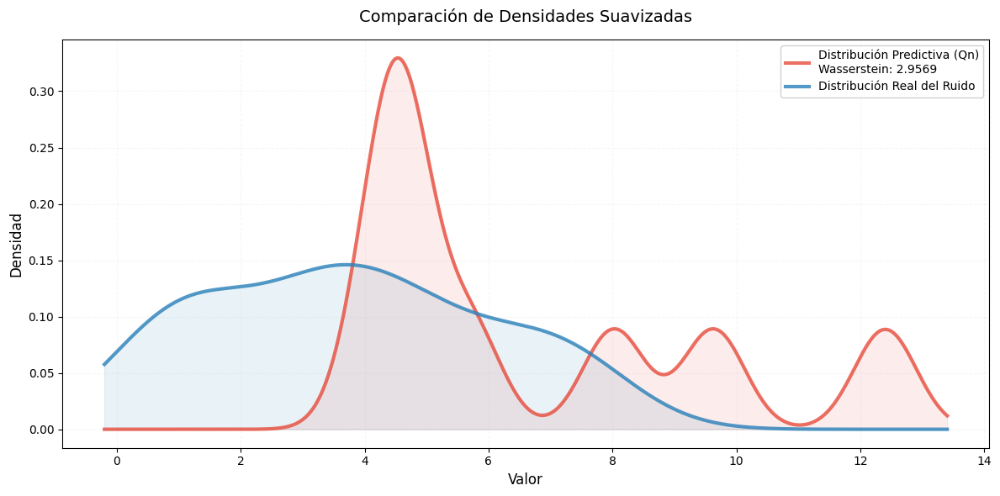

In [22]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import gaussian_kde, wasserstein_distance, norm

# 1. Generar datos y obtener distribución Qn
def create_controlled_data():
    time = np.arange(10)
    trend = 0.5 * time
    seasonal = 2 * np.sin(time)
    noise = np.array([0.8, 1.2, 1.2, 3.4, 3.4, 3.4, 5.0, 5.0, 7.1, 7.1])
    values = trend + seasonal + noise
    return pd.DataFrame({'valor': values}), noise

df, real_noise = create_controlled_data()

# Configurar y ejecutar modelo
model = CPnewModelQn(
    n_lags=2,
    poly_degree=1,
    seasonal_periods=[],
    rho=0.9,
    alpha=0.1
)

# Obtener distribución predictiva
distribution = model.fit_predict(df)

# 2. Procesar distribuciones
# Distribución Qn (discreta)
qn_values = np.array([d['value'] for d in distribution])
qn_probs = np.array([d['probability'] for d in distribution])

# Distribución real (empírica continua)
kde_real = gaussian_kde(real_noise)
x_range = np.linspace(min(qn_values.min(), real_noise.min()) - 1, 
                     max(qn_values.max(), real_noise.max()) + 1, 
                     1000)
BW = 0.5 

# KDE para Qn (construcción manual con pesos)
qn_kde = np.zeros_like(x_range)
for val, prob in zip(qn_values, qn_probs):
    qn_kde += prob * norm.pdf(x_range, loc=val, scale=BW)  # Suma de kernels ponderados

# KDE para ruido real (estimación estándar)
kde_real = gaussian_kde(real_noise, bw_method=BW)

# 3. Configurar gráfico profesional
# ------------------------------------------------------------
plt.figure(figsize=(12, 6))

# Curva Qn
plt.plot(x_range, qn_kde, color='#e74c3c', linewidth=3, alpha=0.8,
        label=f'Distribución Predictiva (Qn)\nWasserstein: {w_dist:.4f}')

# Curva real
plt.plot(x_range, kde_real(x_range), color='#2980b9', linewidth=3, alpha=0.8,
        label='Distribución Real del Ruido')

# Estilo
plt.title('Comparación de Densidades Suavizadas', fontsize=14, pad=15)
plt.xlabel('Valor', fontsize=12)
plt.ylabel('Densidad', fontsize=12)
plt.xticks(fontsize=10)
plt.yticks(fontsize=10)
plt.grid(alpha=0.1, linestyle='--')
plt.legend(fontsize=10, loc='upper right', framealpha=0.9)

# Área bajo curvas
plt.fill_between(x_range, qn_kde, color='#e74c3c', alpha=0.1)
plt.fill_between(x_range, kde_real(x_range), color='#2980b9', alpha=0.1)

plt.tight_layout()
plt.show()